# MSc. Thesis, urban noise prediction

# Tampere

## Download data

In [1]:
import pandas as pd
import numpy as np
from sqlalchemy import create_engine, text

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import f1_score

from adapt.instance_based import TrAdaBoost
from sklearn.neural_network import MLPClassifier
from sklearn.utils.validation import check_X_y
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from lightgbm import LGBMClassifier
import xgboost as xgb

from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_sample_weight

from sklearn.cluster import KMeans
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import GridSearchCV

In [2]:
# Add username, password and database name
user = 'postgres'
password = 'Gilman'
host = 'localhost'
port = '5432'
database = 'gon_thesis_db'

# Create the connection string
conn_str = f'postgresql://{user}:{password}@{host}:{port}/{database}'

engine_cloud = create_engine(conn_str)
query = "SELECT * FROM new_sampled;"
df = pd.DataFrame( engine_cloud.connect().execute(text(query)) )
# df = pd.read_sql(query, engine)

order_noise = ['alle 45 dB', '45-50 dB', '50-55 dB', '55-60 dB', '60-65 dB', '65-70 dB', '70-75 dB', 'yli 75 dB']

# Convert to ordered categorical
df["sound_blocked"] = pd.Categorical(df["sound_blocked"]).codes
df["build_blocks_road"] = pd.Categorical(df["build_blocks_road"]).codes

df["d_noise_lvl"] = pd.Categorical(df["d_noise_lvl"], categories=order_noise, ordered=True).codes
df = df[df["d_noise_lvl"] != -1] # Drop when label is Null

# Noise
df["n_noise_lvl"] = pd.Categorical(df["n_noise_lvl"], categories=order_noise, ordered=True).codes
# df = df[df["n_noise_lvl"] != -1] # Drop when label is Null

order = ['alle 45 dB', '45-50 dB', '50-55 dB', '55-60 dB', 
         '60-65 dB', '65-70 dB', '70-75 dB', 'yli 75 dB']
order_num = [0, 1, 2, 3, 4, 5, 6, 7]

#### Columns

In [3]:
columns_del = ["geom", "id", "date", "n_noise_lvl", "d_noise_lvl"]
columns_d = ["d_count_1", "d_count_2", "d_count_3", "d_count_4", "d_count_5", "d_count_6", "d_count_7", "d_count_9",
            "d_speed_1", "d_speed_2", "d_speed_3", "d_speed_4", "d_speed_5", "d_speed_6", "d_speed_7", "d_speed_9",
            "d_count_light", "d_count_heavy", "d_speed_light", "d_speed_heavy"]
columns_n = ["n_count_1", "n_count_2", "n_count_3", "n_count_4", "n_count_5", "n_count_6", "n_count_7", "n_count_9",
            "n_speed_1", "n_speed_2", "n_speed_3", "n_speed_4", "n_speed_5", "n_speed_6", "n_speed_7", "n_speed_9",
            "n_count_light", "n_count_heavy", "n_speed_light", "n_speed_heavy"]

columns_drop = columns_del + columns_n

X = df.drop(columns_drop, axis=1)
y = df["d_noise_lvl"]
# y = df["n_noise_lvl"]
num_classes = len(y.unique())

# Move 'build_blocks_road' to the last column
cols = list(X.columns)
cols.remove('build_blocks_road')
cols.append('build_blocks_road')
X = X[cols]

In [4]:
from shapely import wkb

# 1. parse out x,y from your WKB hex
df["geometry"] = df["geom"].apply(lambda h: wkb.loads(bytes.fromhex(h)))
df["x"] = df["geometry"].apply(lambda p: p.x)
df["y"] = df["geometry"].apply(lambda p: p.y)
X["x"], X["y"] = df["x"], df["y"]

In [5]:
not_avail = ['log_dist_block', 'sound_blocked', 'crossing_200m', 'traffic_light_200m']
X = X.drop(not_avail, axis=1)

X

,log_dist_motorway,motorway_length_12_5m,motorway_length_25m,motorway_length_50m,motorway_length_100m,motorway_length_200m,motorway_length_400m,motorway_length_800m,motorway_length_1600m,log_dist_trunk,...,d_count_light,d_count_heavy,d_speed_light,d_speed_heavy,log_tms_station,log_tms_road,log_build_dist,build_blocks_road,x,y
0,7.846487,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.376051,5.638355,4.306408,0,329382.045104,6.823036e+06
1,7.846687,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.399941,5.638355,4.411135,0,329395.922887,6.823031e+06
2,7.846924,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.423332,5.638355,4.507697,0,329409.803494,6.823025e+06
3,7.847153,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.446294,5.638355,4.609733,0,329423.642418,6.823019e+06
4,7.847356,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.468858,5.638355,4.713890,0,329437.422327,6.823013e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35963,7.845124,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.250235,5.638355,3.383943,1,329311.861415,6.823063e+06
35964,7.845562,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.276023,5.638355,3.605622,1,329326.102303,6.823058e+06
35965,7.845887,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.301583,5.638355,3.794315,1,329340.221368,6.823053e+06
35966,7.846203,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.638355,...,25329.303571,741.517857,61.812954,60.568435,6.326690,5.638355,3.968190,1,329354.300772,6.823048e+06


In [6]:
motorway_lengths = [
    "motorway_length_12_5m", "motorway_length_25m", "motorway_length_50m",
    "motorway_length_100m", "motorway_length_200m", "motorway_length_400m",
    "motorway_length_800m", "motorway_length_1600m"
]

trunk_lengths = [
    "trunk_length_12_5m", 
    "trunk_length_25m", 
    "trunk_length_50m",
    'trunk_length_100m',
    'trunk_length_200m',
    'trunk_length_400m',
    'trunk_length_800m',
    'trunk_length_1600m',
]

primary_lengths = [
    "primary_length_12_5m", 
    "primary_length_25m", 
    "primary_length_50m",
    'primary_length_100m',
    'primary_length_200m',
    'primary_length_400m',
    'primary_length_800m',
    'primary_length_1600m',
]

secondary_lengths = [
    "secondary_length_12_5m", 
    "secondary_length_25m", 
    "secondary_length_50m",
    'secondary_length_100m',
    'secondary_length_200m',
    'secondary_length_400m',
    'secondary_length_800m',
    'secondary_length_1600m',
]

tertiary_lengths = [
    "tertiary_length_12_5m", 
    "tertiary_length_25m", 
    "tertiary_length_50m",
    'tertiary_length_100m',
    'tertiary_length_200m',
    'tertiary_length_400m',
    'tertiary_length_800m',
    'tertiary_length_1600m',
]

residential_lengths = [
    "residential_length_12_5m", 
    "residential_length_25m", 
    "residential_length_50m",
    'residential_length_100m',
    'residential_length_200m',
    'residential_length_400m',
    'residential_length_800m',
    'residential_length_1600m',
]

building_densities = [
    "building_density_12_5m", 
    "building_density_25m", 
    "building_density_50m",
    'building_density_100m',
    'building_density_200m',
    'building_density_400m',
    'building_density_800m',
    'building_density_1600m',
]

building_tpi = [
    "building_tpi_12_5m", 
    "building_tpi_25m", 
    "building_tpi_50m",
    'building_tpi_100m',
    'building_tpi_200m',
    'building_tpi_400m',
    'building_tpi_800m',
    'building_tpi_1600m',
]

local_build_height = [
    "local_build_height_12_5m", 
    "local_build_height_25m", 
    "local_build_height_50m",
    'local_build_height_100m',
    'local_build_height_200m',
    'local_build_height_400m',
    'local_build_height_800m',
    'local_build_height_1600m',
]

avg_building_height = [
    "avg_building_height_12_5m", 
    "avg_building_height_25m", 
    "avg_building_height_50m",
    'avg_building_height_100m',
    'avg_building_height_200m',
    'avg_building_height_400m',
    'avg_building_height_800m',
    'avg_building_height_1600m',
]

elevation_tpi = [
    "elevation_tpi_12_5m", 
    "elevation_tpi_25m", 
    "elevation_tpi_50m",
    'elevation_tpi_100m',
    'elevation_tpi_200m',
    'elevation_tpi_400m',
    'elevation_tpi_800m',
    'elevation_tpi_1600m',
]

log_dist = [
    'log_dist_motorway',
    'log_dist_trunk',
    'log_dist_primary',
    'log_dist_secondary',
    'log_dist_tertiary',
    'log_dist_residential',
    'log_dist_water',
    'log_pub_road',
    'log_build_dist',
    'log_tms_station',
    'log_tms_road',
    'log_dist_pub'
]

count_d = ["d_count_1", "d_count_2", "d_count_3", "d_count_4", "d_count_5", "d_count_6", "d_count_7", "d_count_9",
            "d_count_light", "d_count_heavy"]

speed_d = ["d_speed_1", "d_speed_2", "d_speed_3", "d_speed_4", "d_speed_5", "d_speed_6", "d_speed_7", "d_speed_9",
            "d_speed_light", "d_speed_heavy"]

other = ["x", "y", "elevation_dem", "build_blocks_road", "tmsnumber", 'crossing_200m', 'traffic_light_200m']

buffer_groups = [
    motorway_lengths, trunk_lengths, primary_lengths, secondary_lengths,
    tertiary_lengths, residential_lengths, building_densities,
    building_tpi, elevation_tpi
]
other_groups = [
    local_build_height, avg_building_height,
    log_dist, count_d, speed_d, other
]

groups = [
    motorway_lengths, trunk_lengths, primary_lengths, secondary_lengths,
    tertiary_lengths, residential_lengths, building_densities,
    building_tpi, elevation_tpi,
    local_build_height, avg_building_height,
    log_dist, count_d, speed_d, other
]

# Random Split

In [ ]:
X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

print(len(X_cv0))
print(len(X_test0))

32187
3577


## XGB

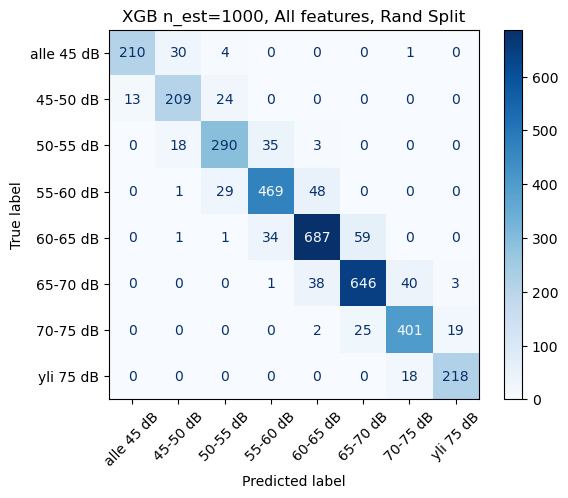

Balanced Accuracy: 0.8736
F1 Score (Macro): 0.8740
Features used: 124


In [7]:
X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

xgb_clf0 = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)
xgb_clf0.fit(X_cv0, y_cv0)

# Evaluate on test set
pred_test0 = xgb_clf0.predict(X_test0)

cm = confusion_matrix(y_test0, pred_test0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("XGB n_est=1000, All features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_test0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_test0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

In [8]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from joblib import Parallel, delayed

def select_features_by_group(clf, X, buffer_groups, other_groups, buffer_thresh=0.1, other_thresh=0.1):
    importances = clf.feature_importances_
    df = pd.DataFrame({'importance': importances}, index=X.columns)
    df_norm = (df - df.min()) / (df.max() - df.min())

    kept_feats = set()
    # Process buffer groups
    for grp in buffer_groups:
        if not grp:
            continue
        grp_importances = df_norm.loc[grp, 'importance']
        above_thresh = grp_importances[grp_importances > buffer_thresh]
        if not above_thresh.empty:
            kept_feats.update(above_thresh.index.tolist())
        else:
            kept_feats.add(grp_importances.idxmax())
    # Process other groups
    for grp in other_groups:
        if not grp:
            continue
        above_thresh = df_norm.loc[grp, 'importance'] > other_thresh
        kept_feats.update(df_norm.loc[grp][above_thresh].index.tolist())
    return list(kept_feats)

def get_stable_features(feature_selection_per_fold, min_counts=3):
    from collections import defaultdict
    counts = defaultdict(int)
    for features in feature_selection_per_fold:
        for f in features:
            counts[f] += 1
    return [f for f, cnt in counts.items() if cnt >= min_counts]

def process_fold(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh):
    X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    clf = xgb.XGBClassifier(objective="multi:softmax", num_class=num_classes,n_estimators=50,random_state=42)
    clf.fit(X_train, y_train)
    feats = select_features_by_group(clf, X_train, buffer_groups, other_groups, buffer_thresh, buffer_thresh)
    return {
        'features': feats,
        'val_acc': balanced_accuracy_score(y_val, clf.predict(X_val)),
        'val_f1': f1_score(y_val, clf.predict(X_val), average='macro'),
        'val_idx': val_idx
    }

def cross_val_feature_selection(X_features, y, splits, buffer_groups, other_groups, buffer_thresh):
    results = Parallel(n_jobs=-1, verbose=0)(
        delayed(process_fold)(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh)
        for train_idx, val_idx in splits
    )
    selected_features = [res['features'] for res in results]
    avg_val_acc = np.mean([res['val_acc'] for res in results])
    avg_val_f1s = np.mean([res['val_f1'] for res in results])
    return selected_features, avg_val_acc, avg_val_f1s

def evaluate_stable_features(X_features, y, splits, stable_features):
    accuracies = []
    f1s = []
    for train_idx, val_idx in splits:
        X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        clf = xgb.XGBClassifier(objective="multi:softmax", num_class=num_classes,n_estimators=50,random_state=42)
        clf.fit(X_train[stable_features], y_train)
        accuracies.append(balanced_accuracy_score(y_val, clf.predict(X_val[stable_features])))
        f1s.append(f1_score(y_val, clf.predict(X_val[stable_features]), average='macro'))
    return np.mean(accuracies), np.mean(f1s)

# --- Main routine ---
# original = [-1]
# threshold_values1 = [0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10,0.11,0.12,0.13,0.14,0.15]
# threshold_values2 = [0.16,0.17,0.18,0.19,0.2,0.21,0.22,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.3]
# threshold_values = original + threshold_values1 # + threshold_values2

threshold_values = [0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10]

# Data preparation
# 1. Random train/test split
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)
# X_cv = X_cv.drop(columns=['tmsnumber'])

# 2. StratifiedKFold cross-validation
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
splits = list(skf.split(X_cv, y_cv))

# 3. Filter feature groups after split
available_features = set(X_cv.columns)
filtered_buffer = [[f for f in grp if f in available_features] for grp in buffer_groups]
filtered_other = [[f for f in grp if f in available_features] for grp in other_groups]

# Main optimization loop
feature_selection_records = []
last_acc = None

for thresh in threshold_values:
    # Cross-validation with parallel processing
    features_per_fold, avg_acc, avg_f1 = cross_val_feature_selection(
        X_cv, y_cv, splits, filtered_buffer, filtered_other, thresh
    )
    
    # Stable feature selection
    stable_feats = get_stable_features(features_per_fold, 3)
    
    # Evaluate stable features
    stable_acc, stable_f1 = evaluate_stable_features(X_cv, y_cv, splits, stable_feats)
    
    # Record results
    feature_selection_records.append({
        'buffer_thresh': thresh,
        'num_features': len(stable_feats),
        'old_avg_val_acc': avg_acc,
        'new_avg_val_acc': stable_acc,
        'old_avg_val_f1': avg_f1,
        'new_avg_val_f1': stable_f1,
        'features': stable_feats
    })
    
    # Early stopping check
    if last_acc is not None and (last_acc - stable_acc) > 0.1:
        print("Early stopping triggered")
        break
    last_acc = stable_acc

# Results analysis
results_df = pd.DataFrame(feature_selection_records)
results_df[['buffer_thresh', 'num_features', 'old_avg_val_acc', 'new_avg_val_acc', 'old_avg_val_f1', 'new_avg_val_f1']]

,buffer_thresh,num_features,old_avg_val_acc,new_avg_val_acc,old_avg_val_f1,new_avg_val_f1
0,0.00,116,0.830751,0.832860,0.830954,0.832860
1,0.01,116,0.830751,0.830859,0.830954,0.830834
2,0.02,112,0.830751,0.833644,0.830954,0.833620
3,0.03,109,0.830751,0.832308,0.830954,0.832438
4,0.04,94,0.830751,0.831421,0.830954,0.831741
5,0.05,80,0.830751,0.834132,0.830954,0.833889
6,0.06,65,0.830751,0.832525,0.830954,0.831911
7,0.07,58,0.830751,0.827880,0.830954,0.827451
8,0.08,49,0.830751,0.823790,0.830954,0.823005
9,0.09,44,0.830751,0.820293,0.830954,0.820019


In [ ]:
results_df['val_acc_improvement'] = results_df['new_avg_val_acc'] - results_df['old_avg_val_acc']

# 1. Decide how much drop in val_acc you are willing to accept from the best (e.g., 0.001)
positive_rows = results_df[results_df['val_acc_improvement'] > 0]

# 2. Find best accuracy among these
best_acc = positive_rows['new_avg_val_acc'].max()

# 3. Only consider rows within tolerance of best
close_enough = positive_rows[positive_rows['new_avg_val_acc'] >= best_acc - 0.002]

# 4. Pick the one with the fewest features
best_simple_idx = close_enough['num_features'].idxmin()
best_simple_row = close_enough.loc[best_simple_idx]

# 5. Selected features
selected_xgb = best_simple_row['features']

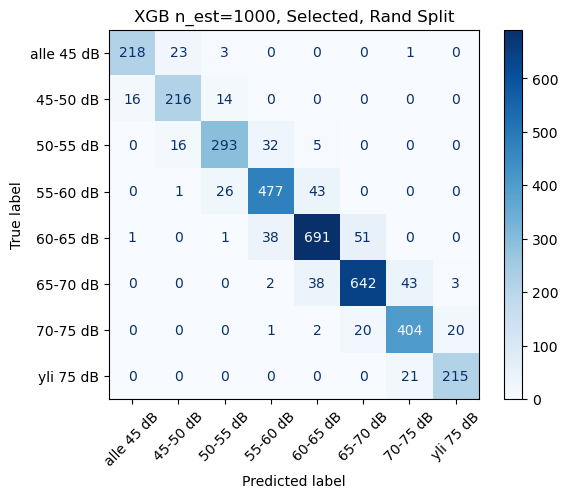

Balanced Accuracy: 0.8834
F1 Score (Macro): 0.8828
Features used: 65


In [10]:
# selected = stable_features
# selected_xgb = results_df['features'].iloc[4]

xgb_clf1 = xgb.XGBClassifier(
        objective="multi:softmax",
        num_class=len(np.unique(y)),
        eval_metric="mlogloss",
        n_estimators=1000,
        random_state=42
    )
xgb_clf1.fit(X_cv[selected_xgb], y_cv)

# Evaluate on test set
pred_test1 = xgb_clf1.predict(X_test[selected_xgb])
# Confusion Matrix
cm = confusion_matrix(y_test, pred_test1, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("XGB n_est=1000, Selected, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_test1):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_test1, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_xgb].columns)}")


### plots

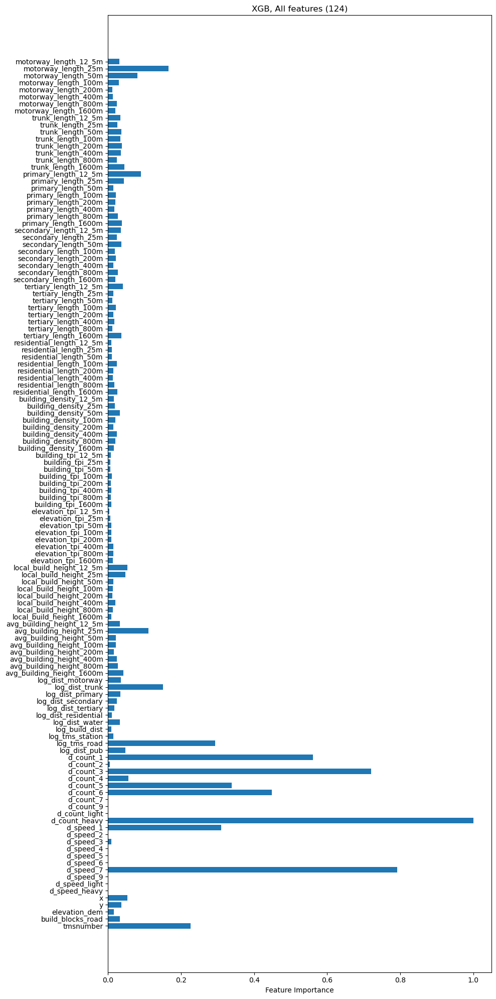

In [11]:
# Calculate feature importances
importances = xgb_clf0.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv0.columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title("XGB, All features (124)")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

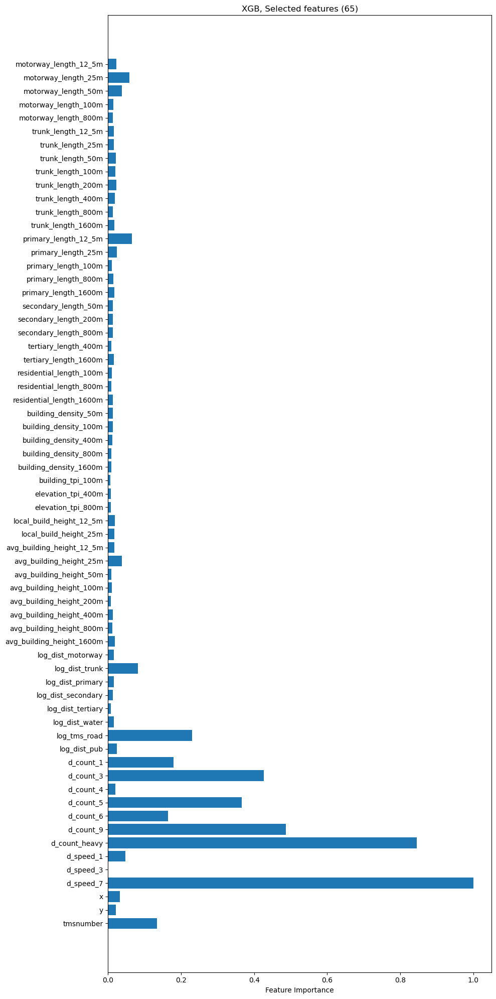

In [12]:
# Calculate feature importances
importances = xgb_clf1.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv[selected_xgb].columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title(f"XGB, Selected features ({len(selected_xgb)})")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

## RF

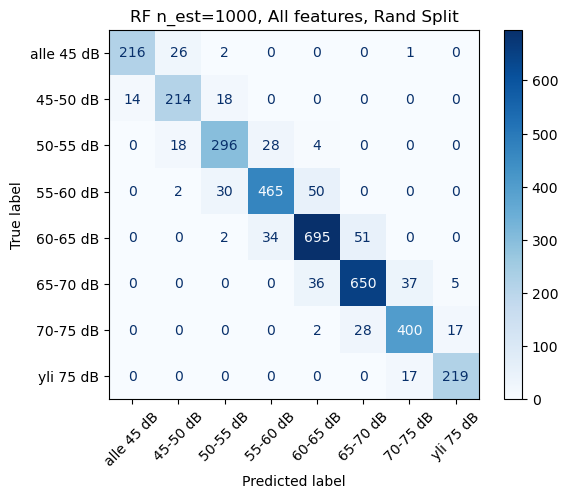

Balanced Accuracy: 0.8827
F1 Score (Macro): 0.8822
Features used: 124


In [103]:
X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

rf_clf0 = RandomForestClassifier(
        n_estimators=1000,
        max_depth=None,
        random_state=42,
        n_jobs=-1
    )
rf_clf0.fit(X_cv0, y_cv0)

# Evaluate on test set
pred_test0 = rf_clf0.predict(X_test0)

cm = confusion_matrix(y_test0, pred_test0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("RF n_est=1000, All features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_test0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_test0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

In [14]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from joblib import Parallel, delayed

def select_features_by_group(clf, X, buffer_groups, other_groups, buffer_thresh=0.1, other_thresh=0.1):
    importances = clf.feature_importances_
    df = pd.DataFrame({'importance': importances}, index=X.columns)
    df_norm = (df - df.min()) / (df.max() - df.min())

    kept_feats = set()
    # Process buffer groups
    for grp in buffer_groups:
        if not grp:
            continue
        grp_importances = df_norm.loc[grp, 'importance']
        above_thresh = grp_importances[grp_importances > buffer_thresh]
        if not above_thresh.empty:
            kept_feats.update(above_thresh.index.tolist())
        else:
            kept_feats.add(grp_importances.idxmax())
    # Process other groups
    for grp in other_groups:
        if not grp:
            continue
        above_thresh = df_norm.loc[grp, 'importance'] > other_thresh
        kept_feats.update(df_norm.loc[grp][above_thresh].index.tolist())
    return list(kept_feats)

def get_stable_features(feature_selection_per_fold, min_counts=3):
    from collections import defaultdict
    counts = defaultdict(int)
    for features in feature_selection_per_fold:
        for f in features:
            counts[f] += 1
    return [f for f, cnt in counts.items() if cnt >= min_counts]

def process_fold(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh):
    X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    clf = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=1)
    clf.fit(X_train, y_train)
    feats = select_features_by_group(clf, X_train, buffer_groups, other_groups, buffer_thresh, buffer_thresh)
    return {
        'features': feats,
        'val_acc': balanced_accuracy_score(y_val, clf.predict(X_val)),
        'val_f1': f1_score(y_val, clf.predict(X_val), average='macro'),
        'val_idx': val_idx
    }

def cross_val_feature_selection(X_features, y, splits, buffer_groups, other_groups, buffer_thresh):
    results = Parallel(n_jobs=-1, verbose=0)(
        delayed(process_fold)(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh)
        for train_idx, val_idx in splits
    )
    selected_features = [res['features'] for res in results]
    avg_val_acc = np.mean([res['val_acc'] for res in results])
    avg_val_f1s = np.mean([res['val_f1'] for res in results])
    return selected_features, avg_val_acc, avg_val_f1s

def evaluate_stable_features(X_features, y, splits, stable_features):
    accuracies = []
    f1s = []
    for train_idx, val_idx in splits:
        X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        clf = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=-1)
        clf.fit(X_train[stable_features], y_train)
        accuracies.append(balanced_accuracy_score(y_val, clf.predict(X_val[stable_features])))
        f1s.append(f1_score(y_val, clf.predict(X_val[stable_features]), average='macro'))
    return np.mean(accuracies), np.mean(f1s)

# --- Main routine ---
# original = [-1]
# threshold_values1 = [0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10,0.11,0.12,0.13,0.14,0.15]
# threshold_values2 = [0.16,0.17,0.18,0.19,0.2,0.21,0.22,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.3]
# threshold_values = original + threshold_values1 # + threshold_values2

threshold_values = [-1,0,0.05,0.1,0.15,0.2]

# Data preparation
# 1. Random train/test split
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)
# X_cv = X_cv.drop(columns=['tmsnumber'])

# 2. StratifiedKFold cross-validation
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
splits = list(skf.split(X_cv, y_cv))

# 3. Filter feature groups after split
available_features = set(X_cv.columns)
filtered_buffer = [[f for f in grp if f in available_features] for grp in buffer_groups]
filtered_other = [[f for f in grp if f in available_features] for grp in other_groups]

# Main optimization loop
feature_selection_records = []
last_acc = None

for thresh in threshold_values:
    # Cross-validation with parallel processing
    features_per_fold, avg_acc, avg_f1 = cross_val_feature_selection(
        X_cv, y_cv, splits, filtered_buffer, filtered_other, thresh
    )
    
    # Stable feature selection
    stable_feats = get_stable_features(features_per_fold, 3)
    
    # Evaluate stable features
    stable_acc, stable_f1 = evaluate_stable_features(X_cv, y_cv, splits, stable_feats)
    
    # Record results
    feature_selection_records.append({
        'buffer_thresh': thresh,
        'num_features': len(stable_feats),
        'old_avg_val_acc': avg_acc,
        'new_avg_val_acc': stable_acc,
        'old_avg_val_f1': avg_f1,
        'new_avg_val_f1': stable_f1,
        'features': stable_feats
    })
    
    # Early stopping check
    if last_acc is not None and (last_acc - stable_acc) > 0.1:
        print("Early stopping triggered")
        break
    last_acc = stable_acc

# Results analysis
results_df = pd.DataFrame(feature_selection_records)
results_df[['buffer_thresh', 'num_features', 'old_avg_val_acc', 'new_avg_val_acc', 'old_avg_val_f1', 'new_avg_val_f1']]

,buffer_thresh,num_features,old_avg_val_acc,new_avg_val_acc,old_avg_val_f1,new_avg_val_f1
0,-1.00,124,0.865625,0.868180,0.866351,0.868570
1,0.00,124,0.865625,0.865343,0.866351,0.865761
2,0.05,97,0.865625,0.864901,0.866351,0.865323
3,0.10,75,0.865625,0.864122,0.866351,0.864384
4,0.15,60,0.865625,0.866460,0.866351,0.866687
5,0.20,47,0.865625,0.866393,0.866351,0.866775


In [15]:
results_df['val_acc_improvement'] = results_df['new_avg_val_acc'] - results_df['old_avg_val_acc']

# 1. Decide how much drop in val_acc you are willing to accept from the best (e.g., 0.001)
positive_rows = results_df[results_df['val_acc_improvement'] > 0]

# 2. Find best accuracy among these
best_acc = positive_rows['new_avg_val_acc'].max()

# 3. Only consider rows within tolerance of best
close_enough = positive_rows[positive_rows['new_avg_val_acc'] >= best_acc - 0.002]

# 4. Pick the one with the fewest features
best_simple_idx = close_enough['num_features'].idxmin()
best_simple_row = close_enough.loc[best_simple_idx]

# 5. Selected features
selected_rf = best_simple_row['features']

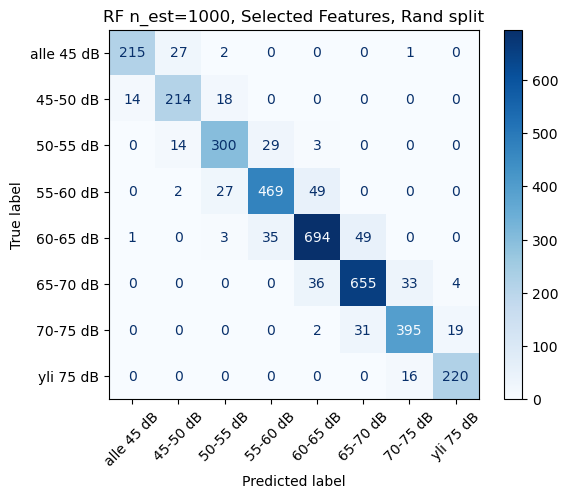

Balanced Accuracy: 0.8844
F1 Score (Macro): 0.8841
Features used: 47


In [16]:
rf_clf1 = RandomForestClassifier(
        n_estimators=1000,
        max_depth=None,
        random_state=42,
        n_jobs=-1
    )
rf_clf1.fit(X_cv[selected_rf], y_cv)

# Evaluate on test set
pred_test1 = rf_clf1.predict(X_test[selected_rf])
# Confusion Matrix
cm = confusion_matrix(y_test, pred_test1, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("RF n_est=1000, Selected Features, Rand split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_test1):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_test1, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_rf].columns)}")

### plots

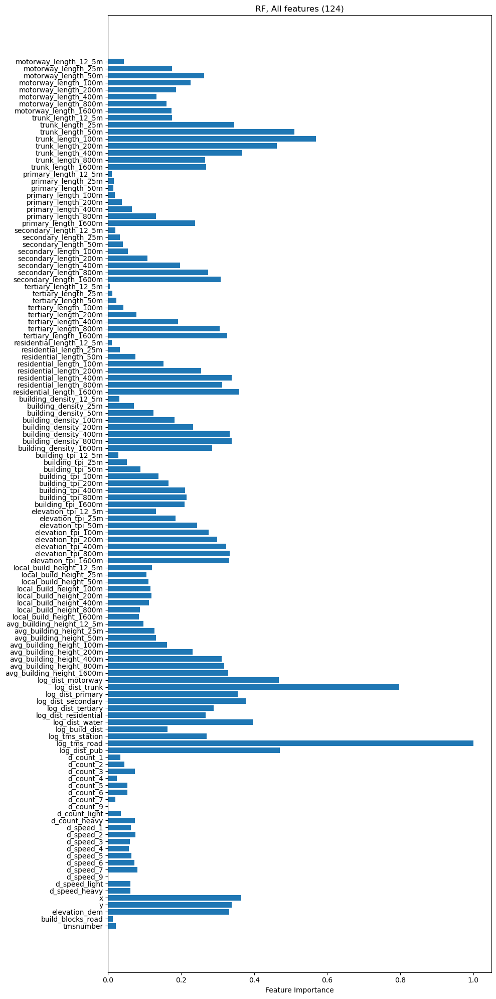

In [17]:
# Calculate feature importances
importances = rf_clf0.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv0.columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title("RF, All features (124)")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

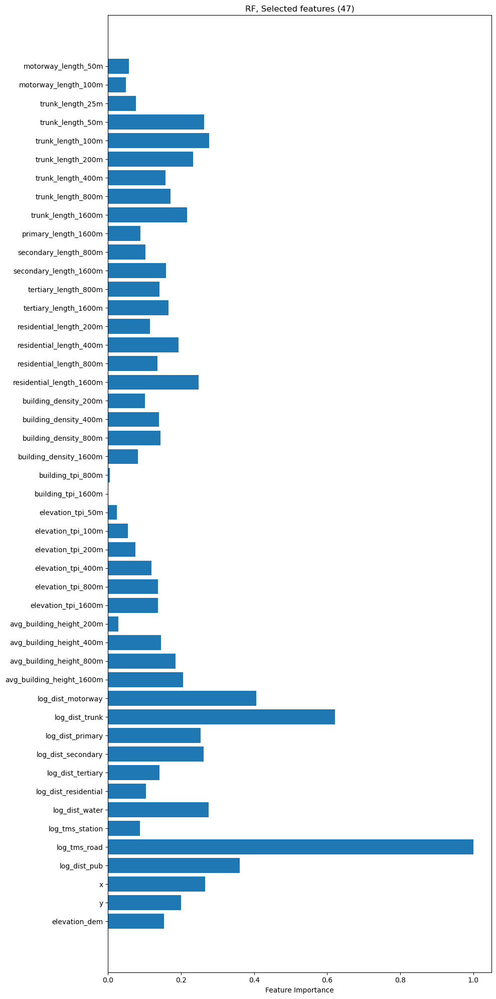

In [18]:
# Calculate feature importances
importances = rf_clf1.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv[selected_rf].columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title(f"RF, Selected features ({len(selected_rf)})")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

## LightGBM

In [19]:
X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

lgbm_clf0 = LGBMClassifier(
    objective='multiclass',
    num_class=num_classes,
    n_estimators=1000,
    random_state=42
)
lgbm_clf0.fit(X_cv0, y_cv0)

# Evaluate on test set
pred_test0 = lgbm_clf0.predict(X_test0)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24770
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 124
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

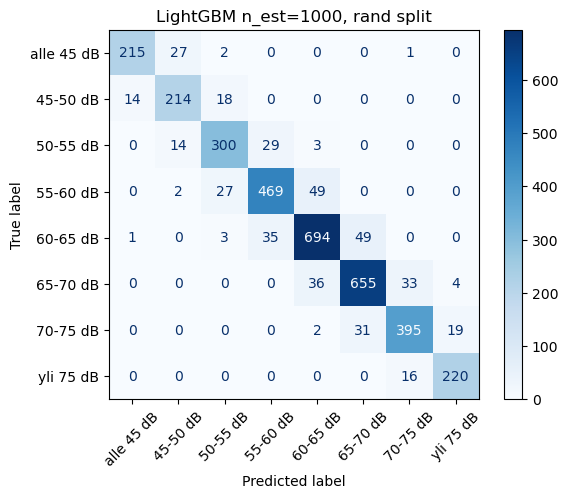

Balanced Accuracy: 0.8811
F1 Score (Macro): 0.8813
Features used: 124


In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_test, pred_test0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("LightGBM n_est=1000, rand split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_test0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_test0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

In [25]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from joblib import Parallel, delayed

def select_features_by_group(clf, X, buffer_groups, other_groups, buffer_thresh=0.1, other_thresh=0.1):
    importances = clf.feature_importances_
    df = pd.DataFrame({'importance': importances}, index=X.columns)
    df_norm = (df - df.min()) / (df.max() - df.min())

    kept_feats = set()
    # Process buffer groups
    for grp in buffer_groups:
        if not grp:
            continue
        grp_importances = df_norm.loc[grp, 'importance']
        above_thresh = grp_importances[grp_importances > buffer_thresh]
        if not above_thresh.empty:
            kept_feats.update(above_thresh.index.tolist())
        else:
            kept_feats.add(grp_importances.idxmax())
    # Process other groups
    for grp in other_groups:
        if not grp:
            continue
        above_thresh = df_norm.loc[grp, 'importance'] > other_thresh
        kept_feats.update(df_norm.loc[grp][above_thresh].index.tolist())
    return list(kept_feats)

def get_stable_features(feature_selection_per_fold, min_counts=3):
    from collections import defaultdict
    counts = defaultdict(int)
    for features in feature_selection_per_fold:
        for f in features:
            counts[f] += 1
    return [f for f, cnt in counts.items() if cnt >= min_counts]

def process_fold(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh):
    X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    clf = LGBMClassifier(objective='multiclass', num_class=num_classes, n_estimators=50, random_state=42)
    clf.fit(X_train, y_train)
    feats = select_features_by_group(clf, X_train, buffer_groups, other_groups, buffer_thresh, buffer_thresh)
    return {
        'features': feats,
        'val_acc': balanced_accuracy_score(y_val, clf.predict(X_val)),
        'val_f1': f1_score(y_val, clf.predict(X_val), average='macro'),
        'val_idx': val_idx
    }

def cross_val_feature_selection(X_features, y, splits, buffer_groups, other_groups, buffer_thresh):
    results = Parallel(n_jobs=-1, verbose=0)(
        delayed(process_fold)(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh)
        for train_idx, val_idx in splits
    )
    selected_features = [res['features'] for res in results]
    avg_val_acc = np.mean([res['val_acc'] for res in results])
    avg_val_f1s = np.mean([res['val_f1'] for res in results])
    return selected_features, avg_val_acc, avg_val_f1s

def evaluate_stable_features(X_features, y, splits, stable_features):
    accuracies = []
    f1s = []
    for train_idx, val_idx in splits:
        X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        clf = LGBMClassifier(objective='multiclass', num_class=num_classes, n_estimators=50, random_state=42)
        clf.fit(X_train[stable_features], y_train)
        accuracies.append(balanced_accuracy_score(y_val, clf.predict(X_val[stable_features])))
        f1s.append(f1_score(y_val, clf.predict(X_val[stable_features]), average='macro'))
    return np.mean(accuracies), np.mean(f1s)

# --- Main routine ---
# original = [-1]
# threshold_values1 = [0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10,0.11,0.12,0.13,0.14,0.15]
# threshold_values2 = [0.16,0.17,0.18,0.19,0.2,0.21,0.22,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.3]
# threshold_values = original + threshold_values1 # + threshold_values2

threshold_values = [0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10,0.11,0.12,0.14,0.15]

# Data preparation
# 1. Random train/test split
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)
# X_cv = X_cv.drop(columns=['tmsnumber'])

# 2. StratifiedKFold cross-validation
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
splits = list(skf.split(X_cv, y_cv))

# 3. Filter feature groups after split
available_features = set(X_cv.columns)
filtered_buffer = [[f for f in grp if f in available_features] for grp in buffer_groups]
filtered_other = [[f for f in grp if f in available_features] for grp in other_groups]

# Main optimization loop
feature_selection_records = []
last_acc = None

for thresh in threshold_values:
    # Cross-validation with parallel processing
    features_per_fold, avg_acc, avg_f1 = cross_val_feature_selection(
        X_cv, y_cv, splits, filtered_buffer, filtered_other, thresh
    )
    
    # Stable feature selection
    stable_feats = get_stable_features(features_per_fold, 3)
    
    # Evaluate stable features
    stable_acc, stable_f1 = evaluate_stable_features(X_cv, y_cv, splits, stable_feats)
    
    # Record results
    feature_selection_records.append({
        'buffer_thresh': thresh,
        'num_features': len(stable_feats),
        'old_avg_val_acc': avg_acc,
        'new_avg_val_acc': stable_acc,
        'old_avg_val_f1': avg_f1,
        'new_avg_val_f1': stable_f1,
        'features': stable_feats
    })
    
    # Early stopping check
    if last_acc is not None and (last_acc - stable_acc) > 0.1:
        print("Early stopping triggered")
        break
    last_acc = stable_acc

# Results analysis
results_df = pd.DataFrame(feature_selection_records)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24549
[LightGBM] [Info] Number of data points in the train set: 28968, number of used features: 115
[LightGBM] [Info] Start training from score -2.683095
[LightGBM] [Info] Start training from score -2.678560
[LightGBM] [Info] Start training from score -2.337287
[LightGBM] [Info] Start training from score -1.878244
[LightGBM] [Info] Start training from score -1.519629
[LightGBM] [Info] Start training from score -1.591239
[LightGBM] [Info] Start training from score -2.079165
[LightGBM] [Info] Start training from score -2.717519
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col

In [26]:
results_df[['buffer_thresh', 'num_features', 'old_avg_val_acc', 'new_avg_val_acc', 'old_avg_val_f1', 'new_avg_val_f1']]

,buffer_thresh,num_features,old_avg_val_acc,new_avg_val_acc,old_avg_val_f1,new_avg_val_f1
0,0.00,115,0.819602,0.819263,0.819596,0.819427
1,0.01,111,0.819602,0.820202,0.819596,0.820408
2,0.02,105,0.819602,0.817771,0.819596,0.818102
3,0.03,104,0.819602,0.818161,0.819596,0.818650
4,0.04,101,0.819602,0.818039,0.819596,0.818526
5,0.05,96,0.819602,0.819640,0.819596,0.819843
6,0.06,92,0.819602,0.817636,0.819596,0.817550
7,0.07,88,0.819602,0.816768,0.819596,0.817113
8,0.08,87,0.819602,0.818462,0.819596,0.818615
9,0.09,80,0.819602,0.821291,0.819596,0.821428


In [27]:
results_df['val_acc_improvement'] = results_df['new_avg_val_acc'] - results_df['old_avg_val_acc']

# 1. Decide how much drop in val_acc you are willing to accept from the best (e.g., 0.001)
positive_rows = results_df[results_df['val_acc_improvement'] > 0]

# 2. Find best accuracy among these
best_acc = positive_rows['new_avg_val_acc'].max()

# 3. Only consider rows within tolerance of best
close_enough = positive_rows[positive_rows['new_avg_val_acc'] >= best_acc - 0.002]

# 4. Pick the one with the fewest features
best_simple_idx = close_enough['num_features'].idxmin()
best_simple_row = close_enough.loc[best_simple_idx]

# 5. Selected features
selected_lgbm = best_simple_row['features']

In [32]:
selected_lgbm = results_df['features'].iloc[9]

In [33]:
# selected_lgbm = results_df['features'].iloc[3]
lgbm_clf1 = LGBMClassifier(
    objective='multiclass',
    num_class=num_classes,
    n_estimators=1000,
    random_state=42
)
lgbm_clf1.fit(X_cv[selected_lgbm], y_cv)

# Evaluate on test set
pred_test1 = lgbm_clf1.predict(X_test[selected_lgbm])

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18993
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 80
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

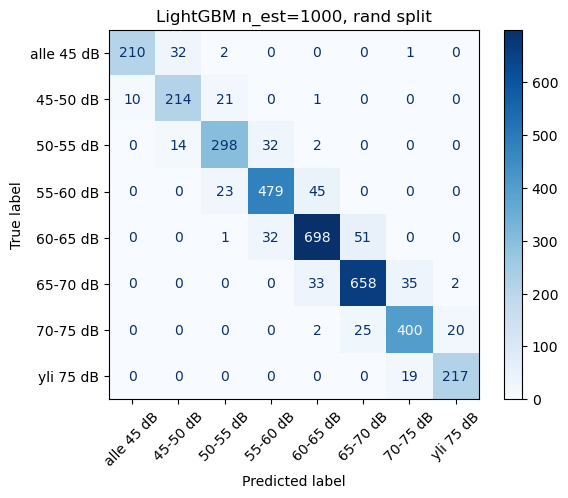

Balanced Accuracy: 0.8843
F1 Score (Macro): 0.8855
Features used: 80


In [34]:
# Confusion Matrix
cm = confusion_matrix(y_test, pred_test1, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("LightGBM n_est=1000, rand split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_test1):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_test1, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_lgbm].columns)}")

### plots

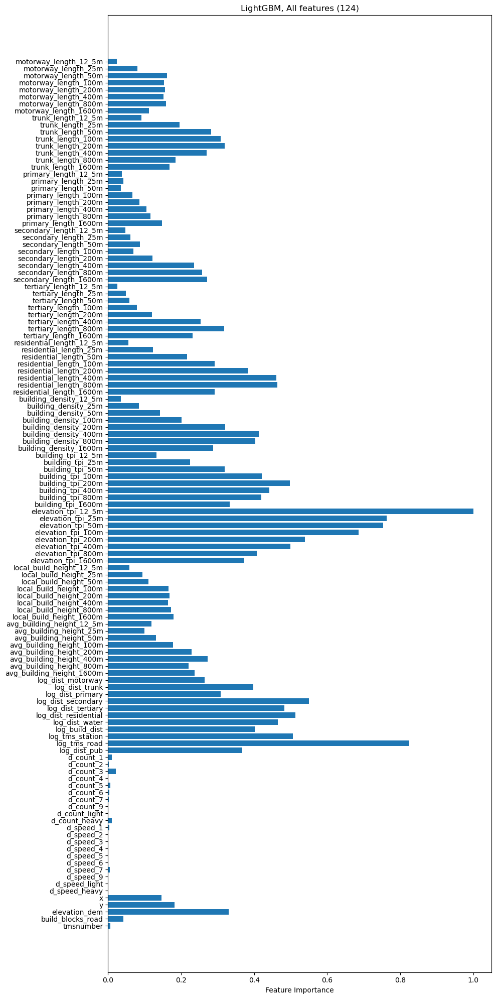

In [35]:
# Calculate feature importances
importances = lgbm_clf0.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv0.columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title("LightGBM, All features (124)")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

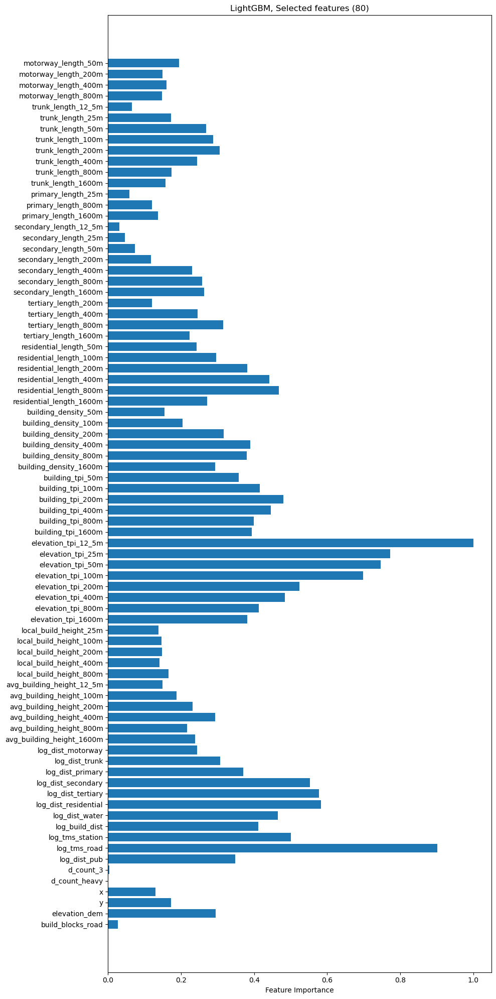

In [36]:
# Calculate feature importances
importances = lgbm_clf1.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv[selected_lgbm].columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title(f"LightGBM, Selected features ({len(selected_lgbm)})")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

## MLP

In [ ]:
selected_xgb

['trunk_length_50m',
 'trunk_length_25m',
 'secondary_length_200m',
 'trunk_length_1600m',
 'residential_length_100m',
 'motorway_length_12_5m',
 'log_dist_water',
 'motorway_length_25m',
 'primary_length_25m',
 'primary_length_800m',
 'motorway_length_800m',
 'local_build_height_12_5m',
 'primary_length_1600m',
 'trunk_length_12_5m',
 'residential_length_1600m',
 'avg_building_height_12_5m',
 'log_dist_primary',
 'tertiary_length_1600m',
 'avg_building_height_1600m',
 'x',
 'elevation_tpi_800m',
 'd_count_3',
 'd_count_5',
 'tmsnumber',
 'log_dist_trunk',
 'trunk_length_200m',
 'log_dist_tertiary',
 'trunk_length_800m',
 'd_count_heavy',
 'primary_length_12_5m',
 'log_dist_secondary',
 'primary_length_100m',
 'avg_building_height_25m',
 'avg_building_height_800m',
 'y',
 'avg_building_height_100m',
 'secondary_length_50m',
 'building_density_50m',
 'motorway_length_50m',
 'local_build_height_25m',
 'd_count_6',
 'd_count_4',
 'd_speed_1',
 'building_density_100m',
 'd_speed_3',
 'log_

In [ ]:
selected_rf

['log_dist_tertiary',
 'y',
 'elevation_tpi_200m',
 'elevation_tpi_800m',
 'log_dist_primary',
 'elevation_tpi_1600m',
 'avg_building_height_1600m',
 'x',
 'elevation_dem',
 'trunk_length_1600m',
 'tertiary_length_800m',
 'motorway_length_50m',
 'log_tms_road',
 'trunk_length_100m',
 'residential_length_400m',
 'log_dist_water',
 'log_dist_trunk',
 'log_dist_secondary',
 'building_density_400m',
 'elevation_tpi_100m',
 'log_dist_motorway',
 'building_tpi_1600m',
 'primary_length_1600m',
 'trunk_length_25m',
 'secondary_length_800m',
 'secondary_length_1600m',
 'trunk_length_400m',
 'elevation_tpi_400m',
 'tertiary_length_1600m',
 'trunk_length_50m',
 'log_dist_residential',
 'log_dist_pub',
 'log_tms_station',
 'residential_length_1600m',
 'residential_length_200m',
 'trunk_length_200m',
 'residential_length_800m',
 'building_density_800m',
 'avg_building_height_400m',
 'avg_building_height_800m',
 'building_density_1600m',
 'elevation_tpi_50m',
 'building_density_200m',
 'motorway_len

In [66]:
selected_lgbm

['trunk_length_50m',
 'log_tms_station',
 'residential_length_200m',
 'avg_building_height_200m',
 'local_build_height_200m',
 'log_tms_road',
 'elevation_tpi_800m',
 'avg_building_height_400m',
 'building_tpi_200m',
 'building_tpi_1600m',
 'motorway_length_50m',
 'trunk_length_12_5m',
 'building_tpi_100m',
 'trunk_length_200m',
 'residential_length_800m',
 'trunk_length_800m',
 'local_build_height_800m',
 'secondary_length_400m',
 'secondary_length_800m',
 'secondary_length_200m',
 'building_tpi_400m',
 'y',
 'primary_length_25m',
 'avg_building_height_12_5m',
 'motorway_length_400m',
 'secondary_length_1600m',
 'log_build_dist',
 'elevation_tpi_12_5m',
 'building_density_1600m',
 'log_dist_residential',
 'log_dist_pub',
 'local_build_height_100m',
 'log_dist_trunk',
 'trunk_length_25m',
 'building_density_100m',
 'tertiary_length_1600m',
 'log_dist_primary',
 'avg_building_height_1600m',
 'residential_length_100m',
 'building_density_400m',
 'residential_length_400m',
 'trunk_length_

In [37]:
combined_features = list(set(selected_xgb + selected_rf + selected_lgbm))

print(len(selected_xgb))
print(len(selected_rf))
print(len(selected_lgbm))
print(len(combined_features))

65
47
80
97


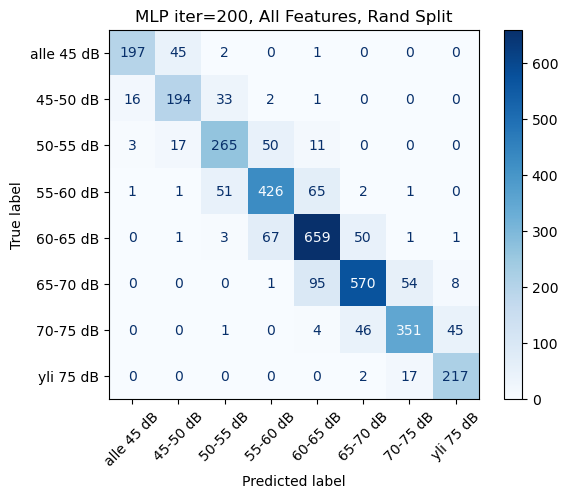

Balanced Accuracy: 0.8085
F1 Score (Macro): 0.8063
Features used: 124


In [49]:
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

mlp_clf0 = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf0.fit(X_cv0, y_cv0)
pred_mlp0 = mlp_clf0.predict(X_test0)

# Confusion Matrix
cm = confusion_matrix(y_test0, pred_mlp0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, All Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_mlp0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_mlp0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

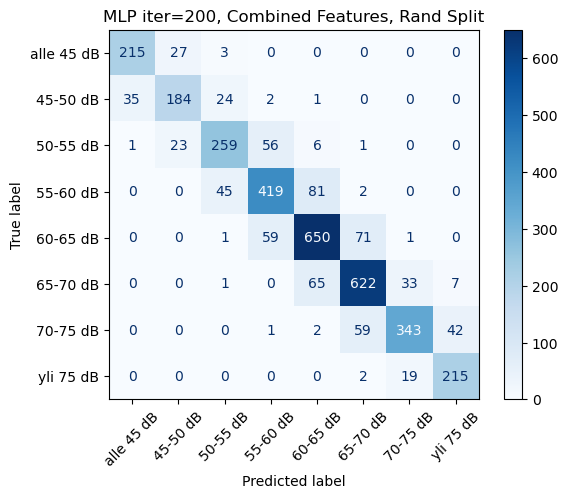

Balanced Accuracy: 0.8130
F1 Score (Macro): 0.8125
Features used: 97


In [46]:
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

mlp_clf_comb = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf_comb.fit(X_cv[combined_features], y_cv)
pred_mlp_1 = mlp_clf_comb.predict(X_test[combined_features])

# Confusion Matrix
cm = confusion_matrix(y_test, pred_mlp_1, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, Combined Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_mlp_1):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_mlp_1, average='macro'):.4f}")
print(f"Features used: {len(X_cv[combined_features].columns)}")

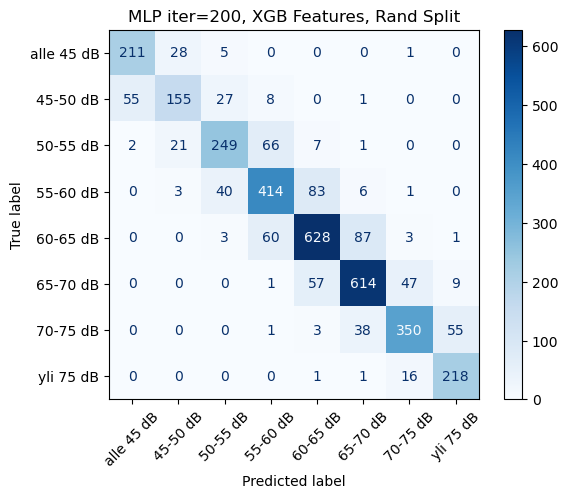

Balanced Accuracy: 0.7901
F1 Score (Macro): 0.7864
Features used: 65


In [47]:
mlp_clf_xgb = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf_xgb.fit(X_cv[selected_xgb], y_cv)
pred_mlp_xgb = mlp_clf_xgb.predict(X_test[selected_xgb])

# Confusion Matrix
cm = confusion_matrix(y_test, pred_mlp_xgb, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, XGB Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_mlp_xgb):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_mlp_xgb, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_xgb].columns)}")

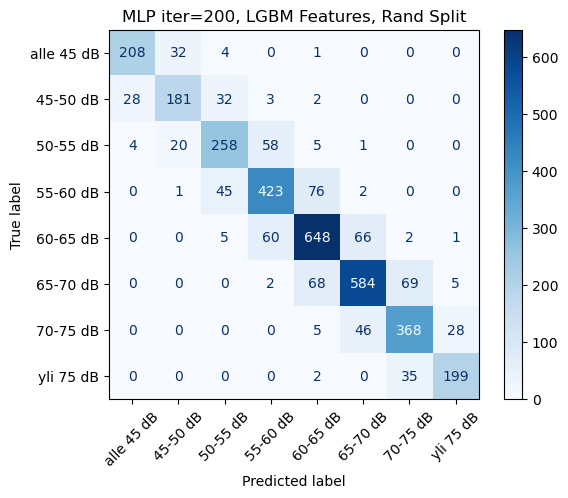

Balanced Accuracy: 0.8001
F1 Score (Macro): 0.8019
Features used: 80


In [48]:
mlp_clf_lgbm = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)


mlp_clf_lgbm.fit(X_cv[selected_lgbm], y_cv)
pred_mlp_lgbm = mlp_clf_lgbm.predict(X_test[selected_lgbm])

# Confusion Matrix
cm = confusion_matrix(y_test, pred_mlp_lgbm, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, LGBM Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_mlp_lgbm):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_mlp_lgbm, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_lgbm].columns)}")

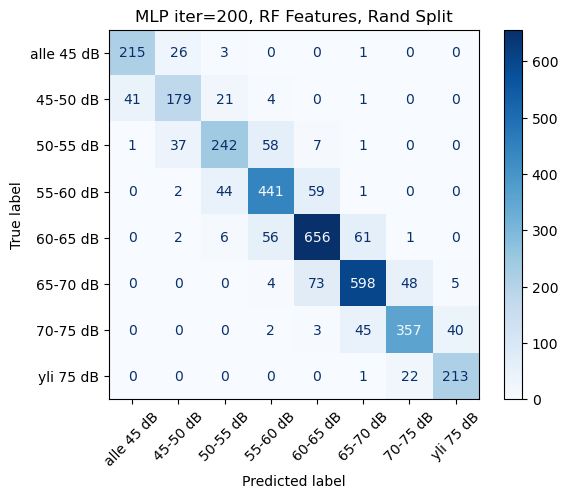

Balanced Accuracy: 0.8090
F1 Score (Macro): 0.8062
Features used: 47


In [54]:
mlp_clf_rf = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf_rf.fit(X_cv[selected_rf], y_cv)
pred_mlp_rf = mlp_clf_rf.predict(X_test[selected_rf])

# Confusion Matrix
cm = confusion_matrix(y_test, pred_mlp_rf, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, RF Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_mlp_rf):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_mlp_rf, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_rf].columns)}")

## Ensemble

In [55]:
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier

# Define individual models
xgb_clf_e = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)

mlp_clf_e = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

lgbm_clf_e = LGBMClassifier(
    objective='multiclass',
    num_class=num_classes,
    n_estimators=1000,
    random_state=42
)

rf_clf_e = RandomForestClassifier(
    n_estimators=1000,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)

In [51]:
X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

ensemble_1 = VotingClassifier(
    estimators=[
        ('xgb', xgb_clf_e),
        ('mlp', mlp_clf_e),
        ('lgbm', lgbm_clf_e),
        ('rf', rf_clf_e)
    ],
    voting='soft'
)
ensemble_1.fit(X_cv0, y_cv0)
pred_1 = ensemble_1.predict(X_test0)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24770
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 124
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

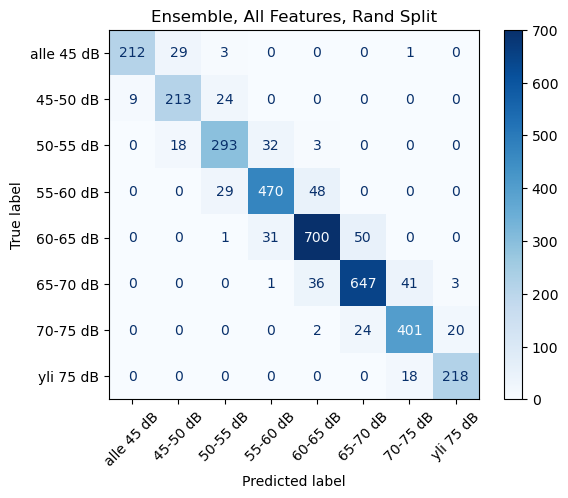

Balanced Accuracy: 0.8802
F1 Score (Macro): 0.8806


In [52]:
# Confusion Matrix
cm = confusion_matrix(y_test0, pred_1, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensemble, All Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_1):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_1, average='macro'):.4f}")

In [56]:
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

ensemble_2 = VotingClassifier(
    estimators=[
        ('xgb', xgb_clf_e),
        ('mlp', mlp_clf_e),
        ('lgbm', lgbm_clf_e),
        ('rf', rf_clf_e)
    ],
    voting='soft'
)
ensemble_2.fit(X_cv[combined_features], y_cv)
pred_2 = ensemble_2.predict(X_test[combined_features])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20955
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 97
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

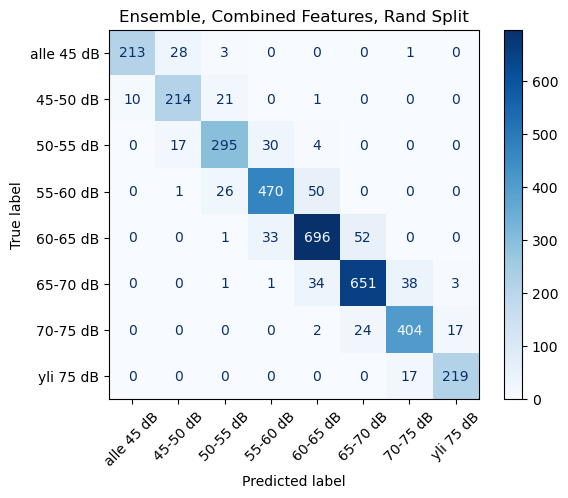

Balanced Accuracy: 0.8834
F1 Score (Macro): 0.8840
Features used: 97


In [57]:
# Confusion Matrix
cm = confusion_matrix(y_test, pred_2, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensemble, Combined Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_2):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_2, average='macro'):.4f}")
print(f"Features used: {len(X_cv[combined_features].columns)}")

In [58]:
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

ensemble_xgb = VotingClassifier(
    estimators=[
        ('xgb', xgb_clf_e),
        ('mlp', mlp_clf_e),
        ('lgbm', lgbm_clf_e),
        ('rf', rf_clf_e)
    ],
    voting='soft'
)
ensemble_xgb.fit(X_cv[selected_xgb], y_cv)
pred_xgb = ensemble_xgb.predict(X_test[selected_xgb])

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13213
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 65
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791


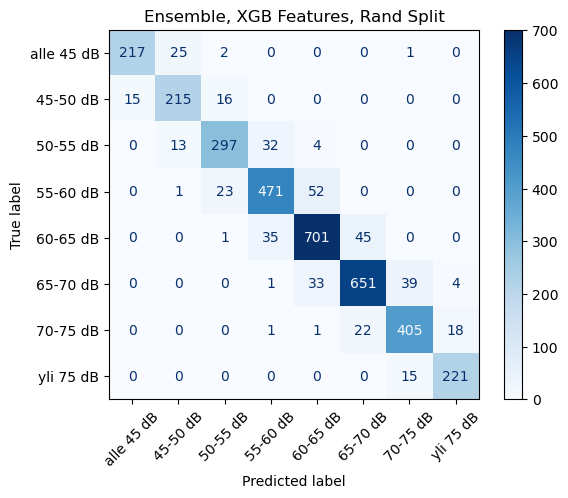

Balanced Accuracy: 0.8890
F1 Score (Macro): 0.8889
Features used: 97


In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_test, pred_xgb, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensemble, XGB Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_xgb):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_xgb, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_xgb].columns)}")

In [60]:
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

ensemble_lgbm = VotingClassifier(
    estimators=[
        ('xgb', xgb_clf_e),
        ('mlp', mlp_clf_e),
        ('lgbm', lgbm_clf_e),
        ('rf', rf_clf_e)
    ],
    voting='soft'
)
ensemble_lgbm.fit(X_cv[selected_lgbm], y_cv)
pred_lgbm = ensemble_lgbm.predict(X_test[selected_lgbm])

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18993
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 80
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

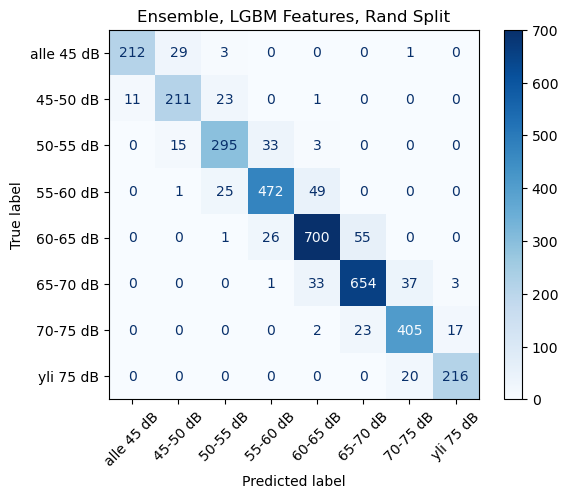

Balanced Accuracy: 0.8817
F1 Score (Macro): 0.8832
Features used: 97


In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_test, pred_lgbm, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensemble, LGBM Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_lgbm):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_lgbm, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_xgb].columns)}")

In [62]:
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

ensemble_rf = VotingClassifier(
    estimators=[
        ('xgb', xgb_clf_e),
        ('mlp', mlp_clf_e),
        ('lgbm', lgbm_clf_e),
        ('rf', rf_clf_e)
    ],
    voting='soft'
)
ensemble_rf.fit(X_cv[selected_rf], y_cv)
pred_rf = ensemble_rf.predict(X_test[selected_rf])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11947
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 47
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

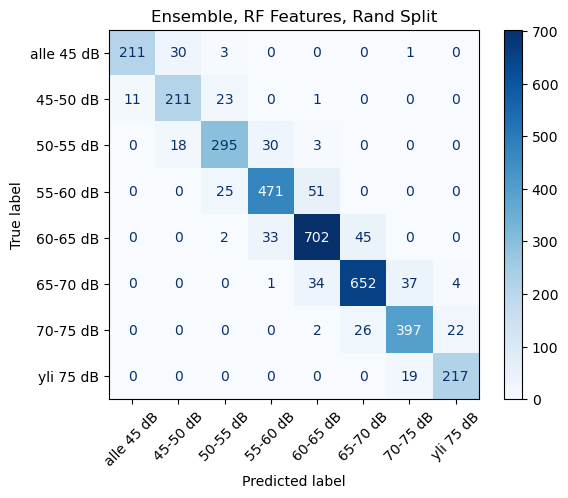

Balanced Accuracy: 0.8792
F1 Score (Macro): 0.8797
Features used: 97


In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_test, pred_rf, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensemble, RF Features, Rand Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_rf):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_rf, average='macro'):.4f}")
print(f"Features used: {len(X_cv[selected_rf].columns)}")

# TMS Split

In [8]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv0 = X[~mask_test].reset_index(drop=True)
y_cv0 = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test0 = X[mask_test].reset_index(drop=True)
y_test0 = y[mask_test].reset_index(drop=True)

print(len(X_cv0))
print(len(X_test0))

30178
5586


## sanity check

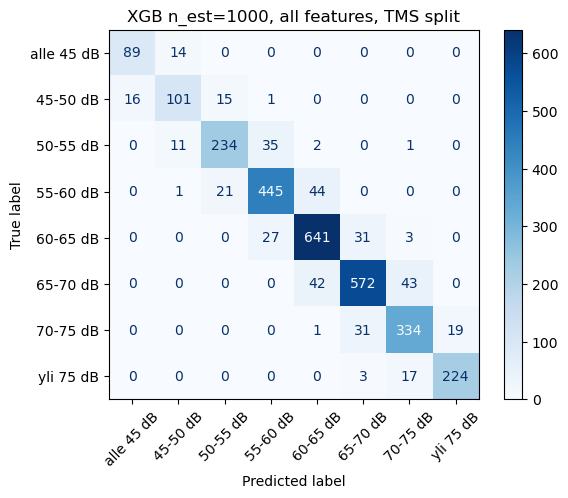

Balanced Accuracy: 0.8613
F1 Score (Macro): 0.8631
Features used: 124


In [33]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv0 = X[~mask_test].reset_index(drop=True)
y_cv0 = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test0 = X[mask_test].reset_index(drop=True)
y_test0 = y[mask_test].reset_index(drop=True)

X_train0, X_test01, y_train0, y_test01 = train_test_split(
    X_cv0, y_cv0, test_size=0.1, random_state=42
)

xgb_clf0 = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)
xgb_clf0.fit(X_train0, y_train0)

pred_test0 = xgb_clf0.predict(X_test01)

cm = confusion_matrix(y_test01, pred_test0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("XGB n_est=1000, all features, TMS split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test01, pred_test0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test01, pred_test0, average='macro'):.4f}")
print(f"Features used: {len(X_train0.columns)}")

## XGB TMS Split

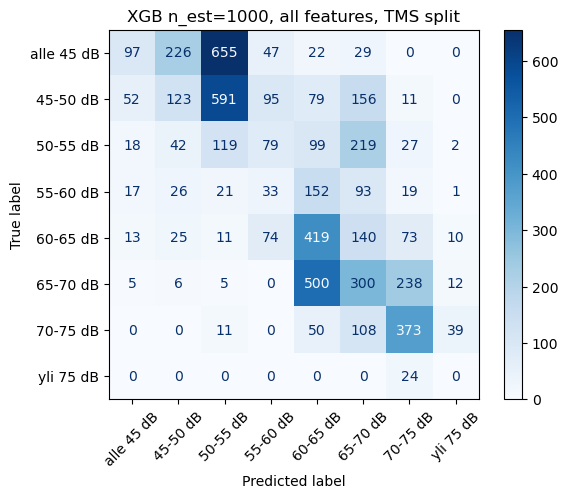

Balanced Accuracy: 0.2450
F1 Score (Macro): 0.2205
Features used: 124


In [ ]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv0 = X[~mask_test].reset_index(drop=True)
y_cv0 = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test0 = X[mask_test].reset_index(drop=True)
y_test0 = y[mask_test].reset_index(drop=True)

xgb_clf0 = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)
xgb_clf0.fit(X_cv0, y_cv0)

pred_test0 = xgb_clf0.predict(X_test0)

cm = confusion_matrix(y_test0, pred_test0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("XGB n_est=1000, all features, TMS split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_test0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_test0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

In [13]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import accuracy_score
from joblib import Parallel, delayed

def select_features_by_group(clf, X, buffer_groups, other_groups, buffer_thresh=0.1, other_thresh=0.1):
    importances = clf.feature_importances_
    df = pd.DataFrame({'importance': importances}, index=X.columns)
    df_norm = (df - df.min()) / (df.max() - df.min())

    kept_feats = set()
    # Process buffer groups
    for grp in buffer_groups:
        if not grp:
            continue
        grp_importances = df_norm.loc[grp, 'importance']
        above_thresh = grp_importances[grp_importances > buffer_thresh]
        if not above_thresh.empty:
            kept_feats.update(above_thresh.index.tolist())
        else:
            kept_feats.add(grp_importances.idxmax())
    # Process other groups
    for grp in other_groups:
        if not grp:
            continue
        above_thresh = df_norm.loc[grp, 'importance'] > other_thresh
        kept_feats.update(df_norm.loc[grp][above_thresh].index.tolist())
    return list(kept_feats)

def get_stable_features(feature_selection_per_fold, min_counts=3):
    from collections import defaultdict
    counts = defaultdict(int)
    for features in feature_selection_per_fold:
        for f in features:
            counts[f] += 1
    return [f for f, cnt in counts.items() if cnt >= min_counts]

def process_fold(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh):
    X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    clf = xgb.XGBClassifier(objective="multi:softmax", num_class=num_classes,n_estimators=50,random_state=42)
    clf.fit(X_train, y_train)
    feats = select_features_by_group(clf, X_train, buffer_groups, other_groups, buffer_thresh, buffer_thresh)
    return {
        'features': feats,
        'val_acc': balanced_accuracy_score(y_val, clf.predict(X_val)),
        'val_f1': f1_score(y_val, clf.predict(X_val), average='macro'),
        'val_idx': val_idx
    }

def cross_val_feature_selection(X_features, y, splits, buffer_groups, other_groups, buffer_thresh):
    results = Parallel(n_jobs=-1, verbose=0)(
        delayed(process_fold)(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh)
        for train_idx, val_idx in splits
    )
    selected_features = [res['features'] for res in results]
    avg_val_acc = np.mean([res['val_acc'] for res in results])

    avg_val_acc = np.mean([res['val_acc'] for res in results])
    avg_val_f1s = np.mean([res['val_f1'] for res in results])
    return selected_features, avg_val_acc, avg_val_f1s

def evaluate_stable_features(X_features, y, splits, stable_features):
    accuracies = []
    f1s = []
    for train_idx, val_idx in splits:
        X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        clf = xgb.XGBClassifier(objective="multi:softmax", num_class=num_classes,n_estimators=50,random_state=42)
        clf.fit(X_train[stable_features], y_train)
        accuracies.append(balanced_accuracy_score(y_val, clf.predict(X_val[stable_features])))
        f1s.append(f1_score(y_val, clf.predict(X_val[stable_features]), average='macro'))
    return np.mean(accuracies), np.mean(f1s)

# --- Main routine ---
threshold_values = [0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10]
tms_test = [455, 457]

# Data preparation
mask_test = X['tmsnumber'].isin(tms_test)
X_cv = X[~mask_test].reset_index(drop=True)
y_cv = y[~mask_test].reset_index(drop=True)
groups_cv = X_cv['tmsnumber']

# Precompute splits and filtered groups
kfold = GroupKFold(n_splits=10)  # Changed from LeaveOneGroupOut to GroupKFold
splits = list(kfold.split(X_cv, y_cv, groups=groups_cv))  # Removed slice, added groups= parameter
available_features = set(X_cv.columns) - {'tmsnumber'}
filtered_buffer = [[f for f in grp if f in available_features] for grp in buffer_groups]
filtered_other = [[f for f in grp if f in available_features] for grp in other_groups]
X_cv_features = X_cv.drop(columns=['tmsnumber'])

# Main optimization loop
feature_selection_records = []
last_acc = None

for thresh in threshold_values:
    # Cross-validation with parallel processing
    features_per_fold, avg_acc, avg_f1 = cross_val_feature_selection(
        X_cv_features, y_cv, splits, filtered_buffer, filtered_other, thresh
    )
    
    # Stable feature selection
    stable_feats = get_stable_features(features_per_fold, 5)
    
    # Evaluate stable features
    stable_acc, stable_f1  = evaluate_stable_features(X_cv_features, y_cv, splits, stable_feats)
        # Evaluate stable features
    stable_acc, stable_f1 = evaluate_stable_features(X_cv, y_cv, splits, stable_feats)
    
    # Record results
    feature_selection_records.append({
        'buffer_thresh': thresh,
        'num_features': len(stable_feats),
        'old_avg_val_acc': avg_acc,
        'new_avg_val_acc': stable_acc,
        'old_avg_val_f1': avg_f1,
        'new_avg_val_f1': stable_f1,
        'features': stable_feats
    })
    
    # Early stopping check
    if last_acc is not None and (last_acc - stable_acc) > 0.1:
        print("Early stopping triggered")
        break
    last_acc = stable_acc

# Results analysis
results_df = pd.DataFrame(feature_selection_records)
results_df[['buffer_thresh', 'num_features', 'old_avg_val_acc', 'new_avg_val_acc', 'old_avg_val_f1', 'new_avg_val_f1']]

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in

,buffer_thresh,num_features,old_avg_val_acc,new_avg_val_acc,old_avg_val_f1,new_avg_val_f1
0,0.00,113,0.304949,0.301381,0.267496,0.259018
1,0.01,113,0.304949,0.306592,0.267496,0.271840
2,0.02,109,0.304949,0.300233,0.267496,0.274277
3,0.03,102,0.304949,0.302806,0.267496,0.267680
4,0.04,82,0.304949,0.304886,0.267496,0.266182
5,0.05,66,0.304949,0.303425,0.267496,0.257628
6,0.06,54,0.304949,0.301102,0.267496,0.258774
7,0.07,38,0.304949,0.285420,0.267496,0.248631
8,0.08,35,0.304949,0.299743,0.267496,0.257716
9,0.09,31,0.304949,0.295173,0.267496,0.258026


In [20]:
features_xgb = results_df['features'].iloc[2]

features_xgb

['y',
 'primary_length_200m',
 'primary_length_100m',
 'elevation_dem',
 'primary_length_1600m',
 'secondary_length_50m',
 'log_dist_tertiary',
 'avg_building_height_25m',
 'local_build_height_400m',
 'log_tms_station',
 'd_count_3',
 'trunk_length_12_5m',
 'log_tms_road',
 'motorway_length_50m',
 'building_density_12_5m',
 'residential_length_100m',
 'tertiary_length_50m',
 'local_build_height_50m',
 'residential_length_400m',
 'log_dist_residential',
 'secondary_length_400m',
 'tertiary_length_100m',
 'primary_length_800m',
 'avg_building_height_50m',
 'trunk_length_50m',
 'primary_length_400m',
 'residential_length_50m',
 'secondary_length_100m',
 'motorway_length_100m',
 'building_density_50m',
 'tertiary_length_12_5m',
 'building_tpi_800m',
 'local_build_height_100m',
 'tertiary_length_25m',
 'local_build_height_200m',
 'trunk_length_800m',
 'trunk_length_1600m',
 'elevation_tpi_400m',
 'elevation_tpi_200m',
 'local_build_height_800m',
 'motorway_length_12_5m',
 'local_build_heigh

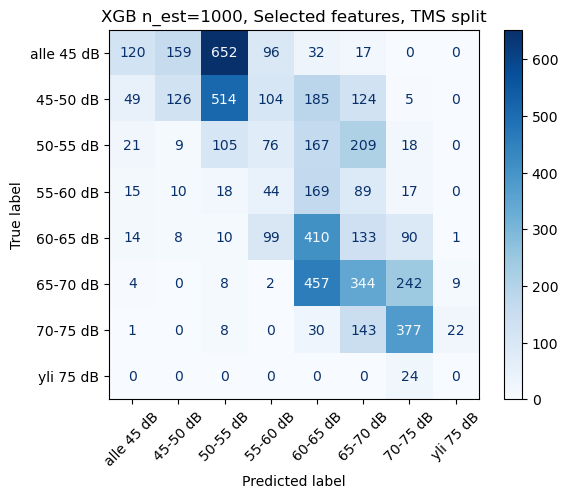

Balanced Accuracy: 0.2535
F1 Score (Macro): 0.2294
Features used: 109


In [ ]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)

# Evaluate on test set
X_test = X[mask_test].reset_index(drop=True)
y_test = y[mask_test].reset_index(drop=True)

xgb_clf = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)
xgb_clf.fit(X_cv[features_xgb], y_cv)

pred_test = xgb_clf.predict(X_test[features_xgb])

cm = confusion_matrix(y_test, pred_test, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("XGB n_est=1000, Selected features, TMS split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_test):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_test, average='macro'):.4f}")
print(f"Features used: {len(X_test[features_xgb].columns)}")

### plots

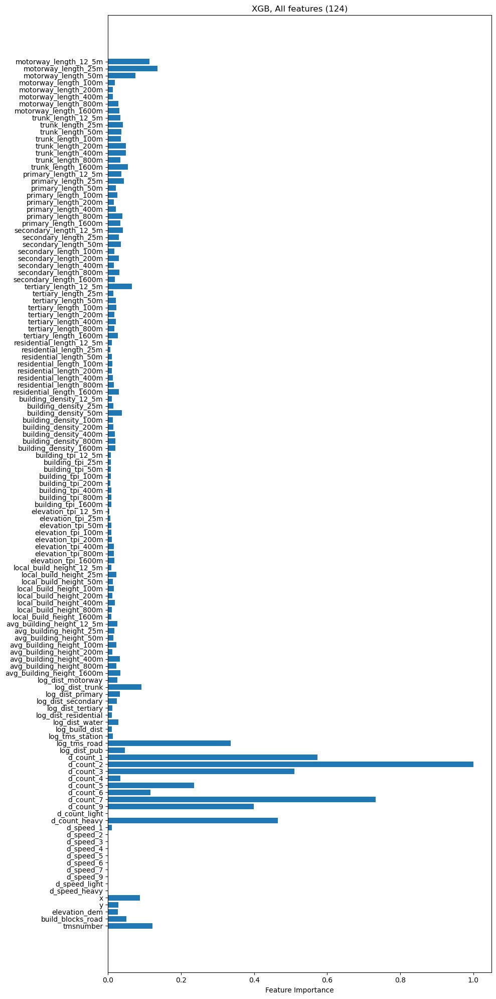

In [24]:
# Calculate feature importances
importances = xgb_clf0.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv0.columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title("XGB, All features (124)")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

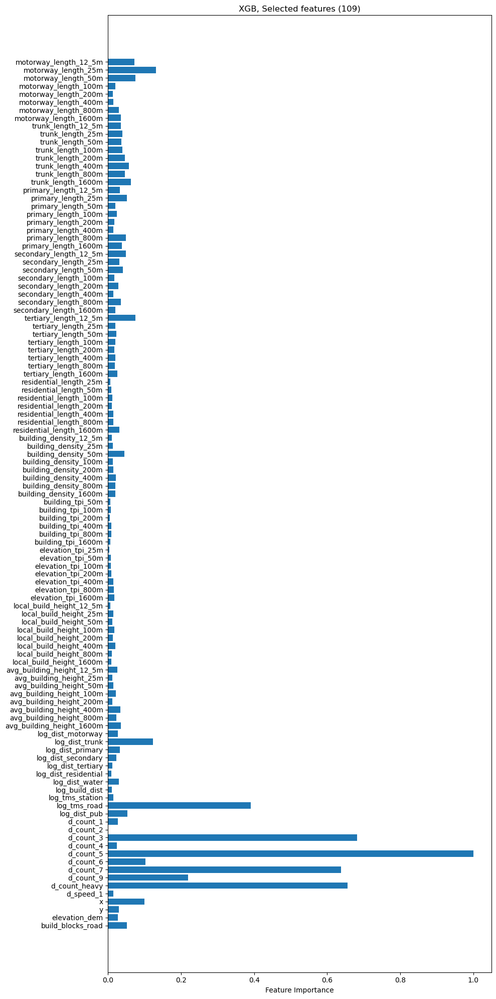

In [ ]:
# Calculate feature importances
importances = xgb_clf.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv[features_xgb].columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title(f"XGB, Selected features ({len(features_xgb)})")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

## RF

### 1. Preparation and Parameter Setup

- Define threshold values for feature selection:
  - `threshold_values = [0,0.01,0.05,0.1,0.15,0.2]`
- Set aside a test group using `tms_test`.
- Prepare data by:
  - Excluding the test group from cross-validation (`X_cv`, `y_cv`).
  - Assigning group labels for cross-validation (`groups_cv`).

### 2. Cross-Validation Setup

- Use **Leave-One-Group-Out (LOGO)** cross-validation to generate train/validation splits (`splits`), limited to the first 5 folds.
- Identify available features by removing `tmsnumber` from the columns.
- Filter `buffer_groups` and `other_groups` to remove unavailable features.
- Prepare feature matrix `X_cv_features` (i.e., `X_cv` without the `tmsnumber` column).

### 3. Main Optimization Loop (for each threshold value)

For each `buffer_thresh` in `threshold_values`:

1. **Cross-validation with Feature Selection**
    - For each fold:
      - Train a `RandomForestClassifier` on the training set.
      - Use `select_features_by_group()` to select features based on group-wise importance and threshold.
      - Collect selected features and validation accuracy per fold.
    - Gather all features selected and average validation accuracy across folds.

2. **Stable Feature Identification**
    - Aggregate feature selections from all folds.
    - Use `get_stable_features()` to retain features selected at least `3` times across all folds.

3. **Stable Feature Evaluation**
    - Retrain and evaluate a `RandomForestClassifier` using only the stable features (again with cross-validation).
    - Compute the new average validation accuracy.

4. **Record Results**
    - Store:
      - Threshold value
      - Number of stable features
      - Old average validation accuracy (before stable selection)
      - New average validation accuracy (using stable features)
      - The stable feature set

5. **Early Stopping**
    - If validation accuracy drops by more than 0.1 compared to the previous threshold, stop the loop.

### 4. Results Analysis

- Combine records into a DataFrame (`results_df`).
- Print or analyze a summary table showing:
  - `buffer_thresh`
  - `num_features`
  - `old_avg_val_acc`
  - `new_avg_val_acc`

---

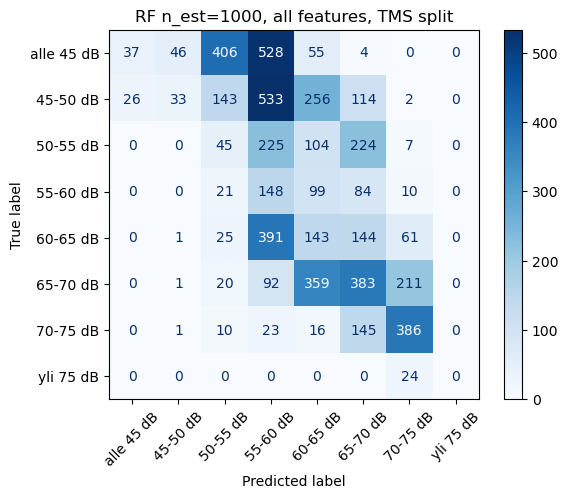

Balanced Accuracy: 0.2198
F1 Score (Macro): 0.1794
Features used: 124


In [37]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv0 = X[~mask_test].reset_index(drop=True)
y_cv0 = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test0 = X[mask_test].reset_index(drop=True)
y_test0 = y[mask_test].reset_index(drop=True)

rf_clf0 = RandomForestClassifier(
    n_estimators=1000,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf_clf0.fit(X_cv0, y_cv0)

pred_test0 = rf_clf0.predict(X_test0)

cm = confusion_matrix(y_test0, pred_test0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("RF n_est=1000, all features, TMS split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_test0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_test0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

In [49]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import accuracy_score
from joblib import Parallel, delayed

def select_features_by_group(clf, X, buffer_groups, other_groups, buffer_thresh=0.1, other_thresh=0.1):
    importances = clf.feature_importances_
    df = pd.DataFrame({'importance': importances}, index=X.columns)
    df_norm = (df - df.min()) / (df.max() - df.min())

    kept_feats = set()
    # Process buffer groups
    for grp in buffer_groups:
        if not grp:
            continue
        grp_importances = df_norm.loc[grp, 'importance']
        above_thresh = grp_importances[grp_importances > buffer_thresh]
        if not above_thresh.empty:
            kept_feats.update(above_thresh.index.tolist())
        else:
            kept_feats.add(grp_importances.idxmax())
    # Process other groups
    for grp in other_groups:
        if not grp:
            continue
        above_thresh = df_norm.loc[grp, 'importance'] > other_thresh
        kept_feats.update(df_norm.loc[grp][above_thresh].index.tolist())
    return list(kept_feats)

def get_stable_features(feature_selection_per_fold, min_counts=3):
    from collections import defaultdict
    counts = defaultdict(int)
    for features in feature_selection_per_fold:
        for f in features:
            counts[f] += 1
    return [f for f, cnt in counts.items() if cnt >= min_counts]

def process_fold(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh):
    X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    clf = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=1)
    clf.fit(X_train, y_train)
    feats = select_features_by_group(clf, X_train, buffer_groups, other_groups, buffer_thresh, buffer_thresh)
    return {
        'features': feats,
        'val_acc': balanced_accuracy_score(y_val, clf.predict(X_val)),
        'val_f1': f1_score(y_val, clf.predict(X_val), average='macro'),
        'val_idx': val_idx
    }

def cross_val_feature_selection(X_features, y, splits, buffer_groups, other_groups, buffer_thresh):
    results = Parallel(n_jobs=-1, verbose=0)(
        delayed(process_fold)(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh)
        for train_idx, val_idx in splits
    )
    selected_features = [res['features'] for res in results]
    avg_val_acc = np.mean([res['val_acc'] for res in results])

    avg_val_acc = np.mean([res['val_acc'] for res in results])
    avg_val_f1s = np.mean([res['val_f1'] for res in results])
    return selected_features, avg_val_acc, avg_val_f1s

def evaluate_stable_features(X_features, y, splits, stable_features):
    accuracies = []
    f1s = []
    for train_idx, val_idx in splits:
        X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        clf = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=-1)
        clf.fit(X_train[stable_features], y_train)
        accuracies.append(balanced_accuracy_score(y_val, clf.predict(X_val[stable_features])))
        f1s.append(f1_score(y_val, clf.predict(X_val[stable_features]), average='macro'))
    return np.mean(accuracies), np.mean(f1s)

# --- Main routine ---
threshold_values = [0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10]
tms_test = [455, 457]

# Data preparation
mask_test = X['tmsnumber'].isin(tms_test)
X_cv = X[~mask_test].reset_index(drop=True)
y_cv = y[~mask_test].reset_index(drop=True)
groups_cv = X_cv['tmsnumber']

# Precompute splits and filtered groups
kfold = GroupKFold(n_splits=10)  # Changed from LeaveOneGroupOut to GroupKFold
splits = list(kfold.split(X_cv, y_cv, groups=groups_cv))  # Removed slice, added groups= parameter
available_features = set(X_cv.columns) - {'tmsnumber'}
filtered_buffer = [[f for f in grp if f in available_features] for grp in buffer_groups]
filtered_other = [[f for f in grp if f in available_features] for grp in other_groups]
X_cv_features = X_cv.drop(columns=['tmsnumber'])

# Main optimization loop
feature_selection_records = []
last_acc = None

for thresh in threshold_values:
    # Cross-validation with parallel processing
    features_per_fold, avg_acc, avg_f1 = cross_val_feature_selection(
        X_cv_features, y_cv, splits, filtered_buffer, filtered_other, thresh
    )
    
    # Stable feature selection
    stable_feats = get_stable_features(features_per_fold, 5)
    
    # Evaluate stable features
    stable_acc, stable_f1  = evaluate_stable_features(X_cv_features, y_cv, splits, stable_feats)
        # Evaluate stable features
    stable_acc, stable_f1 = evaluate_stable_features(X_cv, y_cv, splits, stable_feats)
    
    # Record results
    feature_selection_records.append({
        'buffer_thresh': thresh,
        'num_features': len(stable_feats),
        'old_avg_val_acc': avg_acc,
        'new_avg_val_acc': stable_acc,
        'old_avg_val_f1': avg_f1,
        'new_avg_val_f1': stable_f1,
        'features': stable_feats
    })
    
    # Early stopping check
    if last_acc is not None and (last_acc - stable_acc) > 0.1:
        print("Early stopping triggered")
        break
    last_acc = stable_acc

# Results analysis
results_df = pd.DataFrame(feature_selection_records)
results_df[['buffer_thresh', 'num_features', 'old_avg_val_acc', 'new_avg_val_acc', 'old_avg_val_f1', 'new_avg_val_f1']]

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in

,buffer_thresh,num_features,old_avg_val_acc,new_avg_val_acc,old_avg_val_f1,new_avg_val_f1
0,0.00,122,0.313559,0.300345,0.291421,0.269017
1,0.01,117,0.313559,0.308812,0.291421,0.270450
2,0.02,108,0.313559,0.303498,0.291421,0.266447
3,0.03,97,0.313559,0.303305,0.291421,0.276383
4,0.04,89,0.313559,0.309441,0.291421,0.272029
5,0.05,86,0.313559,0.305268,0.291421,0.279170
6,0.06,83,0.313559,0.306998,0.291421,0.270663
7,0.07,78,0.313559,0.319456,0.291421,0.284504
8,0.08,72,0.313559,0.311312,0.291421,0.273640
9,0.09,70,0.313559,0.304518,0.291421,0.264255


In [50]:
features_rf = results_df['features'].iloc[7]

features_rf

['local_build_height_200m',
 'elevation_tpi_1600m',
 'building_density_50m',
 'log_dist_pub',
 'local_build_height_800m',
 'local_build_height_12_5m',
 'local_build_height_100m',
 'building_density_100m',
 'elevation_dem',
 'building_density_800m',
 'building_tpi_800m',
 'log_tms_road',
 'trunk_length_12_5m',
 'trunk_length_400m',
 'local_build_height_25m',
 'trunk_length_1600m',
 'residential_length_400m',
 'residential_length_100m',
 'avg_building_height_50m',
 'motorway_length_200m',
 'elevation_tpi_12_5m',
 'primary_length_800m',
 'x',
 'local_build_height_400m',
 'trunk_length_100m',
 'motorway_length_100m',
 'trunk_length_50m',
 'log_dist_tertiary',
 'primary_length_1600m',
 'secondary_length_800m',
 'elevation_tpi_800m',
 'trunk_length_25m',
 'motorway_length_1600m',
 'avg_building_height_800m',
 'log_dist_trunk',
 'secondary_length_200m',
 'y',
 'elevation_tpi_50m',
 'log_dist_motorway',
 'local_build_height_50m',
 'secondary_length_400m',
 'log_dist_residential',
 'building_tp

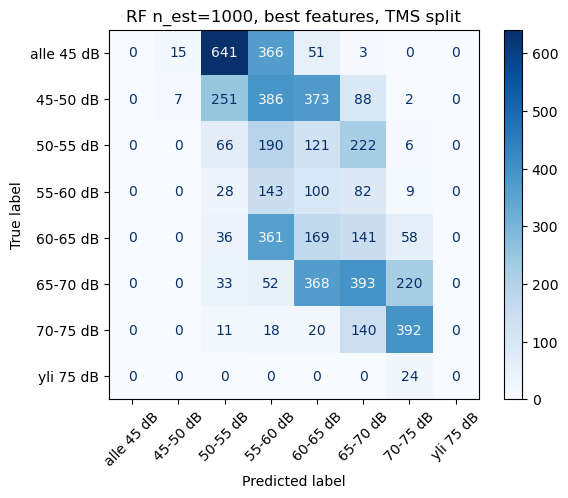

Balanced Accuracy: 0.2218
F1 Score (Macro): 0.1738
Features used: 78


In [51]:
# Evaluate on test set
X_test = X[mask_test].reset_index(drop=True)
y_test = y[mask_test].reset_index(drop=True)

rf_clf_fin = RandomForestClassifier(
        n_estimators=1000,
        max_depth=None,
        random_state=42,
        n_jobs=-1
    )
rf_clf_fin.fit(X_cv[features_rf], y_cv)

# Evaluate on test set
pred_test_fin = rf_clf_fin.predict(X_test[features_rf])

cm = confusion_matrix(y_test, pred_test_fin, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("RF n_est=1000, best features, TMS split")
plt.show()

print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_test_fin):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_test_fin, average='macro'):.4f}")
print(f"Features used: {len(X_test[features_rf].columns)}")

### plots

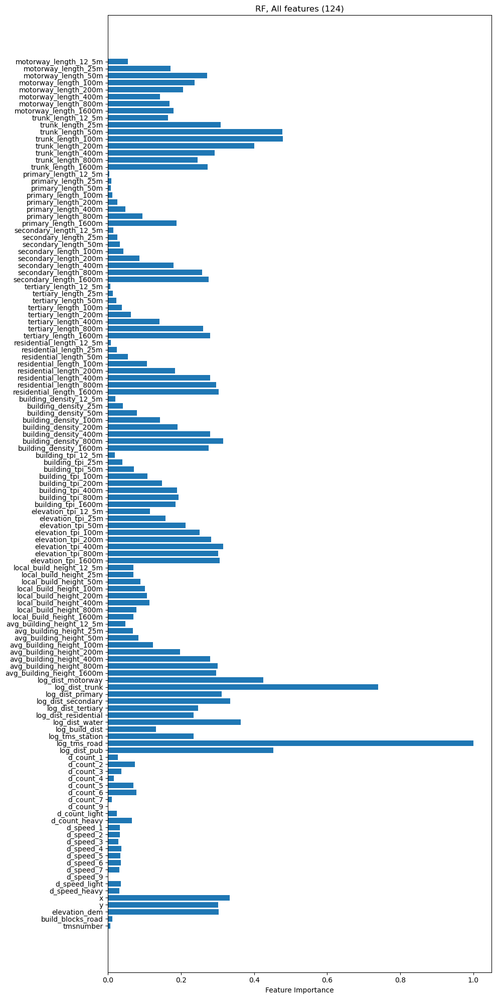

In [47]:
# Calculate feature importances
importances = rf_clf0.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv0.columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title("RF, All features (124)")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

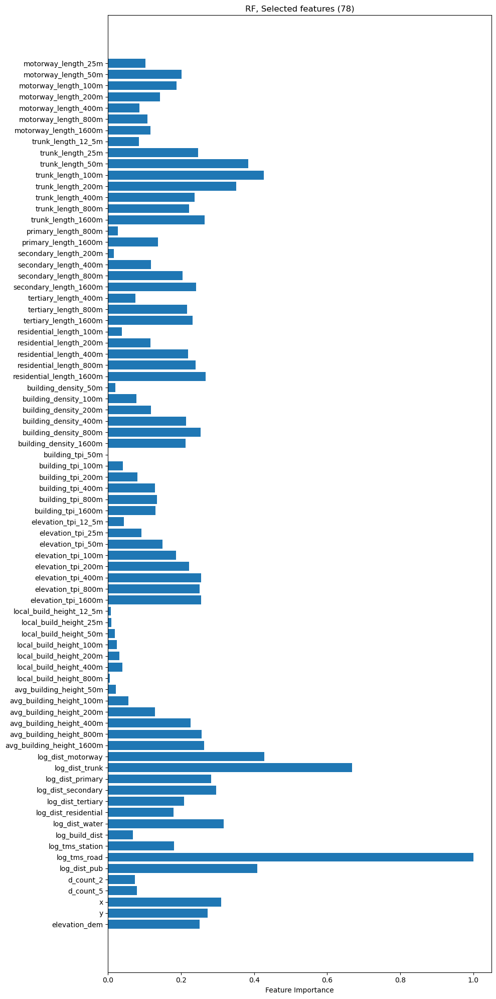

In [48]:
# Calculate feature importances
importances = rf_clf_fin.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv[features_rf].columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title(f"RF, Selected features ({len(features_rf)})")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

## LightGBM

In [26]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv0 = X[~mask_test].reset_index(drop=True)
y_cv0 = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test0 = X[mask_test].reset_index(drop=True)
y_test0 = y[mask_test].reset_index(drop=True)

lgbm_clf0 = LGBMClassifier(
    objective='multiclass',
    num_class=num_classes,
    n_estimators=1000,
    random_state=42
)
lgbm_clf0.fit(X_cv0, y_cv0)

# Evaluate on test set
pred_test0 = lgbm_clf0.predict(X_test0)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24382
[LightGBM] [Info] Number of data points in the train set: 30178, number of used features: 124
[LightGBM] [Info] Start training from score -3.093033
[LightGBM] [Info] Start training from score -3.107750
[LightGBM] [Info] Start training from score -2.359794
[LightGBM] [Info] Start training from score -1.776697
[LightGBM] [Info] Start training from score -1.452810
[LightGBM] [Info] Start training from score -1.579665
[LightGBM] [Info] Start training from score -2.048704
[LightGBM] [Info] Start training from score -2.558245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

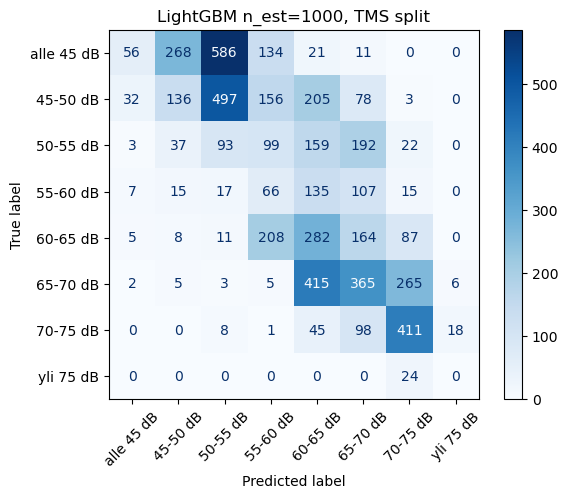

Balanced Accuracy: 0.2412
F1 Score (Macro): 0.2138
Features used: 124


In [27]:
# Confusion Matrix
cm = confusion_matrix(y_test0, pred_test0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("LightGBM n_est=1000, TMS split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_test0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_test0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

In [29]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import accuracy_score
from joblib import Parallel, delayed

def select_features_by_group(clf, X, buffer_groups, other_groups, buffer_thresh=0.1, other_thresh=0.1):
    importances = clf.feature_importances_
    df = pd.DataFrame({'importance': importances}, index=X.columns)
    df_norm = (df - df.min()) / (df.max() - df.min())

    kept_feats = set()
    # Process buffer groups
    for grp in buffer_groups:
        if not grp:
            continue
        grp_importances = df_norm.loc[grp, 'importance']
        above_thresh = grp_importances[grp_importances > buffer_thresh]
        if not above_thresh.empty:
            kept_feats.update(above_thresh.index.tolist())
        else:
            kept_feats.add(grp_importances.idxmax())
    # Process other groups
    for grp in other_groups:
        if not grp:
            continue
        above_thresh = df_norm.loc[grp, 'importance'] > other_thresh
        kept_feats.update(df_norm.loc[grp][above_thresh].index.tolist())
    return list(kept_feats)

def get_stable_features(feature_selection_per_fold, min_counts=3):
    from collections import defaultdict
    counts = defaultdict(int)
    for features in feature_selection_per_fold:
        for f in features:
            counts[f] += 1
    return [f for f, cnt in counts.items() if cnt >= min_counts]

def process_fold(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh):
    X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    
    clf = LGBMClassifier(objective='multiclass', num_class=num_classes, n_estimators=50, random_state=42)
    clf.fit(X_train, y_train)
    feats = select_features_by_group(clf, X_train, buffer_groups, other_groups, buffer_thresh, buffer_thresh)
    return {
        'features': feats,
        'val_acc': balanced_accuracy_score(y_val, clf.predict(X_val)),
        'val_f1': f1_score(y_val, clf.predict(X_val), average='macro', labels=order_num),
        'val_idx': val_idx
    }

def cross_val_feature_selection(X_features, y, splits, buffer_groups, other_groups, buffer_thresh):
    results = Parallel(n_jobs=-1, verbose=0)(
        delayed(process_fold)(train_idx, val_idx, X_features, y, buffer_groups, other_groups, buffer_thresh)
        for train_idx, val_idx in splits
    )
    selected_features = [res['features'] for res in results]
    avg_val_acc = np.mean([res['val_acc'] for res in results])

    avg_val_acc = np.mean([res['val_acc'] for res in results])
    avg_val_f1s = np.mean([res['val_f1'] for res in results])
    return selected_features, avg_val_acc, avg_val_f1s

def evaluate_stable_features(X_features, y, splits, stable_features):
    accuracies = []
    f1s = []
    for train_idx, val_idx in splits:
        X_train, X_val = X_features.iloc[train_idx], X_features.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        clf = LGBMClassifier(objective='multiclass', num_class=num_classes, n_estimators=50, random_state=42)
        clf.fit(X_train[stable_features], y_train)
        accuracies.append(balanced_accuracy_score(y_val, clf.predict(X_val[stable_features])))
        f1s.append(f1_score(y_val, clf.predict(X_val[stable_features]), average='macro', labels=order_num))
    return np.mean(accuracies), np.mean(f1s)

# --- Main routine ---
threshold_values = [0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10]
tms_test = [455, 457]

# Data preparation
mask_test = X['tmsnumber'].isin(tms_test)
X_cv = X[~mask_test].reset_index(drop=True)
y_cv = y[~mask_test].reset_index(drop=True)
groups_cv = X_cv['tmsnumber']

# Precompute splits and filtered groups
kfold = GroupKFold(n_splits=10)  # Changed from LeaveOneGroupOut to GroupKFold
splits = list(kfold.split(X_cv, y_cv, groups=groups_cv))  # Removed slice, added groups= parameter
available_features = set(X_cv.columns) - {'tmsnumber'}
filtered_buffer = [[f for f in grp if f in available_features] for grp in buffer_groups]
filtered_other = [[f for f in grp if f in available_features] for grp in other_groups]
X_cv_features = X_cv.drop(columns=['tmsnumber'])

# Main optimization loop
feature_selection_records = []
last_acc = None

for thresh in threshold_values:
    # Cross-validation with parallel processing
    features_per_fold, avg_acc, avg_f1 = cross_val_feature_selection(
        X_cv_features, y_cv, splits, filtered_buffer, filtered_other, thresh
    )
    
    # Stable feature selection
    stable_feats = get_stable_features(features_per_fold, 5)
    
    # Evaluate stable features
    stable_acc, stable_f1  = evaluate_stable_features(X_cv_features, y_cv, splits, stable_feats)
        # Evaluate stable features
    stable_acc, stable_f1 = evaluate_stable_features(X_cv, y_cv, splits, stable_feats)
    
    # Record results
    feature_selection_records.append({
        'buffer_thresh': thresh,
        'num_features': len(stable_feats),
        'old_avg_val_acc': avg_acc,
        'new_avg_val_acc': stable_acc,
        'old_avg_val_f1': avg_f1,
        'new_avg_val_f1': stable_f1,
        'features': stable_feats
    })
    
    # Early stopping check
    if last_acc is not None and (last_acc - stable_acc) > 0.1:
        print("Early stopping triggered")
        break
    last_acc = stable_acc

# Results analysis
results_df = pd.DataFrame(feature_selection_records)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23935
[LightGBM] [Info] Number of data points in the train set: 23275, number of used features: 113
[LightGBM] [Info] Start training from score -3.727198
[LightGBM] [Info] Start training from score -3.734367
[LightGBM] [Info] Start training from score -2.743917
[LightGBM] [Info] Start training from score -1.815278
[LightGBM] [Info] Start training from score -1.367693
[LightGBM] [Info] Start training from score -1.506443
[LightGBM] [Info] Start training from score -1.909006
[LightGBM] [Info] Start training from score -2.299368
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24231
[LightGBM] [Info] Number of data points in the train set: 24034, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24054
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 113
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24052
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 113
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24003
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 113
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24184
[LightGBM] [Info] Number of data points in the train set: 27869, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24221
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 113
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23964
[LightGBM] [Info] Number of data points in the train set: 28830, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006888 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24221
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 113
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23935
[LightGBM] [Info

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24054
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 113
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24052
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 113
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24003
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 113
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24221
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 113
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23964
[LightGBM] [Info

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24221
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 113
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23638
[LightGBM] [Info] Number of data points in the train set: 23275, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23756
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 107
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23754
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 107
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23705
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 107
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23886
[LightGBM] [Info] Number of data points in the train set: 27869, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020231 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23924
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 107
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23666
[LightGBM] [Info] Number of data points in the train set: 28830, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23923
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 107
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23638
[LightGBM] [Info

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23756
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 107
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23754
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 107
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23705
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 107
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23886
[LightGBM] [Info

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23924
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 107
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23666
[LightGBM] [Info] Number of data points in the train set: 28830, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23923
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 107
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23373
[LightGBM] [Info] Number of data points in the train set: 23275, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23598
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 105
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23489
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 105
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23495
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 105
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23621
[LightGBM] [Info] Number of data points in the train set: 27869, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23706
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 105
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23401
[LightGBM] [Info

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23664
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 105
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23373
[LightGBM] [Info] Number of data points in the train set: 23275, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23598
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 105
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23489
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 105
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23495
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 105
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23621
[LightGBM] [Info] Number of data points in the train set: 27869, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23706
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 105
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23401
[LightGBM] [Info] Number of data points in the train set: 28830, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23664
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 105
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22846
[LightGBM] [Info] Number of data points in the train set: 23275, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23071
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 101
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22963
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 101
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22968
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 101
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23094
[LightGBM] [Info] Number of data points in the train set: 27869, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23179
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 101
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22874
[LightGBM] [Info] Number of data points in the train set: 28830, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004696 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23137
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 101
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23071
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 101
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22963
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 101
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22968
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 101
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23094
[LightGBM] [Info] Number of data points in the train set: 27869, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23179
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 101
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22874
[LightGBM] [Info] Number of data points in the train set: 28830, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23137
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 101
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21390
[LightGBM] [Info] Number of data points in the train set: 23275, number of used 

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21424
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 94
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21386
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 94
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21380
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 94
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21461
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21530
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 94
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21358
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 21489
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 94
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21390
[LightGBM] [Info]

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21424
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 94
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 21386
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 94
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21380
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 94
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21461
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21530
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 94
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21358
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 21489
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 94
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20816
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 88
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20778
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 88
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 20786
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 88
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20854
[LightGBM] [Info]

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20922
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 88
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20839
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20881
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 88
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20798
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20816
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 88
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 20778
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 88
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20786
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 88
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20854
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20922
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 88
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20839
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20881
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 88
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19983
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19969
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 83
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19955
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 83
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19938
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 83
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20013
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20074
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 83
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19999
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20033
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 83
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19983
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19969
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 83
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19955
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 83
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19938
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 83
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20013
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20074
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 83
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19999
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20033
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 83
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18802
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18817
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 77
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18832
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 77
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18837
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 77
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18811
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18849
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 77
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18837
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18837
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 77
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18802
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18817
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 77
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18832
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 77
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18837
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 77
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18811
[LightGBM] [Info]

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18849
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 77
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18837
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18837
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 77
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17786
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17798
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 73
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17813
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 73
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17818
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 73
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17792
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17829
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 73
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17818
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17818
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 73
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17786
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17798
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 73
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17813
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 73
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17818
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 73
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17792
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17829
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 73
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17818
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17818
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 73
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16267
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16274
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 67
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16289
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 67
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16293
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 67
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16266
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16303
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 67
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16292
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16292
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 67
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16267
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16274
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 67
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16289
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 67
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16293
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 67
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16266
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16303
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 67
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16292
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16292
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 67
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14930
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14928
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 60
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14941
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 60
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14945
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 60
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14926
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14945
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 60
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14945
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14946
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 60
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14930
[LightGBM] [Info] Number of data points in the train set: 23275, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14928
[LightGBM] [Info] Number of data points in the train set: 25821, number of used features: 60
[LightGBM] [Info] Start training from score -2.937108
[LightGBM] [Info] Start training from score -2.957773
[LightGBM] [Info] Start training from score -2.322179
[LightGBM] [Info] Start training from score -1.799574
[LightGBM] [Info] Start training from score -1.483380
[LightGBM] [Info] Start training from score -1.561646
[LightGBM] [Info] Start training from score -1.997283
[LightGBM] [Info] Start training from score -2.825920


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14941
[LightGBM] [Info] Number of data points in the train set: 27608, number of used features: 60
[LightGBM] [Info] Start training from score -3.504435
[LightGBM] [Info] Start training from score -3.253255
[LightGBM] [Info] Start training from score -2.380836
[LightGBM] [Info] Start training from score -1.758909
[LightGBM] [Info] Start training from score -1.431036
[LightGBM] [Info] Start training from score -1.575011
[LightGBM] [Info] Start training from score -1.996083
[LightGBM] [Info] Start training from score -2.469238


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14945
[LightGBM] [Info] Number of data points in the train set: 27793, number of used features: 60
[LightGBM] [Info] Start training from score -3.018035
[LightGBM] [Info] Start training from score -3.031369
[LightGBM] [Info] Start training from score -2.280276
[LightGBM] [Info] Start training from score -1.722170
[LightGBM] [Info] Start training from score -1.464588
[LightGBM] [Info] Start training from score -1.628618
[LightGBM] [Info] Start training from score -2.089894
[LightGBM] [Info] Start training from score -2.647258
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14926
[LightGBM] [Info] Number of data points in the train set: 27869, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14945
[LightGBM] [Info] Number of data points in the train set: 28053, number of used features: 60
[LightGBM] [Info] Start training from score -3.021477
[LightGBM] [Info] Start training from score -3.045914
[LightGBM] [Info] Start training from score -2.340844
[LightGBM] [Info] Start training from score -1.769237
[LightGBM] [Info] Start training from score -1.462447
[LightGBM] [Info] Start training from score -1.564241
[LightGBM] [Info] Start training from score -2.056222
[LightGBM] [Info] Start training from score -2.685946
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14945
[LightGBM] [Info] Number of data points in the train set: 28830, number of used f

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14946
[LightGBM] [Info] Number of data points in the train set: 29329, number of used features: 60
[LightGBM] [Info] Start training from score -3.068889
[LightGBM] [Info] Start training from score -3.114675
[LightGBM] [Info] Start training from score -2.343970
[LightGBM] [Info] Start training from score -1.790363
[LightGBM] [Info] Start training from score -1.445607
[LightGBM] [Info] Start training from score -1.568814
[LightGBM] [Info] Start training from score -2.080840
[LightGBM] [Info] Start training from score -2.556597


In [30]:
results_df[['buffer_thresh', 'num_features', 'old_avg_val_acc', 'new_avg_val_acc', 'old_avg_val_f1', 'new_avg_val_f1']]

,buffer_thresh,num_features,old_avg_val_acc,new_avg_val_acc,old_avg_val_f1,new_avg_val_f1
0,0.00,113,0.312054,0.308795,0.255273,0.251480
1,0.01,107,0.312054,0.310610,0.255273,0.255284
2,0.02,105,0.312054,0.313486,0.255273,0.264768
3,0.03,101,0.312054,0.319240,0.255273,0.265175
4,0.04,94,0.312054,0.312184,0.255273,0.255161
5,0.05,88,0.312054,0.305813,0.255273,0.250413
6,0.06,83,0.312054,0.304161,0.255273,0.246370
7,0.07,77,0.312054,0.307843,0.255273,0.253322
8,0.08,73,0.312054,0.313274,0.255273,0.247052
9,0.09,67,0.312054,0.311617,0.255273,0.254152


In [31]:
features_lgbm = results_df['features'].iloc[8]

features_lgbm

['local_build_height_200m',
 'primary_length_1600m',
 'building_tpi_200m',
 'trunk_length_200m',
 'elevation_tpi_800m',
 'secondary_length_400m',
 'elevation_dem',
 'building_density_800m',
 'motorway_length_100m',
 'building_tpi_1600m',
 'avg_building_height_100m',
 'log_tms_station',
 'residential_length_1600m',
 'primary_length_800m',
 'tertiary_length_1600m',
 'residential_length_800m',
 'motorway_length_50m',
 'secondary_length_200m',
 'tertiary_length_400m',
 'motorway_length_400m',
 'building_density_50m',
 'elevation_tpi_1600m',
 'building_density_400m',
 'log_dist_residential',
 'y',
 'motorway_length_1600m',
 'secondary_length_1600m',
 'building_tpi_50m',
 'elevation_tpi_12_5m',
 'log_dist_secondary',
 'elevation_tpi_100m',
 'log_dist_primary',
 'log_tms_road',
 'secondary_length_50m',
 'local_build_height_400m',
 'avg_building_height_800m',
 'build_blocks_road',
 'avg_building_height_400m',
 'motorway_length_200m',
 'residential_length_100m',
 'trunk_length_800m',
 'tertiary

In [33]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)

# Evaluate on test set
X_test = X[mask_test].reset_index(drop=True)
y_test = y[mask_test].reset_index(drop=True)

lgbm_clf = LGBMClassifier(
    objective='multiclass',
    num_class=num_classes,
    n_estimators=1000,
    random_state=42
)
lgbm_clf.fit(X_cv[features_lgbm], y_cv0)

# Evaluate on test set
pred_test1 = lgbm_clf.predict(X_test[features_lgbm])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17820
[LightGBM] [Info] Number of data points in the train set: 30178, number of used features: 73
[LightGBM] [Info] Start training from score -3.093033
[LightGBM] [Info] Start training from score -3.107750
[LightGBM] [Info] Start training from score -2.359794
[LightGBM] [Info] Start training from score -1.776697
[LightGBM] [Info] Start training from score -1.452810
[LightGBM] [Info] Start training from score -1.579665
[LightGBM] [Info] Start training from score -2.048704
[LightGBM] [Info] Start training from score -2.558245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

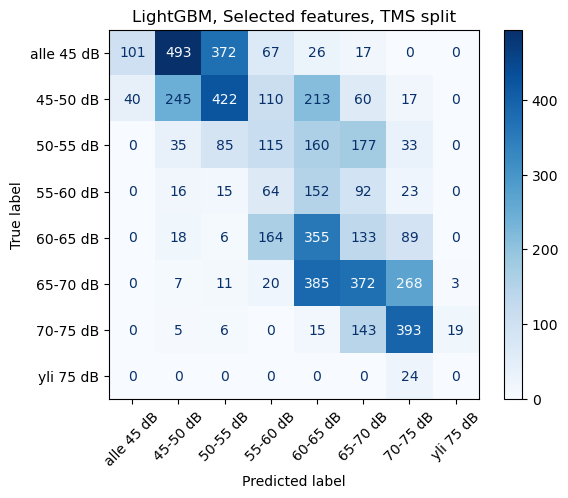

Balanced Accuracy: 0.2652
F1 Score (Macro): 0.2411
Features used: 73


In [34]:
# Confusion Matrix
cm = confusion_matrix(y_test, pred_test1, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("LightGBM, Selected features, TMS split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_test1):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_test1, average='macro'):.4f}")
print(f"Features used: {len(X_cv[features_lgbm].columns)}")

### plots

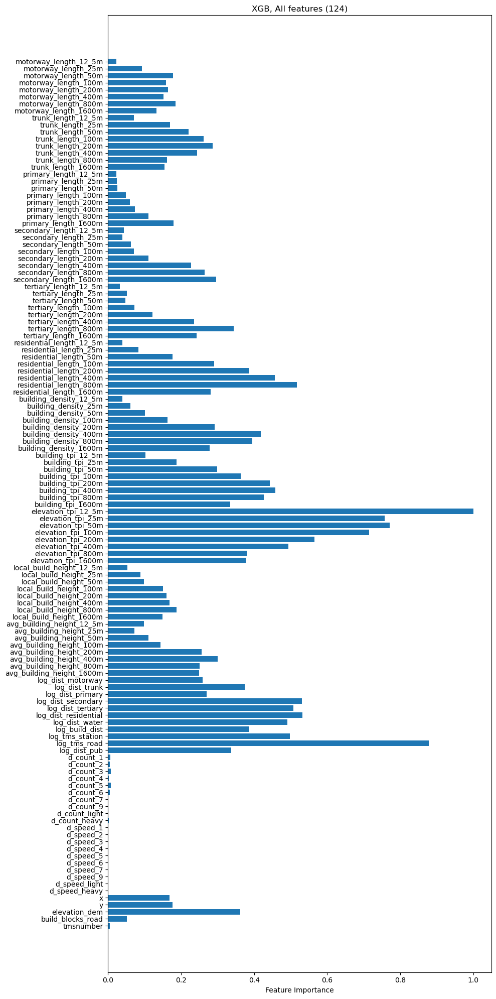

In [ ]:
# Calculate feature importances
importances = lgbm_clf0.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv0.columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title("LGBM, All features (124)")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

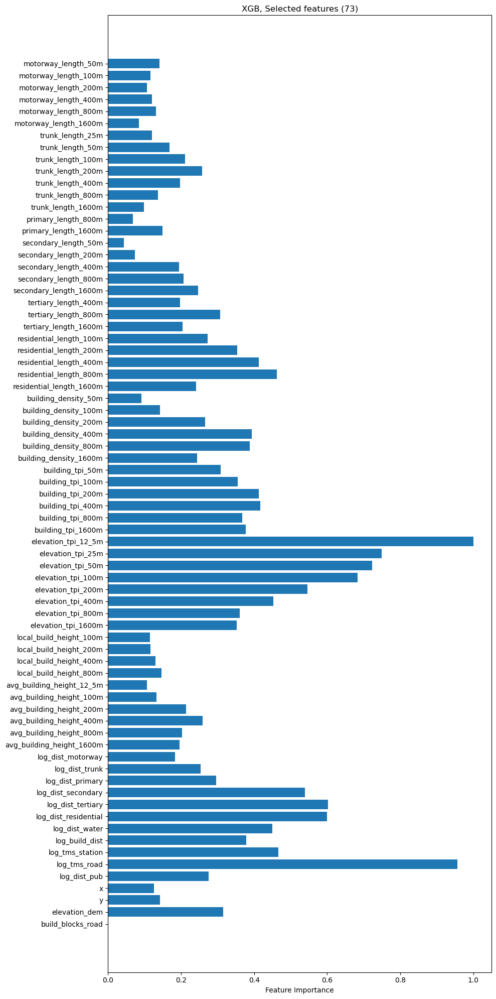

In [ ]:
# Calculate feature importances
importances = lgbm_clf.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv[features_lgbm].columns)
df_norm = (df - df.min()) / (df.max() - df.min())  # Normalize between 0 and 1

ordered_feats = [feat for grp in groups for feat in grp]
ordered_feats = [f for f in ordered_feats if f in df_norm.index]

# 2. Extract importance values in order
importances_in_order = df_norm.loc[ordered_feats, "importance"]

# 3. Plot
plt.figure(figsize=(10, 20))
plt.barh(ordered_feats, importances_in_order)
plt.xlabel("Feature Importance")
plt.title(f"LGBM, Selected features ({len(features_lgbm)})")
plt.gca().invert_yaxis()  # Highest at top
plt.tight_layout()
plt.show()

## MLP

In [53]:
combined_features

['primary_length_200m',
 'tertiary_length_800m',
 'log_dist_secondary',
 'avg_building_height_200m',
 'building_tpi_800m',
 'building_tpi_50m',
 'elevation_tpi_25m',
 'secondary_length_200m',
 'primary_length_25m',
 'building_density_800m',
 'trunk_length_200m',
 'log_dist_water',
 'd_count_2',
 'building_density_100m',
 'avg_building_height_25m',
 'motorway_length_12_5m',
 'trunk_length_100m',
 'motorway_length_400m',
 'd_count_9',
 'd_count_5',
 'elevation_tpi_400m',
 'elevation_tpi_200m',
 'avg_building_height_100m',
 'log_dist_residential',
 'secondary_length_50m',
 'secondary_length_25m',
 'd_speed_1',
 'motorway_length_1600m',
 'log_dist_motorway',
 'd_count_7',
 'primary_length_12_5m',
 'log_build_dist',
 'building_density_400m',
 'building_tpi_100m',
 'local_build_height_12_5m',
 'tertiary_length_200m',
 'tertiary_length_25m',
 'motorway_length_200m',
 'trunk_length_50m',
 'trunk_length_1600m',
 'tertiary_length_100m',
 'local_build_height_25m',
 'motorway_length_25m',
 'reside

In [52]:
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

combined_features = list(set(features_xgb + features_rf + features_lgbm))

print(len(features_xgb))
print(len(features_rf))
print(len(features_lgbm))
print(len(combined_features))

109
78
73
110


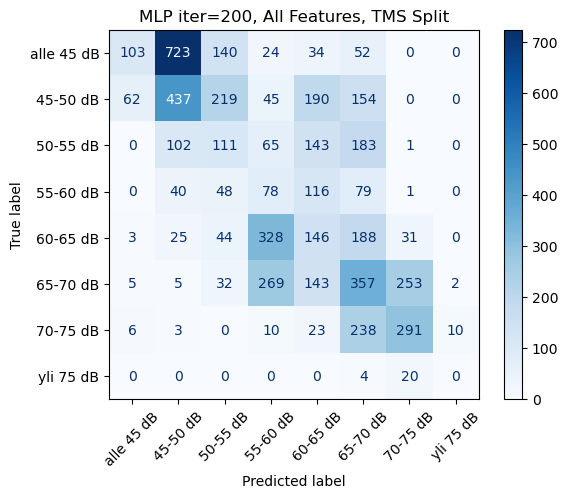

Balanced Accuracy: 0.2395
F1 Score (Macro): 0.2285
Features used: 124


In [54]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv0 = X[~mask_test].reset_index(drop=True)
y_cv0 = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test0 = X[mask_test].reset_index(drop=True)
y_test0 = y[mask_test].reset_index(drop=True)

mlp_clf0 = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf0.fit(X_cv0, y_cv0)
pred_mlp0 = mlp_clf0.predict(X_test0)

# Confusion Matrix
cm = confusion_matrix(y_test0, pred_mlp0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, All Features, TMS Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_mlp0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_mlp0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

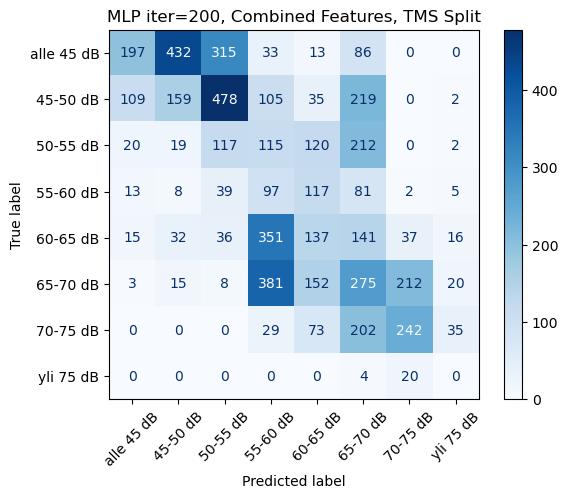

Balanced Accuracy: 0.2052
F1 Score (Macro): 0.2012
Features used: 110


In [56]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv = X[~mask_test].reset_index(drop=True)
y_cv = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test = X[mask_test].reset_index(drop=True)
y_test = y[mask_test].reset_index(drop=True)

mlp_clf = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf.fit(X_cv[combined_features], y_cv)
pred_mlp = mlp_clf.predict(X_test[combined_features])

# Confusion Matrix
cm = confusion_matrix(y_test, pred_mlp, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, Combined Features, TMS Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_mlp):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_mlp, average='macro'):.4f}")
print(f"Features used: {len(X_cv[combined_features].columns)}")

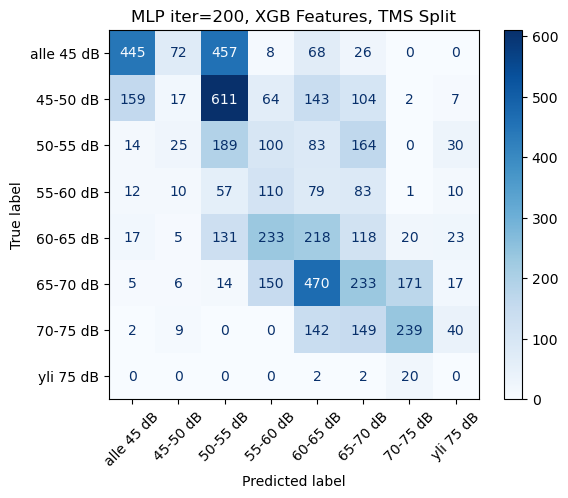

Balanced Accuracy: 0.2450
F1 Score (Macro): 0.2328
Features used: 109


In [57]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv = X[~mask_test].reset_index(drop=True)
y_cv = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test = X[mask_test].reset_index(drop=True)
y_test = y[mask_test].reset_index(drop=True)

mlp_clf = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf.fit(X_cv[features_xgb], y_cv)
pred_mlp = mlp_clf.predict(X_test[features_xgb])

# Confusion Matrix
cm = confusion_matrix(y_test, pred_mlp, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, XGB Features, TMS Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_mlp):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_mlp, average='macro'):.4f}")
print(f"Features used: {len(X_cv[features_xgb].columns)}")

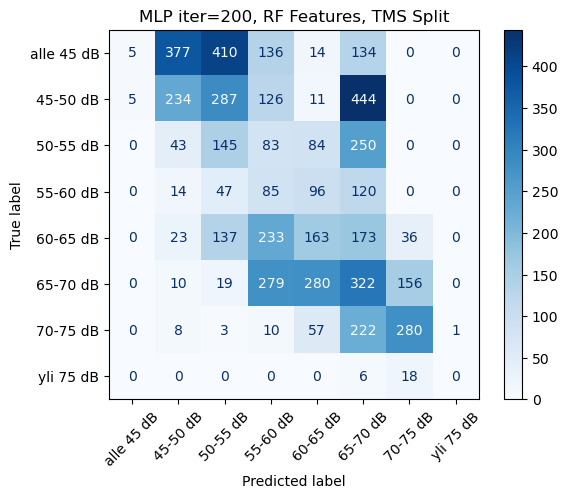

Balanced Accuracy: 0.2109
F1 Score (Macro): 0.1940
Features used: 78


In [59]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv = X[~mask_test].reset_index(drop=True)
y_cv = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test = X[mask_test].reset_index(drop=True)
y_test = y[mask_test].reset_index(drop=True)

mlp_clf = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf.fit(X_cv[features_rf], y_cv)
pred_mlp = mlp_clf.predict(X_test[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test, pred_mlp, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, RF Features, TMS Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_mlp):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_mlp, average='macro'):.4f}")
print(f"Features used: {len(X_cv[features_rf].columns)}")

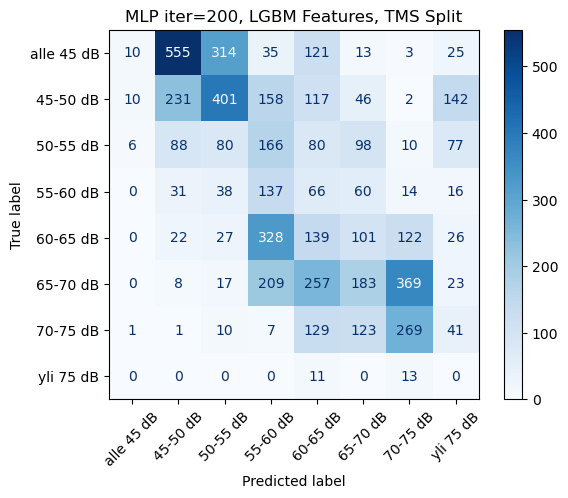

Balanced Accuracy: 0.1931
F1 Score (Macro): 0.1647
Features used: 73


In [60]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv = X[~mask_test].reset_index(drop=True)
y_cv = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test = X[mask_test].reset_index(drop=True)
y_test = y[mask_test].reset_index(drop=True)

mlp_clf = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),  # two layers: 100 then 50 neurons
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

mlp_clf.fit(X_cv[features_lgbm], y_cv)
pred_mlp = mlp_clf.predict(X_test[features_lgbm])

# Confusion Matrix
cm = confusion_matrix(y_test, pred_mlp, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP iter=200, LGBM Features, TMS Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_mlp):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_mlp, average='macro'):.4f}")
print(f"Features used: {len(X_cv[features_lgbm].columns)}")

## Ensemble

In [74]:
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier

# Define individual models
xgb_clf_e = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)

mlp_clf_e = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        hidden_layer_sizes=(100, 50),
        activation='relu',
        solver='adam',
        alpha=1e-4,
        batch_size='auto',
        learning_rate='adaptive',
        learning_rate_init=1e-3,
        max_iter=200,
        random_state=42,
        early_stopping=True,
        n_iter_no_change=10,
        verbose=False
    )
)

lgbm_clf_e = LGBMClassifier(
    objective='multiclass',
    num_class=num_classes,
    n_estimators=1000,
    random_state=42
)

rf_clf_e = RandomForestClassifier(
    n_estimators=1000,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)

In [75]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv0 = X[~mask_test].reset_index(drop=True)
y_cv0 = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test0 = X[mask_test].reset_index(drop=True)
y_test0 = y[mask_test].reset_index(drop=True)

ensemble_0 = VotingClassifier(
    estimators=[
        ('xgb', xgb_clf_e),
        ('mlp', mlp_clf_e),
        ('lgbm', lgbm_clf_e),
        ('rf', rf_clf_e)
    ],
    voting='soft'
)
ensemble_0.fit(X_cv0, y_cv0)
pred_0 = ensemble_0.predict(X_test0)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24382
[LightGBM] [Info] Number of data points in the train set: 30178, number of used features: 124
[LightGBM] [Info] Start training from score -3.093033
[LightGBM] [Info] Start training from score -3.107750
[LightGBM] [Info] Start training from score -2.359794
[LightGBM] [Info] Start training from score -1.776697
[LightGBM] [Info] Start training from score -1.452810
[LightGBM] [Info] Start training from score -1.579665
[LightGBM] [Info] Start training from score -2.048704
[LightGBM] [Info] Start training from score -2.558245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

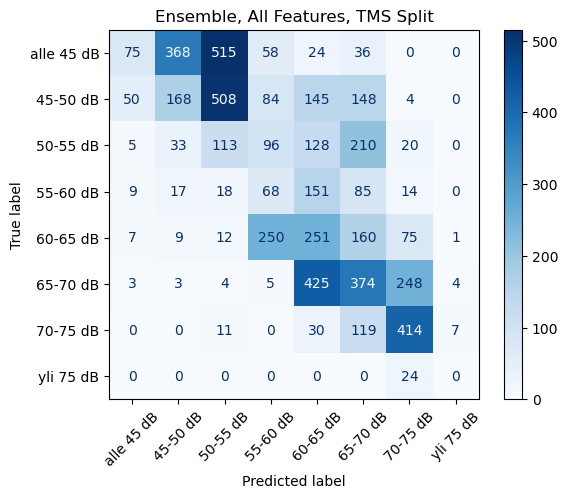

Balanced Accuracy: 0.2484
F1 Score (Macro): 0.2244


In [76]:
# Confusion Matrix
cm = confusion_matrix(y_test0, pred_0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensemble, All Features, TMS Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_0, average='macro'):.4f}")

In [77]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv = X[~mask_test].reset_index(drop=True)
y_cv = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test = X[mask_test].reset_index(drop=True)
y_test = y[mask_test].reset_index(drop=True)

ensemble_tms = VotingClassifier(
    estimators=[
        ('xgb', xgb_clf_e),
        ('mlp', mlp_clf_e),
        ('lgbm', lgbm_clf_e),
        ('rf', rf_clf_e)
    ],
    voting='soft'
)
ensemble_tms.fit(X_cv[features_xgb], y_cv0)
pred_e = ensemble_tms.predict(X_test[features_xgb])

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 23250
[LightGBM] [Info] Number of data points in the train set: 30178, number of used features: 109
[LightGBM] [Info] Start training from score -3.093033
[LightGBM] [Info] Start training from score -3.107750
[LightGBM] [Info] Start training from score -2.359794
[LightGBM] [Info] Start training from score -1.776697
[LightGBM] [Info] Start training from score -1.452810
[LightGBM] [Info] Start training from score -1.579665
[LightGBM] [Info] Start training from score -2.048704
[LightGBM] [Info] Start training from score -2.558245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

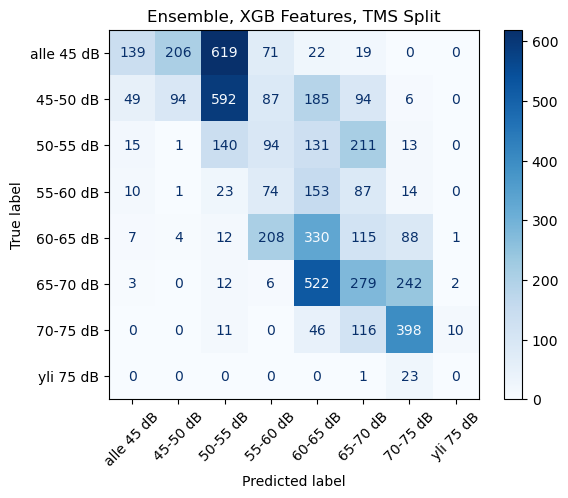

Balanced Accuracy: 0.2535
F1 Score (Macro): 0.2276


In [78]:
# Confusion Matrix
cm = confusion_matrix(y_test, pred_e, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensemble, XGB Features, TMS Split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, pred_e):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test, pred_e, average='macro'):.4f}")

## Check split

In [26]:
from sklearn.model_selection import GroupKFold

# Two stations to hold out as test
tms_test = [455, 457]

# Mask for test/train
mask_test = X['tmsnumber'].isin(tms_test)
mask_train = ~mask_test

# Cross-validation data (only 10 stations left)
X_cv = X[mask_train]
y_cv = y[mask_train]
X_test = X[mask_test]
y_test = y[mask_test]

groups_cv = X_cv['tmsnumber']

kfold = GroupKFold(n_splits=10)

for fold, (train_idx, val_idx) in enumerate(kfold.split(X_cv, y_cv, groups=groups_cv)):
    train_stations = X_cv.iloc[train_idx]['tmsnumber'].unique()
    val_stations = X_cv.iloc[val_idx]['tmsnumber'].unique()
    print(f"\nFold {fold+1}")
    print("Train stations:", train_stations)
    print("Val stations:  ", val_stations)

    X_train, X_val = X_cv.iloc[train_idx], X_cv.iloc[val_idx]
    y_train, y_val = y_cv.iloc[train_idx], y_cv.iloc[val_idx]
    print("Size Train:  ", len(X_train))
    print("Size Val:    ", len(X_val))



Fold 1
Train stations: [435. 438. 439. 449. 451. 471. 456. 452. 464.]
Val stations:   [458.]
Size Train:   23275
Size Val:     6903

Fold 2
Train stations: [435. 438. 439. 449. 458. 471. 456. 452. 464.]
Val stations:   [451.]
Size Train:   24034
Size Val:     6144

Fold 3
Train stations: [438. 439. 449. 451. 458. 471. 456. 452. 464.]
Val stations:   [435.]
Size Train:   25821
Size Val:     4357

Fold 4
Train stations: [435. 438. 449. 451. 458. 471. 456. 452. 464.]
Val stations:   [439.]
Size Train:   27608
Size Val:     2570

Fold 5
Train stations: [435. 438. 439. 451. 458. 471. 456. 452. 464.]
Val stations:   [449.]
Size Train:   27793
Size Val:     2385

Fold 6
Train stations: [435. 439. 449. 451. 458. 471. 456. 452. 464.]
Val stations:   [438.]
Size Train:   27869
Size Val:     2309

Fold 7
Train stations: [435. 438. 439. 449. 451. 458. 456. 452. 464.]
Val stations:   [471.]
Size Train:   28053
Size Val:     2125

Fold 8
Train stations: [435. 438. 439. 449. 451. 458. 471. 456. 464.

# Oulu

## Download data

In [10]:
# Add username, password and database name
user = 'postgres'
password = 'Gilman'
host = 'localhost'
port = '5432'
database = 'oulu_db'

# Create the connection string
conn_str = f'postgresql://{user}:{password}@{host}:{port}/{database}'

engine_cloud = create_engine(conn_str)
query = "SELECT * FROM new_sampled;"

df_oulu = pd.DataFrame( engine_cloud.connect().execute(text(query)) )
# df = pd.read_sql(query, engine)

order_noise = ['alle 45 dB', '45-50 dB', '50-55 dB', '55-60 dB', 
               '60-65 dB', '65-70 dB', '70-75 dB', 'yli 75 dB']
df_oulu["d_noise_lvl"] = pd.Categorical(df_oulu["d_noise_lvl"], categories=order_noise, ordered=True).codes

df_oulu["build_blocks_road"] = pd.Categorical(df_oulu["build_blocks_road"]).codes

df_oulu["d_noise_lvl"] = df_oulu["d_noise_lvl"].replace(-1, 0)

order_num = [0, 1, 2, 3, 4, 5, 6, 7]

In [11]:
columns_del = ["geom", "id", "date", "n_noise_lvl", "d_noise_lvl"]
columns_d = ["d_count_1", "d_count_2", "d_count_3", "d_count_4", "d_count_5", "d_count_6", "d_count_7", "d_count_9",
            "d_speed_1", "d_speed_2", "d_speed_3", "d_speed_4", "d_speed_5", "d_speed_6", "d_speed_7", "d_speed_9",
            "d_count_light", "d_count_heavy", "d_speed_light", "d_speed_heavy"]
columns_n = ["n_count_1", "n_count_2", "n_count_3", "n_count_4", "n_count_5", "n_count_6", "n_count_7", "n_count_9",
            "n_speed_1", "n_speed_2", "n_speed_3", "n_speed_4", "n_speed_5", "n_speed_6", "n_speed_7", "n_speed_9",
            "n_count_light", "n_count_heavy", "n_speed_light", "n_speed_heavy"]

columns_drop = columns_del + columns_n

X_t = df_oulu.drop(columns_drop, axis=1)
y_t = df_oulu["d_noise_lvl"]

# 1. parse out x,y from your WKB hex
df_oulu["geometry"] = df_oulu["geom"].apply(lambda h: wkb.loads(bytes.fromhex(h)))
df_oulu["x"] = df_oulu["geometry"].apply(lambda p: p.x)
df_oulu["y"] = df_oulu["geometry"].apply(lambda p: p.y)
X_t["x"], X_t["y"] = df_oulu["x"], df_oulu["y"]

not_avail = ['log_dist_block', 'sound_blocked', 'crossing_200m', 'traffic_light_200m']
X_t = X_t.drop(not_avail, axis=1)

In [12]:
X_oulu = X_t
y_oulu = y_t

X_oulu

,log_dist_motorway,motorway_length_12_5m,motorway_length_25m,motorway_length_50m,motorway_length_100m,motorway_length_200m,motorway_length_400m,motorway_length_800m,motorway_length_1600m,log_dist_trunk,...,d_count_light,d_count_heavy,d_speed_light,d_speed_heavy,log_tms_station,log_tms_road,log_build_dist,build_blocks_road,x,y
0,6.682391,0.0,0.0,0.0,0.0,0.0,0.0,66.544068,11735.405749,8.020121,...,9416.535714,326.000000,57.097851,56.223186,5.347776,4.369448,0.000000,1,428979.169126,7.205867e+06
1,6.674846,0.0,0.0,0.0,0.0,0.0,0.0,414.754583,11751.880198,8.020927,...,9416.535714,326.000000,57.097851,56.223186,5.412692,4.369448,0.000000,1,428986.120530,7.205854e+06
2,6.667244,0.0,0.0,0.0,0.0,0.0,0.0,537.916140,11768.354647,8.021735,...,9416.535714,326.000000,57.097851,56.223186,5.474115,4.369448,0.000000,1,428993.071935,7.205840e+06
3,6.704855,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,11658.133538,8.017747,...,9416.535714,326.000000,57.097851,56.223186,5.128355,4.369448,0.000000,1,428958.185096,7.205907e+06
4,6.697398,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,11680.025688,8.018532,...,9416.535714,326.000000,57.097851,56.223186,5.205973,4.369448,0.000000,1,428965.199239,7.205893e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33320,8.946628,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,5.323010,...,10249.137931,464.896552,63.834267,63.404515,5.451264,5.323010,5.907742,0,435985.452596,7.216670e+06
33321,8.948573,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,5.323010,...,10249.137931,464.896552,63.834267,63.404515,5.482434,5.323010,5.868673,0,435997.284515,7.216680e+06
33322,8.950515,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,5.323010,...,10249.137931,464.896552,63.834267,63.404515,5.515442,5.323010,5.828243,0,436009.116433,7.216689e+06
33323,8.938814,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,5.323010,...,10249.137931,464.896552,63.834267,63.404515,5.354050,5.323010,-1.098612,0,435938.334738,7.216633e+06


## Random split

In [ ]:
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

rf_clf1 = RandomForestClassifier(
        n_estimators=1000,
        max_depth=None,
        random_state=42,
        n_jobs=-1
    )
rf_clf1.fit(X_cv[selected_rf], y_cv)

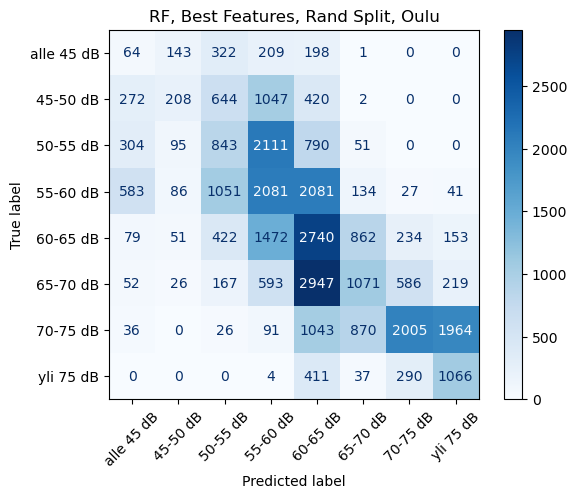

Balanced Accuracy: 0.2823
F1 Score (Macro): 0.2659


In [108]:
pred_rf_o = rf_clf1.predict(X_oulu[selected_rf])

# Confusion Matrix
cm = confusion_matrix(y_oulu, pred_rf_o, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("RF, Best Features, Rand Split, Oulu")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, pred_rf_o):.4f}")
print(f"F1 Score (Macro): {f1_score(y_oulu, pred_rf_o, average='macro'):.4f}")

In [36]:
X_cv, X_test, y_cv, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

ensemble_xgb = VotingClassifier(
    estimators=[
        ('xgb', xgb_clf_e),
        ('mlp', mlp_clf_e),
        ('lgbm', lgbm_clf_e),
        ('rf', rf_clf_e)
    ],
    voting='soft'
)
ensemble_xgb.fit(X_cv[selected_xgb], y_cv)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13213
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 65
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791


VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_ra...
                              Pipeline(steps=[('standardscaler',
                                               StandardScaler()),
                                              ('mlpclassifier',
                                               MLPClassifier(early_stopping=True,
                                                             hidden_layer_sizes=(100,
                                                                                 50),
                                                             learning_rate='adaptive',
                                                             random_state=42))])),
                             ('lgbm',
                              LGBMClassifier(n_estimators=1000, num_class=8,
                                             objective='multiclass',
                                             random_state=42)),
                             ('rf',
                              RandomForestClassifier(n_estimators=1000,
                                                     n_jobs=-1,
                                                     random_state=42))],
                 voting='soft')

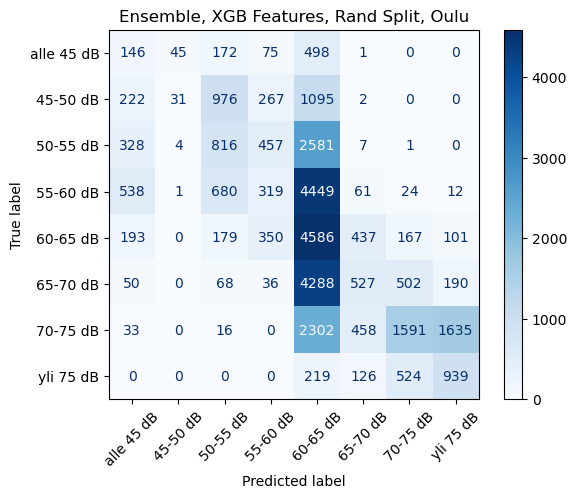

Balanced Accuracy: 0.2567
F1 Score (Macro): 0.2143


In [ ]:
pred_xgb = ensemble_xgb.predict(X_oulu[selected_xgb])

# Confusion Matrix
cm = confusion_matrix(y_oulu, pred_xgb, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensemble, XGB Features, Rand Split, Oulu")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, pred_xgb):.4f}")
print(f"F1 Score (Macro): {f1_score(y_oulu, pred_xgb, average='macro'):.4f}")

## TMS Split

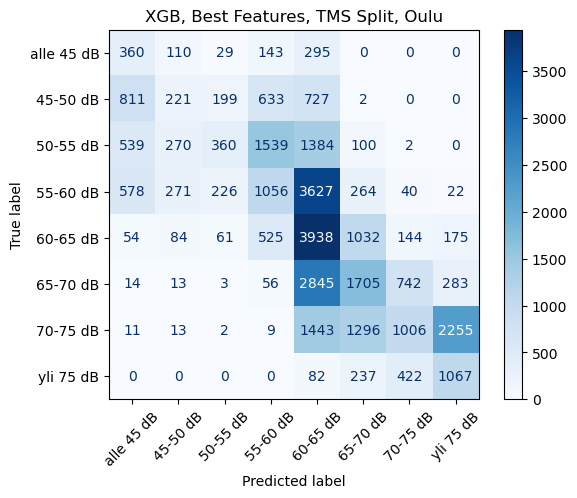

Balanced Accuracy: 0.3052
F1 Score (Macro): 0.2540


In [68]:
pred_tms = xgb_clf.predict(X_oulu[features_xgb])

# Confusion Matrix
cm = confusion_matrix(y_oulu, pred_tms, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("XGB, Best Features, TMS Split, Oulu")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, pred_tms):.4f}")
print(f"F1 Score (Macro): {f1_score(y_oulu, pred_tms, average='macro'):.4f}")

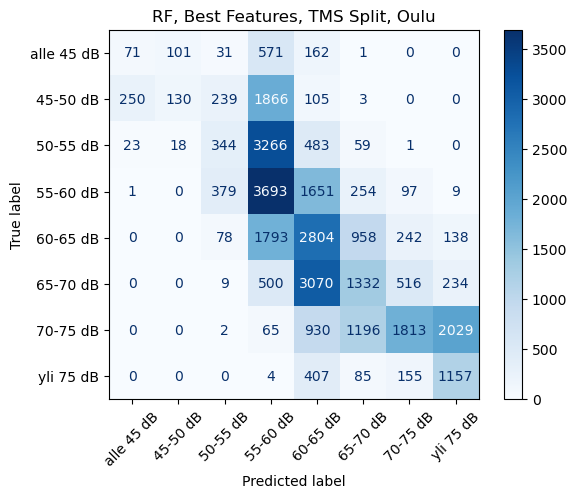

Balanced Accuracy: 0.3071
F1 Score (Macro): 0.2780


In [67]:
pred_tms = rf_clf_fin.predict(X_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_oulu, pred_tms, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("RF, Best Features, TMS Split, Oulu")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, pred_tms):.4f}")
print(f"F1 Score (Macro): {f1_score(y_oulu, pred_tms, average='macro'):.4f}")

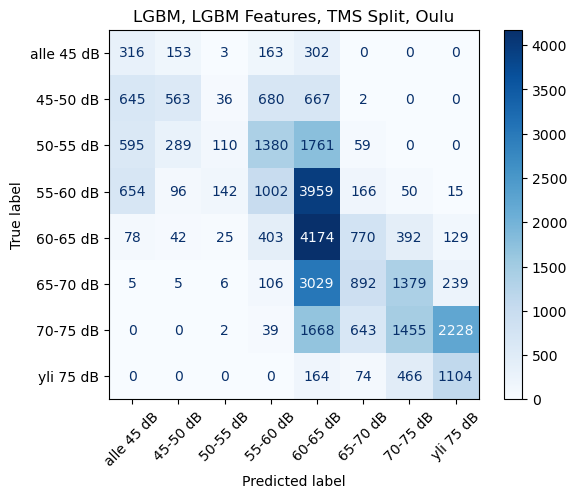

Balanced Accuracy: 0.3061
F1 Score (Macro): 0.2557


In [66]:
pred_tms = lgbm_clf.predict(X_oulu[features_lgbm])

# Confusion Matrix
cm = confusion_matrix(y_oulu, pred_tms, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("LGBM, LGBM Features, TMS Split, Oulu")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, pred_tms):.4f}")
print(f"F1 Score (Macro): {f1_score(y_oulu, pred_tms, average='macro'):.4f}")

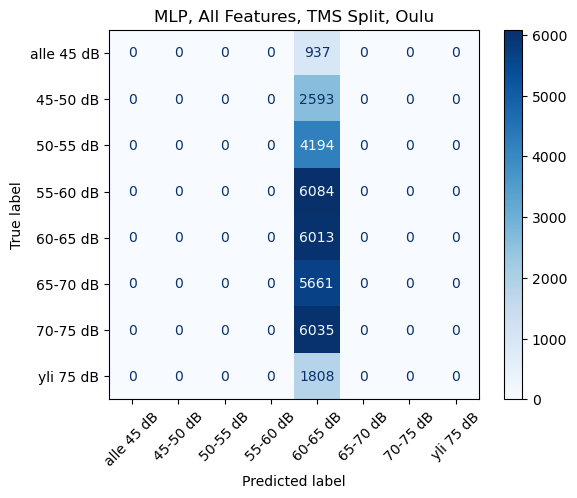

Balanced Accuracy: 0.1250
F1 Score (Macro): 0.0382


In [ ]:
pred_tms = mlp_clf.predict(X_oulu[features_xgb])

# Confusion Matrix
cm = confusion_matrix(y_oulu, pred_tms, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("MLP, XGB Features, TMS Split, Oulu")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, pred_tms):.4f}")
print(f"F1 Score (Macro): {f1_score(y_oulu, pred_tms, average='macro'):.4f}")

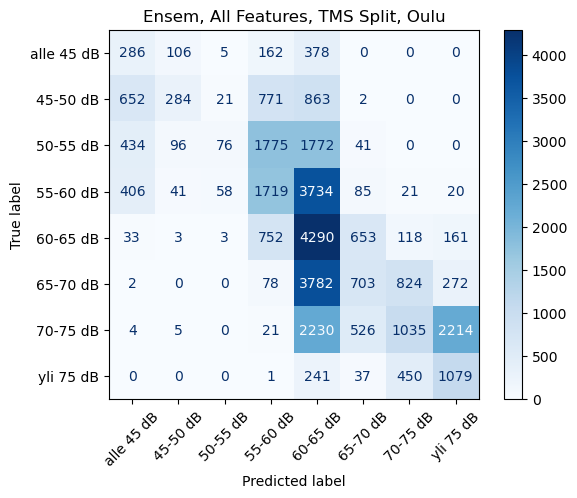

Balanced Accuracy: 0.2902
F1 Score (Macro): 0.2387


In [79]:
pred_tms = ensemble_0.predict(X_oulu)

# Confusion Matrix
cm = confusion_matrix(y_oulu, pred_tms, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensem, All Features, TMS Split, Oulu")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, pred_tms):.4f}")
print(f"F1 Score (Macro): {f1_score(y_oulu, pred_tms, average='macro'):.4f}")

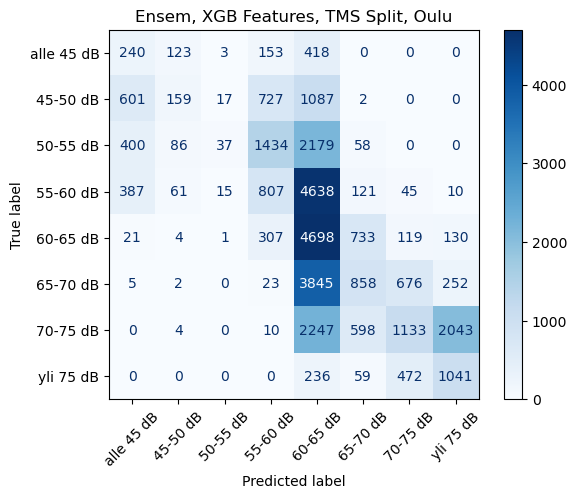

Balanced Accuracy: 0.2694
F1 Score (Macro): 0.2151


In [80]:
pred_tms = ensemble_tms.predict(X_oulu[features_xgb])

# Confusion Matrix
cm = confusion_matrix(y_oulu, pred_tms, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("Ensem, XGB Features, TMS Split, Oulu")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, pred_tms):.4f}")
print(f"F1 Score (Macro): {f1_score(y_oulu, pred_tms, average='macro'):.4f}")

# TrAdaBoost

## TMS Split

In [84]:
rf_clf_tr = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

from adapt.instance_based import TrAdaBoost

mask_test = X_oulu['tmsnumber'].isin([1257, 1254])
X_test_oulu = X_oulu[mask_test].drop(columns=['tmsnumber'])
y_test_oulu = y_oulu[mask_test]

mask_train = ~(mask_test)
X_train_oulu = X_oulu[mask_train].drop(columns=['tmsnumber'])
y_train_oulu = y_oulu[mask_train]

tr_model = TrAdaBoost(rf_clf_tr, n_estimators=1, Xt=X_train_oulu[features_rf], yt=y_train_oulu, random_state=0)
tr_model.fit(X_cv[features_rf], y_cv)

Iteration 0 - Error: 0.0586


TrAdaBoost(Xt=       local_build_height_200m  elevation_tpi_1600m  building_density_50m  \
4                       42.426             2.752688            384.437317   
5                       42.426             1.779964            512.583090   
6                       42.426             1.493986            384.437317   
7                       42.426             1.714116            512.583090   
8                       42.426            -0.127338            897.020407   
...                        ...                  ...                   ...   
33320                   44.038             5.058486              0.000000   
33321                   44.038             5.214656              0.000000   
33322                   42.300             5.514744              0.000000   
33323                   44.038             2.575264              0.000000   
33324                   44.038             3.448484              0.000000...
8      171.034483  197.172414  
...           ...         ...  
33320  171.034483  197.172414  
33321  171.034483  197.172414  
33322  171.034483  197.172414  
33323  171.034483  197.172414  
33324  171.034483  197.172414  

[29956 rows x 78 columns],
           estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
           n_estimators=1, random_state=0,
           yt=4        0
5        0
6        0
7        0
8        0
        ..
33320    2
33321    2
33322    2
33323    2
33324    2
Name: d_noise_lvl, Length: 29956, dtype: int8)

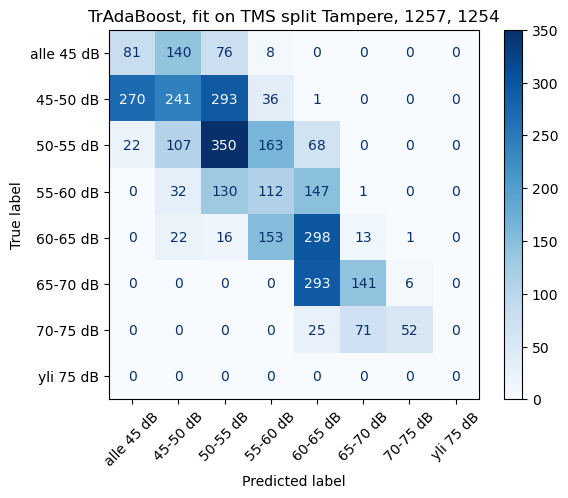

F1 Macro: 0.3792
Balanced Accuracy: 0.3678


In [85]:
preds_test_oulu = tr_model.predict(X_test_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test_oulu, preds_test_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, fit on TMS split Tampere, 1257, 1254")
plt.show()

print(f"F1 Macro: {f1_score(y_test_oulu, preds_test_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test_oulu, preds_test_oulu):.4f}")

In [ ]:
features_rf = ['log_dist_tertiary',
 'y',
 'elevation_tpi_200m',
 'elevation_tpi_800m',
 'log_dist_primary',
 'elevation_tpi_1600m',
 'avg_building_height_1600m',
 'x',
 'elevation_dem',
 'trunk_length_1600m',
 'tertiary_length_800m',
 'motorway_length_50m',
 'log_tms_road',
 'trunk_length_100m',
 'residential_length_400m',
 'log_dist_water',
 'log_dist_trunk',
 'log_dist_secondary',
 'building_density_400m',
 'elevation_tpi_100m',
 'log_dist_motorway',
 'building_tpi_1600m',
 'primary_length_1600m',
 'trunk_length_25m',
 'secondary_length_800m',
 'secondary_length_1600m',
 'trunk_length_400m',
 'elevation_tpi_400m',
 'tertiary_length_1600m',
 'trunk_length_50m',
 'log_dist_residential',
 'log_dist_pub',
 'log_tms_station',
 'residential_length_1600m',
 'residential_length_200m',
 'trunk_length_200m',
 'residential_length_800m',
 'building_density_800m',
 'avg_building_height_400m',
 'avg_building_height_800m',
 'building_density_1600m',
 'elevation_tpi_50m',
 'building_density_200m',
 'motorway_length_100m',
 'avg_building_height_200m',
 'trunk_length_800m',
 'building_tpi_800m']

In [27]:
rf_clf_tr = RandomForestClassifier(n_estimators=1000, random_state=42, n_jobs=-1)

from adapt.instance_based import TrAdaBoost

mask_test = X_oulu['tmsnumber'].isin([1257, 1254])
X_test_oulu = X_oulu[mask_test].drop(columns=['tmsnumber'])
y_test_oulu = y_oulu[mask_test]

mask_train = ~(mask_test)
X_train_oulu = X_oulu[mask_train].drop(columns=['tmsnumber'])
y_train_oulu = y_oulu[mask_train]

tr_model = TrAdaBoost(rf_clf_tr, n_estimators=3, Xt=X_train_oulu[features_rf], yt=y_train_oulu, random_state=0)
tr_model.fit(X_cv[features_rf], y_cv)

NameError: name 'features_rf' is not defined

In [ ]:
preds_test_oulu = tr_model.predict(X_test_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test_oulu, preds_test_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, fit on TMS split Tampere, 1257, 1254")
plt.show()

print(f"F1 Macro: {f1_score(y_test_oulu, preds_test_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test_oulu, preds_test_oulu):.4f}")

In [87]:
rf_clf_tr = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

from adapt.instance_based import TrAdaBoost

mask_test = X_oulu['tmsnumber'].isin([1257, 1254])
X_test_oulu = X_oulu[mask_test].drop(columns=['tmsnumber'])
y_test_oulu = y_oulu[mask_test]

mask_train = ~(mask_test)
X_train_oulu = X_oulu[mask_train].drop(columns=['tmsnumber'])
y_train_oulu = y_oulu[mask_train]

tr_model = TrAdaBoost(rf_clf_tr, n_estimators=1, Xt=X_cv[features_rf], yt=y_cv, random_state=0)
tr_model.fit(X_train_oulu[features_rf], y_train_oulu)

Iteration 0 - Error: 0.0806


TrAdaBoost(Xt=       local_build_height_200m  elevation_tpi_1600m  building_density_50m  \
0                      147.539            11.642290              0.000000   
1                      146.904            15.566498              0.000000   
2                      146.904            16.206820              0.000000   
3                      146.904            17.142117              0.000000   
4                      146.904            17.466403              0.000000   
...                        ...                  ...                   ...   
30173                  128.162            -5.935159            640.728862   
30174                  128.162            -5.845760            512.583090   
30175                  108.868           -12.511520              0.000000   
30176                  108.868           -11.802580              0.000000   
30177                  128.711             6....
4      626.087719  1164.403509  
...           ...          ...  
30173   47.736842   327.052632  
30174   47.736842   327.052632  
30175  626.087719  1164.403509  
30176  626.087719  1164.403509  
30177  451.642857   441.696429  

[30178 rows x 78 columns],
           estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
           n_estimators=1, random_state=0,
           yt=0        6
1        7
2        6
3        6
4        6
        ..
30173    4
30174    4
30175    3
30176    3
30177    7
Name: d_noise_lvl, Length: 30178, dtype: int8)

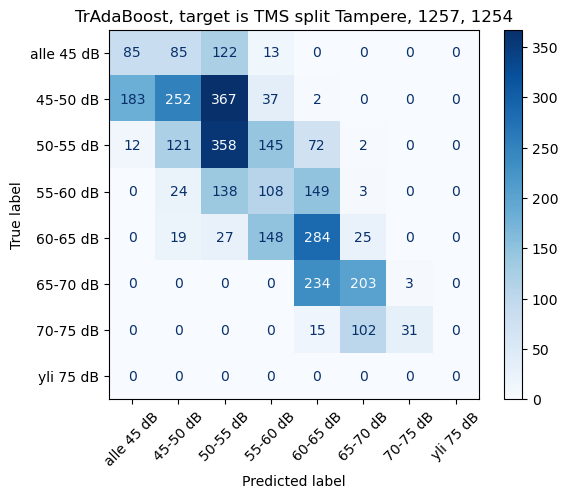

F1 Macro: 0.3779
Balanced Accuracy: 0.3677


In [88]:
preds_test_oulu = tr_model.predict(X_test_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test_oulu, preds_test_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, target is TMS split Tampere, 1257, 1254")
plt.show()

print(f"F1 Macro: {f1_score(y_test_oulu, preds_test_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test_oulu, preds_test_oulu):.4f}")

In [89]:
rf_clf_tr = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

from adapt.instance_based import TrAdaBoost

mask_test = X_oulu['tmsnumber'].isin([1257, 1254])
X_test_oulu = X_oulu[mask_test].drop(columns=['tmsnumber'])
y_test_oulu = y_oulu[mask_test]

# mask_train = ~(mask_test)
# X_train_oulu = X_oulu[mask_train].drop(columns=['tmsnumber'])
# y_train_oulu = y_oulu[mask_train]

tr_model = TrAdaBoost(rf_clf_tr, n_estimators=1, Xt=X_cv[features_rf], yt=y_cv, random_state=0)
tr_model.fit(X_test[features_rf], y_test)

Iteration 0 - Error: 0.0799


TrAdaBoost(Xt=       local_build_height_200m  elevation_tpi_1600m  building_density_50m  \
0                      147.539            11.642290              0.000000   
1                      146.904            15.566498              0.000000   
2                      146.904            16.206820              0.000000   
3                      146.904            17.142117              0.000000   
4                      146.904            17.466403              0.000000   
...                        ...                  ...                   ...   
30173                  128.162            -5.935159            640.728862   
30174                  128.162            -5.845760            512.583090   
30175                  108.868           -12.511520              0.000000   
30176                  108.868           -11.802580              0.000000   
30177                  128.711             6....
4      626.087719  1164.403509  
...           ...          ...  
30173   47.736842   327.052632  
30174   47.736842   327.052632  
30175  626.087719  1164.403509  
30176  626.087719  1164.403509  
30177  451.642857   441.696429  

[30178 rows x 78 columns],
           estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
           n_estimators=1, random_state=0,
           yt=0        6
1        7
2        6
3        6
4        6
        ..
30173    4
30174    4
30175    3
30176    3
30177    7
Name: d_noise_lvl, Length: 30178, dtype: int8)

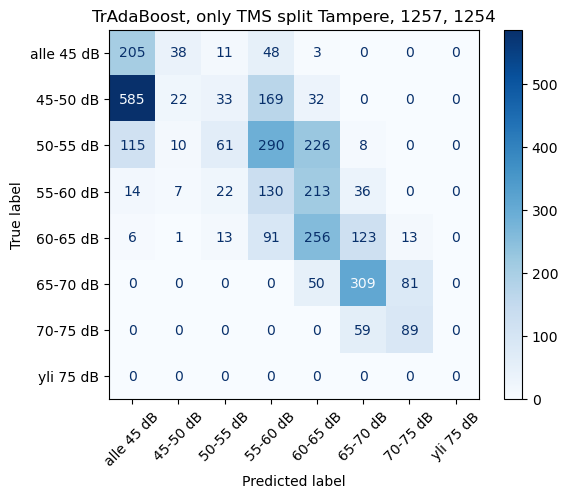

F1 Macro: 0.3316
Balanced Accuracy: 0.4150


In [90]:
preds_test_oulu = tr_model.predict(X_test_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test_oulu, preds_test_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, only TMS split Tampere, 1257, 1254")
plt.show()

print(f"F1 Macro: {f1_score(y_test_oulu, preds_test_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test_oulu, preds_test_oulu):.4f}")

In [91]:
rf_clf_tr = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

from adapt.instance_based import TrAdaBoost

mask_test = X_oulu['tmsnumber'].isin([1257, 1254])
X_test_oulu = X_oulu[mask_test].drop(columns=['tmsnumber'])
y_test_oulu = y_oulu[mask_test]

# mask_train = ~(mask_test)
# X_train_oulu = X_oulu[mask_train].drop(columns=['tmsnumber'])
# y_train_oulu = y_oulu[mask_train]

tr_model = TrAdaBoost(rf_clf_tr, n_estimators=1, Xt=X_test[features_rf], yt=y_test, random_state=0)
tr_model.fit(X_cv[features_rf], y_cv)   

Iteration 0 - Error: 0.0842


TrAdaBoost(Xt=      local_build_height_200m  elevation_tpi_1600m  building_density_50m  \
0                     123.467             7.962420           1281.457724   
1                     127.137             7.309514           1409.603496   
2                     132.952             5.683597           1409.603496   
3                     132.952             5.424320           1794.040813   
4                     132.952             4.936384           2178.478131   
...                       ...                  ...                   ...   
5581                  122.978            18.885086            256.291545   
5582                  122.978            18.878802            256.291545   
5583                  123.546            18.982262            128.145772   
5584                  123.546            17.123799            128.145772   
5585                  12...
3     127.214286  415.892857  
4     127.214286  415.892857  
...          ...         ...  
5581  127.214286  415.892857  
5582  127.214286  415.892857  
5583  127.214286  415.892857  
5584  127.214286  415.892857  
5585  127.214286  415.892857  

[5586 rows x 78 columns],
           estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
           n_estimators=1, random_state=0,
           yt=0       0
1       0
2       1
3       1
4       1
       ..
5581    0
5582    0
5583    0
5584    0
5585    0
Name: d_noise_lvl, Length: 5586, dtype: int8)

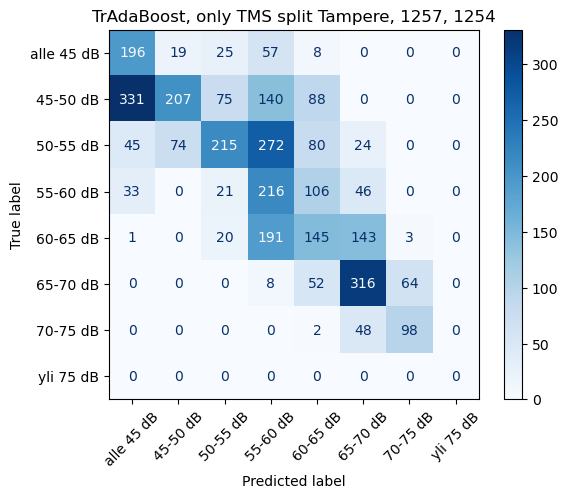

F1 Macro: 0.4385
Balanced Accuracy: 0.4817


In [92]:
preds_test_oulu = tr_model.predict(X_test_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test_oulu, preds_test_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, only TMS split Tampere, 1257, 1254")
plt.show()

print(f"F1 Macro: {f1_score(y_test_oulu, preds_test_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test_oulu, preds_test_oulu):.4f}")

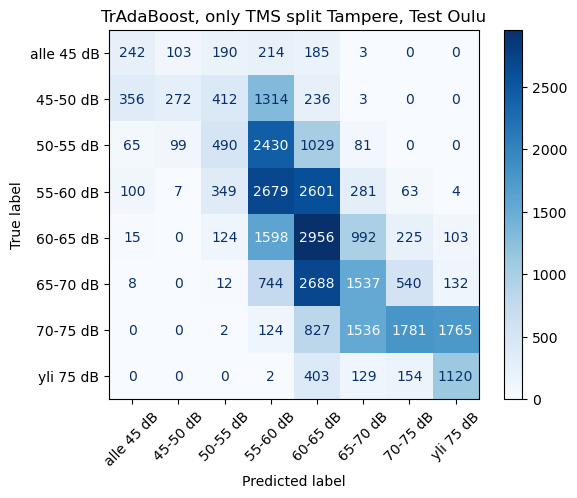

F1 Macro: 0.3111
Balanced Accuracy: 0.3248


In [93]:
preds_oulu = tr_model.predict(X_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_oulu, preds_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, only TMS split Tampere, Test Oulu")
plt.show()

print(f"F1 Macro: {f1_score(y_oulu, preds_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, preds_oulu):.4f}")

## Random Split

In [ ]:
X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

In [101]:
rf_clf_tr = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

from adapt.instance_based import TrAdaBoost

mask_test = X_oulu['tmsnumber'].isin([1257, 1254])
X_test_oulu = X_oulu[mask_test].drop(columns=['tmsnumber'])
y_test_oulu = y_oulu[mask_test]

mask_train = ~(mask_test)
X_train_oulu = X_oulu[mask_train].drop(columns=['tmsnumber'])
y_train_oulu = y_oulu[mask_train]

tr_model = TrAdaBoost(rf_clf_tr, n_estimators=1, Xt=X_train_oulu[features_rf], yt=y_train_oulu, random_state=0)
tr_model.fit(X_cv0[features_rf], y_cv0)

Iteration 0 - Error: 0.0589


TrAdaBoost(Xt=       local_build_height_200m  elevation_tpi_1600m  building_density_50m  \
4                       42.426             2.752688            384.437317   
5                       42.426             1.779964            512.583090   
6                       42.426             1.493986            384.437317   
7                       42.426             1.714116            512.583090   
8                       42.426            -0.127338            897.020407   
...                        ...                  ...                   ...   
33320                   44.038             5.058486              0.000000   
33321                   44.038             5.214656              0.000000   
33322                   42.300             5.514744              0.000000   
33323                   44.038             2.575264              0.000000   
33324                   44.038             3.448484              0.000000...
8      171.034483  197.172414  
...           ...         ...  
33320  171.034483  197.172414  
33321  171.034483  197.172414  
33322  171.034483  197.172414  
33323  171.034483  197.172414  
33324  171.034483  197.172414  

[29956 rows x 78 columns],
           estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
           n_estimators=1, random_state=0,
           yt=4        0
5        0
6        0
7        0
8        0
        ..
33320    2
33321    2
33322    2
33323    2
33324    2
Name: d_noise_lvl, Length: 29956, dtype: int8)

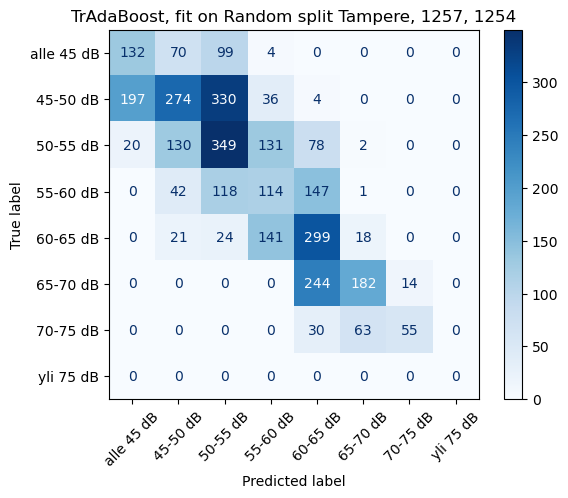

F1 Macro: 0.4256
Balanced Accuracy: 0.4143


In [102]:
preds_test_oulu = tr_model.predict(X_test_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test_oulu, preds_test_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, fit on Random split Tampere, 1257, 1254")
plt.show()

print(f"F1 Macro: {f1_score(y_test_oulu, preds_test_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test_oulu, preds_test_oulu):.4f}")

In [99]:
rf_clf_tr = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

from adapt.instance_based import TrAdaBoost

mask_test = X_oulu['tmsnumber'].isin([1257, 1254])
X_test_oulu = X_oulu[mask_test].drop(columns=['tmsnumber'])
y_test_oulu = y_oulu[mask_test]

mask_train = ~(mask_test)
X_train_oulu = X_oulu[mask_train].drop(columns=['tmsnumber'])
y_train_oulu = y_oulu[mask_train]

tr_model = TrAdaBoost(rf_clf_tr, n_estimators=1, Xt=X_cv0[features_rf], yt=y_cv0, random_state=0)
tr_model.fit(X_train_oulu[features_rf], y_train_oulu)

Iteration 0 - Error: 0.0847


TrAdaBoost(Xt=       local_build_height_200m  elevation_tpi_1600m  building_density_50m  \
15821                  115.167             2.326562              0.000000   
32207                  136.339             7.299936              0.000000   
246                    149.142            19.636885              0.000000   
16165                  108.868           -12.500332              0.000000   
7222                   127.239             3.675215            512.583090   
...                        ...                  ...                   ...   
24986                  122.832            -2.075216           3075.498537   
7648                   108.464            -0.807252           1922.186586   
18548                  113.201            -4.632552              0.000000   
11406                  118.847             7.111263              0.00000...
7222   127.214286   415.892857  
...           ...          ...  
24986  127.214286   415.892857  
7648    60.000000   382.142857  
18548   60.000000   382.142857  
11406  129.052632   411.122807  
10419   95.339286   399.964286  

[32187 rows x 78 columns],
           estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
           n_estimators=1, random_state=0,
           yt=15821    5
32207    5
246      6
16165    3
7222     4
        ..
24986    1
7648     0
18548    3
11406    3
10419    6
Name: d_noise_lvl, Length: 32187, dtype: int8)

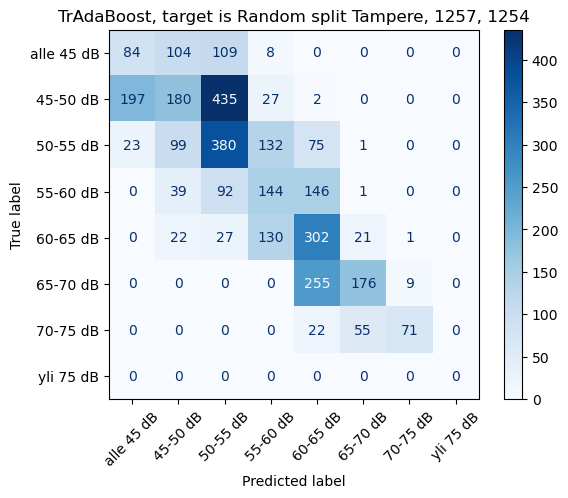

F1 Macro: 0.4162
Balanced Accuracy: 0.4066


In [100]:
preds_test_oulu = tr_model.predict(X_test_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test_oulu, preds_test_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, target is Random split Tampere, 1257, 1254")
plt.show()

print(f"F1 Macro: {f1_score(y_test_oulu, preds_test_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test_oulu, preds_test_oulu):.4f}")

In [94]:
rf_clf_tr = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

from adapt.instance_based import TrAdaBoost

mask_test = X_oulu['tmsnumber'].isin([1257, 1254])
X_test_oulu = X_oulu[mask_test].drop(columns=['tmsnumber'])
y_test_oulu = y_oulu[mask_test]

# mask_train = ~(mask_test)
# X_train_oulu = X_oulu[mask_train].drop(columns=['tmsnumber'])
# y_train_oulu = y_oulu[mask_train]

tr_model = TrAdaBoost(rf_clf_tr, n_estimators=1, Xt=X_test0[features_rf], yt=y_test0, random_state=0)
tr_model.fit(X_cv0[features_rf], y_cv0)

Iteration 0 - Error: 0.0785


TrAdaBoost(Xt=       local_build_height_200m  elevation_tpi_1600m  building_density_50m  \
19221                  116.324            -1.811381              0.000000   
9430                   144.876             7.947591            384.437317   
15594                  136.981            19.276775              0.000000   
20431                  113.017            -8.349574            128.145772   
22591                  119.067             3.360102              0.000000   
...                        ...                  ...                   ...   
34386                  129.490             1.023092              0.000000   
10813                  122.031             8.277262              0.000000   
20893                  106.112            -8.525431              0.000000   
22876                  106.955            -7.825259           1025.1661...
22591  451.642857   441.696429  
...           ...          ...  
34386   60.000000   382.142857  
10813  129.052632   411.122807  
20893  451.642857   441.696429  
22876  451.642857   441.696429  
22997  451.642857   441.696429  

[3577 rows x 78 columns],
           estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
           n_estimators=1, random_state=0,
           yt=19221    3
9430     3
15594    4
20431    7
22591    4
        ..
34386    5
10813    6
20893    5
22876    3
22997    4
Name: d_noise_lvl, Length: 3577, dtype: int8)

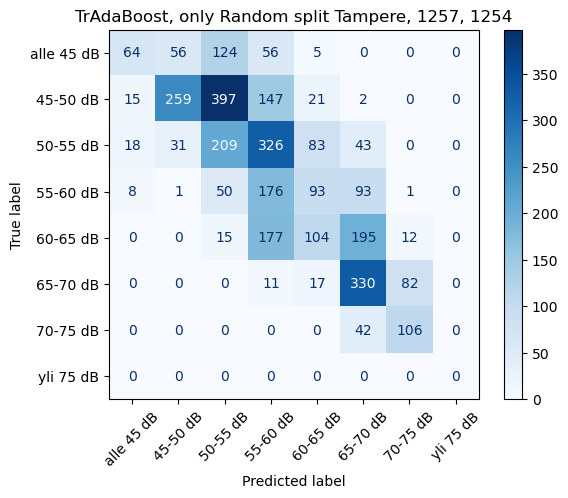

F1 Macro: 0.3899
Balanced Accuracy: 0.4146


In [95]:
preds_test_oulu = tr_model.predict(X_test_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_test_oulu, preds_test_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, only Random split Tampere, 1257, 1254")
plt.show()

print(f"F1 Macro: {f1_score(y_test_oulu, preds_test_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test_oulu, preds_test_oulu):.4f}")

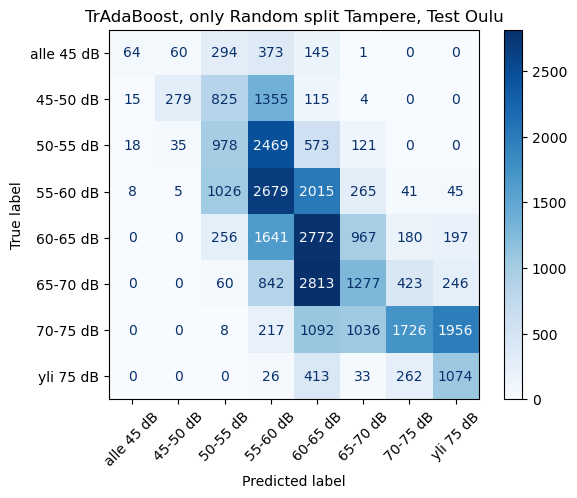

F1 Macro: 0.2913
Balanced Accuracy: 0.3020


In [96]:
preds_oulu = tr_model.predict(X_oulu[features_rf])

# Confusion Matrix
cm = confusion_matrix(y_oulu, preds_oulu, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("TrAdaBoost, only Random split Tampere, Test Oulu")
plt.show()

print(f"F1 Macro: {f1_score(y_oulu, preds_oulu, average='macro'):.4f}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_oulu, preds_oulu):.4f}")

# Other tests

## TrAdaBoost vs XGB, combined data

In [28]:
X_tam, X_test, y_tam, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42,
)
X_oulu, Xt_test, y_oulu, yt_test = train_test_split(
    X_t, y_t, test_size=0.9, random_state=42,
)

X_combined = pd.concat([X_oulu, X_tam], axis=0).reset_index(drop=True)
y_combined = pd.concat([y_oulu, y_tam], axis=0).reset_index(drop=True)

xgb_clf0 = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)
xgb_clf0.fit(X_combined, y_combined)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1000, n_jobs=None, num_class=8,
              num_parallel_tree=None, ...)

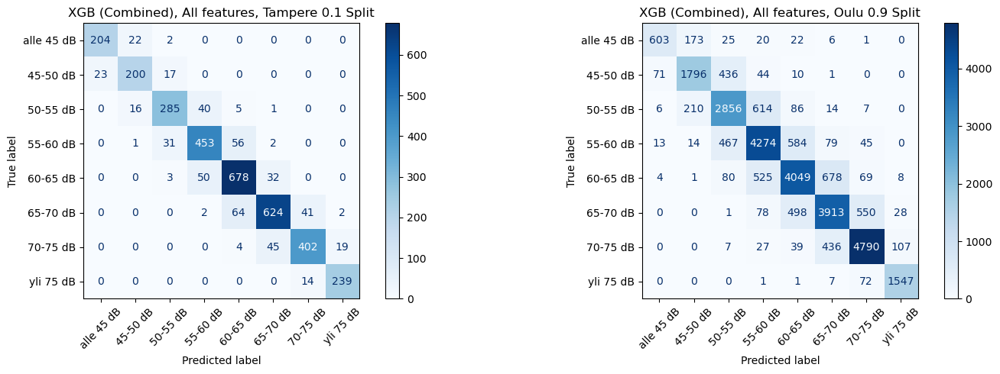

Tampere Balanced Accuracy: 0.8654
Tampere F1 Score: 0.8660

Oulu Balanced Accuracy: 0.7951
Oulu F1 Score: 0.8023


In [29]:
preds_oul = xgb_clf0.predict(Xt_test)
preds_tam = xgb_clf0.predict(X_test)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot Tampere confusion matrix on the second subplot
cm_tam = confusion_matrix(y_test, preds_tam)
disp_tam = ConfusionMatrixDisplay(confusion_matrix=cm_tam, display_labels=order_noise)
disp_tam.plot(cmap='Blues', xticks_rotation=45, ax=ax1)
ax1.set_title("XGB (Combined), All features, Tampere 0.1 Split")

# Plot Oulu confusion matrix on the first subplot
cm_oul = confusion_matrix(yt_test, preds_oul)
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm_oul, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45, ax=ax2)
ax2.set_title("XGB (Combined), All features, Oulu 0.9 Split")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Tampere Balanced Accuracy: {balanced_accuracy_score(y_test, preds_tam):.4f}")
print(f"Tampere F1 Score: {f1_score(y_test, preds_tam, average='macro'):.4f}")
print("")
print(f"Oulu Balanced Accuracy: {balanced_accuracy_score(yt_test, preds_oul):.4f}")
print(f"Oulu F1 Score: {f1_score(yt_test, preds_oul, average='macro'):.4f}")

In [30]:
X_tam, X_test, y_tam, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42,
)
X_oulu, Xt_test, y_oulu, yt_test = train_test_split(
    X_t, y_t, test_size=0.9, random_state=42,
)

xgb_clf = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)

tr_model = TrAdaBoost(xgb_clf, n_estimators=1, Xt=X_oulu, yt=y_oulu, random_state=0)
tr_model.fit(X_tam, y_tam)

Iteration 0 - Error: 0.0037


TrAdaBoost(Xt=       log_dist_motorway  motorway_length_12_5m  motorway_length_25m  \
7736            7.687101                    0.0                  0.0   
4283            4.143135                    0.0                  0.0   
7531            7.150114                    0.0                  0.0   
14139           6.589238                    0.0                  0.0   
17069           4.143135                    0.0                  0.0   
...                  ...                    ...                  ...   
16850           3.367296                    0.0                  0.0   
6265            8.998089                    0.0                  0.0   
11284           5.164786                    0.0                  0.0   
860             8.992279                    0.0                  0.0   
15795           5.996723                    0.0                  0.0   

       motorway_length_50m  motorway_length_100m  motorway_length_200m  \
7736              0.000000              0.000000              0....
                                   max_cat_to_onehot=None, max_delta_step=None,
                                   max_depth=None, max_leaves=None,
                                   min_child_weight=None, missing=nan,
                                   monotone_constraints=None,
                                   multi_strategy=None, n_estimators=1000,
                                   n_jobs=None, num_class=8,
                                   num_parallel_tree=None, ...),
           n_estimators=1, random_state=0,
           yt=7736     5
4283     3
7531     5
14139    5
17069    6
        ..
16850    6
6265     4
11284    3
860      1
15795    2
Name: d_noise_lvl, Length: 3332, dtype: int8)

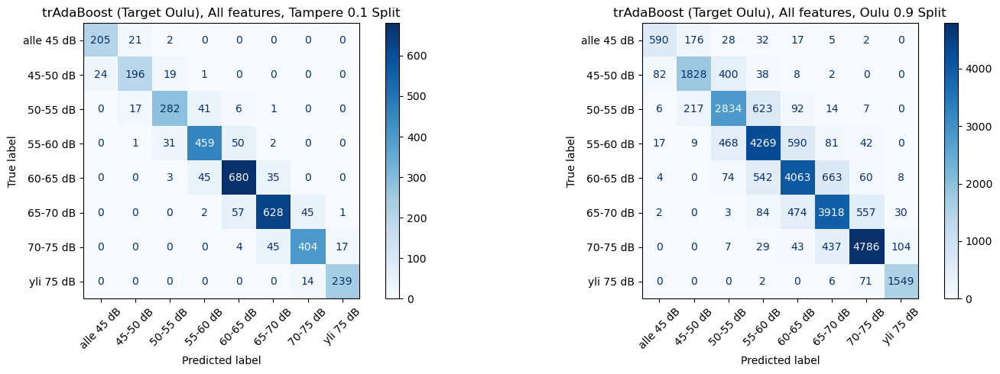

Tampere Balanced Accuracy: 0.8657
Tampere F1 Score: 0.8667

Oulu Balanced Accuracy: 0.7946
Oulu F1 Score: 0.8012


In [31]:
tr_preds_oul = tr_model.predict(Xt_test)
tr_preds_tam = tr_model.predict(X_test)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot Tampere confusion matrix on the second subplot
cm_tam = confusion_matrix(y_test, tr_preds_tam)
disp_tam = ConfusionMatrixDisplay(confusion_matrix=cm_tam, display_labels=order_noise)
disp_tam.plot(cmap='Blues', xticks_rotation=45, ax=ax1)
ax1.set_title("trAdaBoost (Target Oulu), All features, Tampere 0.1 Split")

# Plot Oulu confusion matrix on the first subplot
cm_oul = confusion_matrix(yt_test, tr_preds_oul)
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm_oul, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45, ax=ax2)
ax2.set_title("trAdaBoost (Target Oulu), All features, Oulu 0.9 Split")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Tampere Balanced Accuracy: {balanced_accuracy_score(y_test, tr_preds_tam):.4f}")
print(f"Tampere F1 Score: {f1_score(y_test, tr_preds_tam, average='macro'):.4f}")
print("")
print(f"Oulu Balanced Accuracy: {balanced_accuracy_score(yt_test, tr_preds_oul):.4f}")
print(f"Oulu F1 Score: {f1_score(yt_test, tr_preds_oul, average='macro'):.4f}")

### 0.1 split Tampere, 0.3 split Oulu

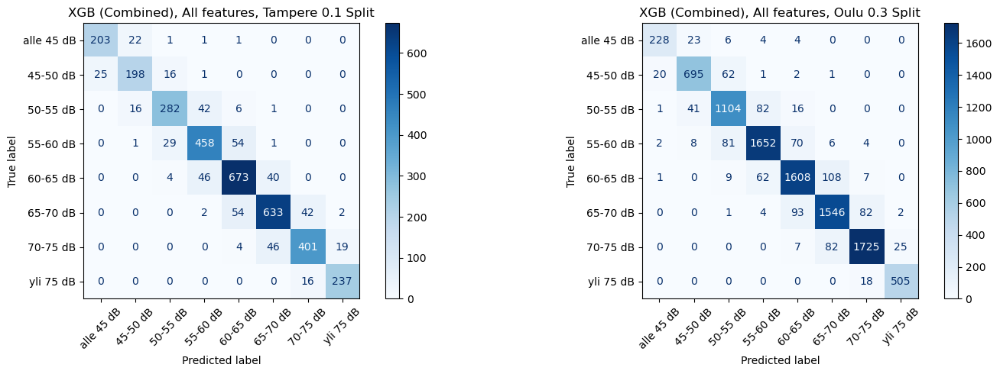

Tampere RMSE: 0.4058
Tampere Balanced Accuracy: 0.8634
Tampere F1 Score: 0.8646

Oulu RMSE: 0.3647
Oulu Balanced Accuracy: 0.9048
Oulu F1 Score: 0.9066


In [27]:
preds_oul = xgb_clf0.predict(Xt_test)
preds_tam = xgb_clf0.predict(X_test)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot Tampere confusion matrix on the second subplot
cm_tam = confusion_matrix(y_test, preds_tam)
disp_tam = ConfusionMatrixDisplay(confusion_matrix=cm_tam, display_labels=order_noise)
disp_tam.plot(cmap='Blues', xticks_rotation=45, ax=ax1)
ax1.set_title("XGB (Combined), All features, Tampere 0.1 Split")

# Plot Oulu confusion matrix on the first subplot
cm_oul = confusion_matrix(yt_test, preds_oul)
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm_oul, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45, ax=ax2)
ax2.set_title("XGB (Combined), All features, Oulu 0.3 Split")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Tampere RMSE: {root_mean_squared_error(y_test, preds_tam):.4f}")
print(f"Tampere Balanced Accuracy: {balanced_accuracy_score(y_test, preds_tam):.4f}")
print(f"Tampere F1 Score: {f1_score(y_test, preds_tam, average='macro'):.4f}")
print("")
print(f"Oulu RMSE: {root_mean_squared_error(yt_test, preds_oul):.4f}")
print(f"Oulu Balanced Accuracy: {balanced_accuracy_score(yt_test, preds_oul):.4f}")
print(f"Oulu F1 Score: {f1_score(yt_test, preds_oul, average='macro'):.4f}")

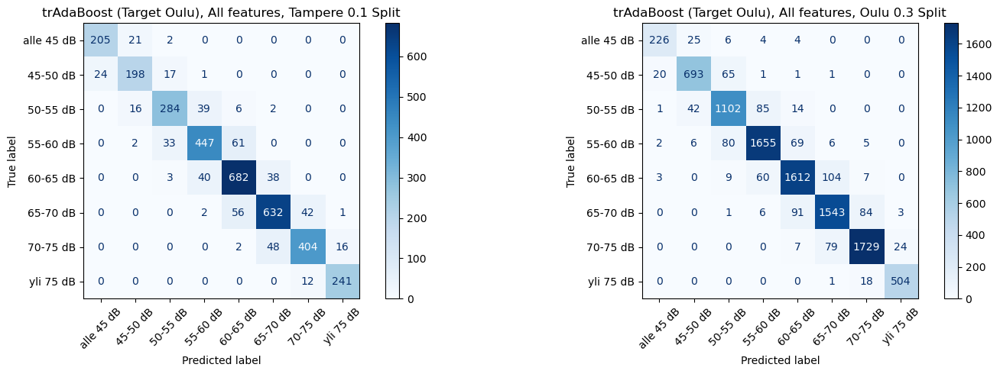

Tampere RMSE: 0.3946
Tampere Balanced Accuracy: 0.8667
Tampere F1 Score: 0.8677

Oulu RMSE: 0.3687
Oulu Balanced Accuracy: 0.9036
Oulu F1 Score: 0.9055


In [25]:
tr_preds_oul = tr_model.predict(Xt_test)
tr_preds_tam = tr_model.predict(X_test)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot Tampere confusion matrix on the second subplot
cm_tam = confusion_matrix(y_test, tr_preds_tam)
disp_tam = ConfusionMatrixDisplay(confusion_matrix=cm_tam, display_labels=order_noise)
disp_tam.plot(cmap='Blues', xticks_rotation=45, ax=ax1)
ax1.set_title("trAdaBoost (Target Oulu), All features, Tampere 0.1 Split")

# Plot Oulu confusion matrix on the first subplot
cm_oul = confusion_matrix(yt_test, tr_preds_oul)
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm_oul, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45, ax=ax2)
ax2.set_title("trAdaBoost (Target Oulu), All features, Oulu 0.3 Split")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Tampere RMSE: {root_mean_squared_error(y_test, tr_preds_tam):.4f}")
print(f"Tampere Balanced Accuracy: {balanced_accuracy_score(y_test, tr_preds_tam):.4f}")
print(f"Tampere F1 Score: {f1_score(y_test, tr_preds_tam, average='macro'):.4f}")
print("")
print(f"Oulu RMSE: {root_mean_squared_error(yt_test, tr_preds_oul):.4f}")
print(f"Oulu Balanced Accuracy: {balanced_accuracy_score(yt_test, tr_preds_oul):.4f}")
print(f"Oulu F1 Score: {f1_score(yt_test, tr_preds_oul, average='macro'):.4f}")

### Per class check

In [ ]:
# then for each dataset compute per-class recall:
for name, y_true, y_pred, ax in [
    ("Tampere", y_test, tr_preds_tam, ax1),
    ("Oulu",    yt_test, tr_preds_oul, ax2)
]:
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(num_classes))
    # recall per class = TP / (TP + FN)
    recall_per_class = np.diag(cm) / cm.sum(axis=1)
    print(f"\nPer-class recall (accuracy) for {name}:")
    for label, rec in zip(np.arange(num_classes), recall_per_class):
        print(f"  {label:>5} : {rec:.4f}")

## Stratified Geospatial Split

In [ ]:
from sklearn.cluster import KMeans
from sklearn.model_selection import GroupKFold

kmeans_tam = KMeans(n_clusters=175, random_state=42)
df["spatial_cluster175"] = kmeans_tam.fit_predict(df[["x", "y"]])

# 3. GroupKFold on those 25 groups, still 5 splits
groups = df["spatial_cluster175"]
cv = GroupKFold(n_splits=5)
for train_idx, test_idx in cv.split(X, y, groups):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

###### Oulu

kmeans_oul = KMeans(n_clusters=175, random_state=42)
df_oulu["spatial_cluster175"] = kmeans_oul.fit_predict(df_oulu[["x", "y"]])

# 3. GroupKFold on those 25 groups, still 5 splits
groups_t = df_oulu["spatial_cluster175"]
cv = GroupKFold(n_splits=5)
for train_idx, test_idx in cv.split(X_t, y_t, groups_t):
    Xt_train, Xt_test = X_t.iloc[train_idx], X_t.iloc[test_idx]
    yt_train, yt_test = y_t.iloc[train_idx], y_t.iloc[test_idx]

In [11]:
print(len(X_train))
print(len(X_test))

28608
7156


In [35]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import GroupKFold

def spatial_cv_stats(df, X, y, ks, n_splits=5):
    stats = []
    for k in ks:
        labels = KMeans(n_clusters=k, random_state=42).fit_predict(df[['x','y']])
        fold_means = []
        cv = GroupKFold(n_splits=n_splits)
        for _, test_idx in cv.split(X, y, labels):
            fold_means.append(y.iloc[test_idx].mean())
        stats.append({
            'k': k,
            'range': max(fold_means) - min(fold_means),
            'std': np.std(fold_means)
        })
    return pd.DataFrame(stats)

# ks = [150, 152, 155, 157, 160, 162, 165, 167, 170]
# ks = [5, 25, 50, 75, 100, 125, 150, 175, 200, 225, 250]
ks = [150, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180]
df_stats = spatial_cv_stats(df_oulu, X_t, y_t, ks)
print("oulu")
print(df_stats)

print("")
df_stats2 = spatial_cv_stats(df, X, y, ks)
print("tampere")
print(df_stats2)

oulu
      k     range       std
0   150  0.424848  0.147130
1   170  0.432379  0.146742
2   171  0.436976  0.172181
3   172  0.580532  0.197673
4   173  0.410910  0.134176
5   174  0.275105  0.087235
6   175  0.452677  0.167761
7   176  0.244769  0.080707
8   177  0.530548  0.170070
9   178  0.299002  0.100625
10  179  0.488672  0.175295
11  180  0.584408  0.215574

tampere
      k     range       std
0   150  0.275851  0.120563
1   170  0.245321  0.093110
2   171  0.540059  0.179724
3   172  0.293964  0.117867
4   173  0.323598  0.128856
5   174  0.184418  0.067695
6   175  0.663327  0.254812
7   176  0.346126  0.111894
8   177  0.356774  0.133405
9   178  0.162772  0.075156
10  179  0.412068  0.144358
11  180  0.330970  0.111437


In [36]:
from sklearn.model_selection import GroupKFold

groups_cv_tam = df["spatial_cluster175"]
cv_tam = GroupKFold(n_splits=5)

# 1) Compute overall mean
global_mean_tam = y.mean()
print(f"TAMP Global noise mean: {global_mean_tam:.2f}")

# 2) Print each fold’s test‐set mean
for fold_idx, (_, test_idx) in enumerate(cv_tam.split(X, y, groups_cv_tam)):
    fold_mean = y.iloc[test_idx].mean()
    print(f"TAMP Fold {fold_idx} mean: {fold_mean:.2f}")

print("")

groups_cv = df_oulu["spatial_cluster175"]
cv = GroupKFold(n_splits=5)

# 1) Compute overall mean
global_mean = y_t.mean()
print(f"OULU Global noise mean: {global_mean:.2f}")

# 2) Print each fold’s test‐set mean
for fold_idx, (_, test_idx) in enumerate(cv.split(X_t, y_t, groups_cv)):
    fold_mean = y_t.iloc[test_idx].mean()
    print(f"OULU Fold {fold_idx} mean: {fold_mean:.2f}")

TAMP Global noise mean: 3.83
TAMP Fold 0 mean: 3.93
TAMP Fold 1 mean: 4.04
TAMP Fold 2 mean: 4.10
TAMP Fold 3 mean: 3.63
TAMP Fold 4 mean: 3.43

OULU Global noise mean: 3.91
OULU Fold 0 mean: 3.83
OULU Fold 1 mean: 4.22
OULU Fold 2 mean: 3.79
OULU Fold 3 mean: 3.77
OULU Fold 4 mean: 3.97


In [37]:
import pandas as pd

print("Tamp")
vc_tam = df['spatial_cluster175'].value_counts()
print(vc_tam.describe())
print("Oulu")
vc_oulu = df_oulu['spatial_cluster175'].value_counts()
print(vc_oulu.describe())

Tamp
count    175.000000
mean     204.365714
std       68.878061
min       77.000000
25%      151.000000
50%      198.000000
75%      258.000000
max      431.000000
Name: spatial_cluster175, dtype: float64
Oulu
count    175.000000
mean     190.428571
std       59.624633
min       78.000000
25%      150.500000
50%      182.000000
75%      233.500000
max      348.000000
Name: spatial_cluster175, dtype: float64


In [38]:
import xgboost as xgb

model_tam = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    eval_metric="mlogloss",
    n_estimators=1000
)

model_tam.fit(
    X_train, y_train,
    verbose=False
)

model_oulu = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    eval_metric="mlogloss",
    n_estimators=1000
)

model_oulu.fit(
    Xt_train, yt_train,
    verbose=False
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1000,
              n_jobs=None, num_class=8, num_parallel_tree=None, ...)

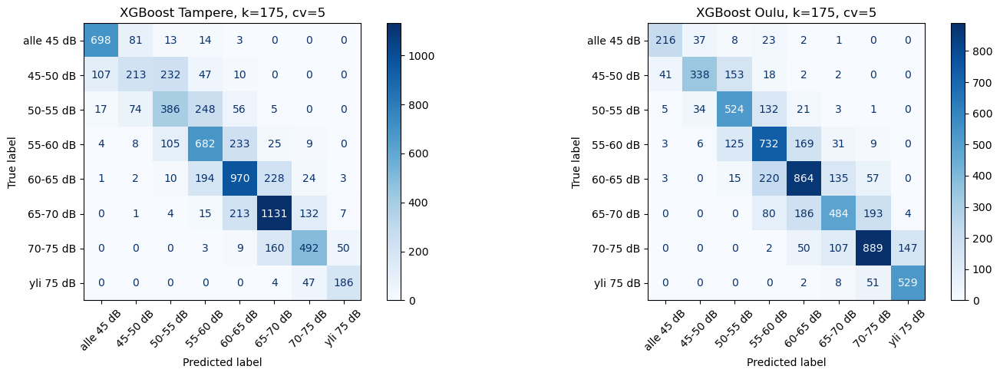

Tampere Balanced Accuracy: 0.6559
Tampere F1 Score: 0.6569

Oulu Balanced Accuracy: 0.6988
Oulu F1 Score: 0.7002


In [39]:
geo_preds_tam = model_tam.predict(X_test)
geo_preds_oul = model_oulu.predict(Xt_test)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot Tampere confusion matrix on the second subplot
cm_tam = confusion_matrix(y_test, geo_preds_tam, labels=np.arange(num_classes))
disp_tam = ConfusionMatrixDisplay(confusion_matrix=cm_tam, display_labels=order_noise)
disp_tam.plot(cmap='Blues', xticks_rotation=45, ax=ax1)
ax1.set_title("XGBoost Tampere, k=175, cv=5")

# Plot Oulu confusion matrix on the first subplot
cm_oul = confusion_matrix(yt_test, geo_preds_oul, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm_oul, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45, ax=ax2)
ax2.set_title("XGBoost Oulu, k=175, cv=5")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Tampere Balanced Accuracy: {balanced_accuracy_score(y_test, geo_preds_tam):.4f}")
print(f"Tampere F1 Score: {f1_score(y_test, geo_preds_tam, average='macro'):.4f}")
print("")
print(f"Oulu Balanced Accuracy: {balanced_accuracy_score(yt_test, geo_preds_oul):.4f}")
print(f"Oulu F1 Score: {f1_score(yt_test, geo_preds_oul, average='macro'):.4f}")

## XGB LUR

In [25]:
import numpy as np
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import root_mean_squared_error, balanced_accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler

all_models = []
all_mae = []
all_balanced_acc = []
all_f1_score = []
all_y_tests = []
all_preds = []

for i in range(0, 1):  # Consider increasing the range for multiple iterations
    # Train-test split
    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
    X_cv0, X_test0, y_cv0, y_test0 = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)
    
    # Feature standardization
    # scaler = StandardScaler()
    # X_train_scaled = scaler.fit_transform(X_train)
    # X_test_scaled = scaler.transform(X_test)
    
    # model.fit(X_train_scaled, y_train)

    # Initialize and train XGBRegressor
    model = xgb.XGBRegressor(
        objective='reg:squarederror',
        # eval_metric="mlogloss",
        n_estimators=1000,
        random_state=42
    )
    
    model.fit(X_cv0, y_cv0)
    
    # Predict and convert to classes
    preds_continuous = model.predict(X_test0)
    preds = np.round(preds_continuous).astype(int)
    preds = np.clip(preds, 0, len(order_noise)-1)  # Ensure valid class range
    
    # Store results
    # all_models.append((scaler, model))
    all_preds.append(preds)
    all_y_tests.append(y_test0)
    
    # Calculate metrics
    all_mae.append(root_mean_squared_error(y_test0, preds))
    all_balanced_acc.append(balanced_accuracy_score(y_test0, preds))
    all_f1_score.append(f1_score(y_test0, preds, average='macro'))
    print(f"Finished iteration {i+1}")

# Results summary
print(f"\nAverage RMSE: {np.mean(all_mae):.4f}")
print(f"Average Balanced Accuracy: {np.mean(all_balanced_acc):.4f}")
print(f"Average F1 Score: {np.mean(all_f1_score):.4f}")

Finished iteration 1

Average RMSE: 0.3900
Average Balanced Accuracy: 0.8573
Average F1 Score: 0.8601


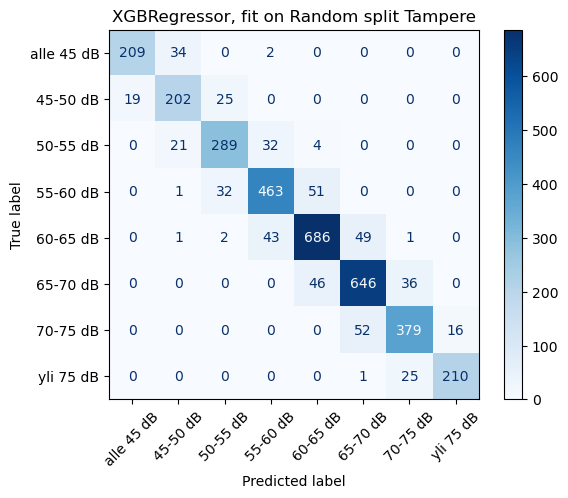

In [26]:
# Confusion Matrix
cm = confusion_matrix(y_test0, preds, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("XGBRegressor, fit on Random split Tampere")
plt.show()

## Other LUR

In [ ]:
import numpy as np
from sklearn.linear_model import LassoCV
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, balanced_accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler

all_models = []
all_mae = []
all_balanced_acc = []
all_f1_score = []
all_y_tests = []
all_preds = []

for i in range(0,1):
    # Train-test split
    X_cv0, X_test0, y_cv0, y_test0 = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)
    
    # Feature standardization
    # scaler = StandardScaler()
    # X_train_scaled = scaler.fit_transform(X_train)
    # X_test_scaled = scaler.transform(X_test)
    
    # # LUR model with Lasso (automatic variable selection)
    # model = LassoCV(cv=5, random_state=i)
    # model.fit(X_train_scaled, y_train)

    # LUR model with Lasso (automatic variable selection)
    model = LogisticRegressionCV(cv=5, random_state=42, max_iter=1000)
    model.fit(X_cv0, y_cv0)
    
    # Predict and convert to classes
    preds_continuous = model.predict(X_test0)
    preds = np.round(preds_continuous).astype(int)
    preds = np.clip(preds, 0, len(order_noise)-1)  # Ensure valid class range
    
    # Store results
    # all_models.append((scaler, model))
    all_preds.append(preds)
    all_y_tests.append(y_test0)
    
    # Calculate metrics
    all_mae.append(mean_absolute_error(y_test0, preds))
    all_balanced_acc.append(balanced_accuracy_score(y_test0, preds))
    all_f1_score.append(f1_score(y_test0, preds, average='macro'))
    print(f"Finished iteration {i+1}")

# Results summary
print(f"\nAverage RMSE: {np.mean(all_mae):.4f}")
print(f"Average Balanced Accuracy: {np.mean(all_balanced_acc):.4f}")
print(f"Average F1 Score: {np.mean(all_f1_score):.4f}")

# 11m 54.8s

c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-

Finished iteration 1

Average RMSE: 0.7389
Average Balanced Accuracy: 0.4974
Average F1 Score: 0.4982


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
import numpy as np
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, balanced_accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler

all_models = []
all_mae = []
all_balanced_acc = []
all_f1_score = []
all_y_tests = []
all_preds = []

for i in range(0,1):
    # Train-test split
    X_cv0, X_test0, y_cv0, y_test0 = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)
    
    # Feature standardization
    # scaler = StandardScaler()
    # X_train_scaled = scaler.fit_transform(X_train)
    # X_test_scaled = scaler.transform(X_test)
    
    # LUR model with Lasso (automatic variable selection)
    model = LassoCV(cv=5, random_state=42, max_iter=1000)
    model.fit(X_cv0, y_cv0)

    # Predict and convert to classes
    preds_continuous = model.predict(X_test0)
    preds = np.round(preds_continuous).astype(int)
    preds = np.clip(preds, 0, len(order_noise)-1)  # Ensure valid class range
    
    # Store results
    # all_models.append((scaler, model))
    all_preds.append(preds)
    all_y_tests.append(y_test0)
    
    # Calculate metrics
    all_mae.append(mean_absolute_error(y_test0, preds))
    all_balanced_acc.append(balanced_accuracy_score(y_test0, preds))
    all_f1_score.append(f1_score(y_test0, preds, average='macro'))
    print(f"Finished iteration {i+1}")

# Results summary
print(f"\nAverage RMSE: {np.mean(all_mae):.4f}")
print(f"Average Balanced Accuracy: {np.mean(all_balanced_acc):.4f}")
print(f"Average F1 Score: {np.mean(all_f1_score):.4f}")

# 5.7s

Finished iteration 1

Average RMSE: 0.7193
Average Balanced Accuracy: 0.3669
Average F1 Score: 0.3752


c:\Users\Dan\anaconda3\envs\thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.377e+02, tolerance: 1.133e+01
  model = cd_fast.enet_coordinate_descent(


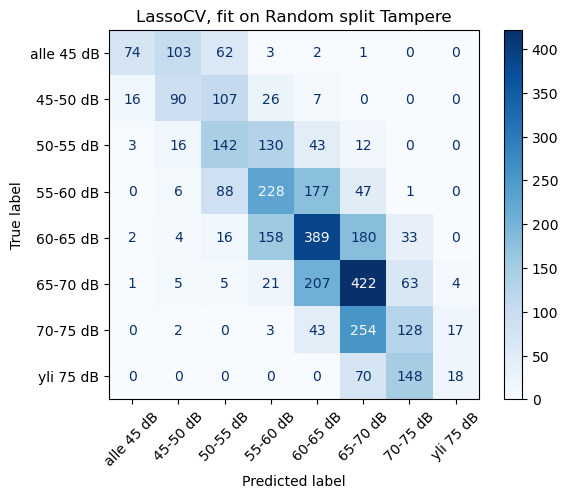

In [12]:
# Confusion Matrix
cm = confusion_matrix(y_test0, preds, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("LassoCV, fit on Random split Tampere")
plt.show()

# 438, 456 pair

In [16]:
mask_438 = X['tmsnumber'] == 438
mask_test   = X['tmsnumber'] == 456
mask_src    = ~(mask_438 | mask_test)

# 3) carve out your folds from X, y
X_rest_1    = X[ mask_src ].drop(columns=['tmsnumber'])
y_rest_1   = y[ mask_src ]

X_438       = X[ mask_438 ].drop(columns=['tmsnumber'])
y_438       = y[ mask_438 ]

X_456       = X[ mask_test ].drop(columns=['tmsnumber'])
y_456       = y[ mask_test ]

print(len(X_rest_1))
print(len(X_438))
print(len(X_456))

32267
2309
1188


In [17]:
from adapt.instance_based import TrAdaBoost

model = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=100
)

tr_model_xgb = TrAdaBoost(model, n_estimators=50, Xt=X_438, yt=y_438, random_state=0)
tr_model_xgb.fit(X_rest_1, y_rest_1)

Iteration 0 - Error: 0.1099
Iteration 1 - Error: 0.0939
Iteration 2 - Error: 0.0747
Iteration 3 - Error: 0.0566
Iteration 4 - Error: 0.0404
Iteration 5 - Error: 0.0342
Iteration 6 - Error: 0.0265
Iteration 7 - Error: 0.0223
Iteration 8 - Error: 0.0201
Iteration 9 - Error: 0.0186
Iteration 10 - Error: 0.0153
Iteration 11 - Error: 0.0136
Iteration 12 - Error: 0.0119
Iteration 13 - Error: 0.0102
Iteration 14 - Error: 0.0100
Iteration 15 - Error: 0.0084
Iteration 16 - Error: 0.0084
Iteration 17 - Error: 0.0075
Iteration 18 - Error: 0.0071
Iteration 19 - Error: 0.0065
Iteration 20 - Error: 0.0063
Iteration 21 - Error: 0.0059
Iteration 22 - Error: 0.0054
Iteration 23 - Error: 0.0053
Iteration 24 - Error: 0.0055
Iteration 25 - Error: 0.0048
Iteration 26 - Error: 0.0044
Iteration 27 - Error: 0.0046
Iteration 28 - Error: 0.0041
Iteration 29 - Error: 0.0040
Iteration 30 - Error: 0.0039
Iteration 31 - Error: 0.0038
Iteration 32 - Error: 0.0035
Iteration 33 - Error: 0.0037
Iteration 34 - Error: 0.

TrAdaBoost(Xt=       log_dist_motorway  motorway_length_12_5m  motorway_length_25m  \
3326            5.699393                    0.0                  0.0   
3327            5.704069                    0.0                  0.0   
3328            5.710059                    0.0                  0.0   
3329            5.717092                    0.0                  0.0   
3330            5.722598                    0.0                  0.0   
...                  ...                    ...                  ...   
30243           6.833406                    0.0                  0.0   
30244           6.865207                    0.0                  0.0   
30245           6.880736                    0.0                  0.0   
30246           6.896028                    0.0                  0.0   
30247           6.900702                    0.0                  0.0   

       motorway_length_50m  motorway_length_100m  motorway_length_200m  \
3326                   0.0                   0.0                   0.0   
3327                   0.0                   0...
                                   max_cat_to_onehot=None, max_delta_step=None,
                                   max_depth=None, max_leaves=None,
                                   min_child_weight=None, missing=nan,
                                   monotone_constraints=None,
                                   multi_strategy=None, n_estimators=100,
                                   n_jobs=None, num_class=8,
                                   num_parallel_tree=None, ...),
           n_estimators=50, random_state=0,
           yt=3326     5
3327     5
3328     5
3329     5
3330     5
        ..
30243    5
30244    5
30245    5
30246    6
30247    6
Name: d_noise_lvl, Length: 2309, dtype: int8)

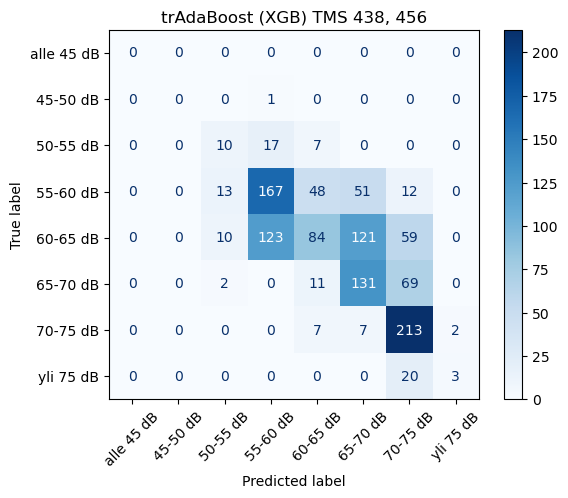

Balanced Accuracy: 0.3936
F1 Score: 0.3677


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import f1_score

preds_456 = tr_model_xgb.predict(X_456)

cm = confusion_matrix(y_456, preds_456, labels=np.arange(8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title("trAdaBoost (XGB) TMS 438, 456")
plt.show()

print(f"Balanced Accuracy: {balanced_accuracy_score(y_456, preds_456):.4f}")
print(f"F1 Score: {f1_score(y_456, preds_456, average='macro'):.4f}")

# 439, 458 pair

In [19]:
mask_439 = X['tmsnumber'] == 439
mask_test   = X['tmsnumber'] == 458
mask_src    = ~(mask_439 | mask_test)

# 3) carve out your folds from X, y
X_rest_2    = X[ mask_src ].drop(columns=['tmsnumber'])
y_rest_2    = y[ mask_src ]

X_439       = X[ mask_439 ].drop(columns=['tmsnumber'])
y_439       = y[ mask_439 ]

X_458       = X[ mask_test ].drop(columns=['tmsnumber'])
y_458       = y[ mask_test ]

print(len(X_rest_2))
print(len(X_439))
print(len(X_458))

26291
2570
6903


In [20]:
from adapt.instance_based import TrAdaBoost

model = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=100
)

tr_model_xgb = TrAdaBoost(model, n_estimators=50, Xt=X_439, yt=y_439, random_state=0)
tr_model_xgb.fit(X_rest_2, y_rest_2)

Iteration 0 - Error: 0.1116
Iteration 1 - Error: 0.0894
Iteration 2 - Error: 0.0715
Iteration 3 - Error: 0.0542
Iteration 4 - Error: 0.0398
Iteration 5 - Error: 0.0322
Iteration 6 - Error: 0.0273
Iteration 7 - Error: 0.0231
Iteration 8 - Error: 0.0186
Iteration 9 - Error: 0.0160
Iteration 10 - Error: 0.0145
Iteration 11 - Error: 0.0133
Iteration 12 - Error: 0.0115
Iteration 13 - Error: 0.0102
Iteration 14 - Error: 0.0091
Iteration 15 - Error: 0.0086
Iteration 16 - Error: 0.0078
Iteration 17 - Error: 0.0077
Iteration 18 - Error: 0.0066
Iteration 19 - Error: 0.0062
Iteration 20 - Error: 0.0055
Iteration 21 - Error: 0.0056
Iteration 22 - Error: 0.0051
Iteration 23 - Error: 0.0053
Iteration 24 - Error: 0.0050
Iteration 25 - Error: 0.0044
Iteration 26 - Error: 0.0045
Iteration 27 - Error: 0.0045
Iteration 28 - Error: 0.0042
Iteration 29 - Error: 0.0043
Iteration 30 - Error: 0.0040
Iteration 31 - Error: 0.0035
Iteration 32 - Error: 0.0037
Iteration 33 - Error: 0.0035
Iteration 34 - Error: 0.

TrAdaBoost(Xt=       log_dist_motorway  motorway_length_12_5m  motorway_length_25m  \
9161            8.003516                    0.0                  0.0   
9162            8.004393                    0.0                  0.0   
9163            8.008503                    0.0                  0.0   
9164            8.012605                    0.0                  0.0   
9165            8.004470                    0.0                  0.0   
...                  ...                    ...                  ...   
35805           7.881889                    0.0                  0.0   
35806           7.877252                    0.0                  0.0   
35807           7.872591                    0.0                  0.0   
35808           7.867907                    0.0                  0.0   
35809           7.866054                    0.0                  0.0   

       motorway_length_50m  motorway_length_100m  motorway_length_200m  \
9161                   0.0                   0.0                   0.0   
9162                   0.0                   0...
                                   max_cat_to_onehot=None, max_delta_step=None,
                                   max_depth=None, max_leaves=None,
                                   min_child_weight=None, missing=nan,
                                   monotone_constraints=None,
                                   multi_strategy=None, n_estimators=100,
                                   n_jobs=None, num_class=8,
                                   num_parallel_tree=None, ...),
           n_estimators=50, random_state=0,
           yt=9161     6
9162     5
9163     5
9164     6
9165     5
        ..
35805    0
35806    0
35807    0
35808    0
35809    0
Name: d_noise_lvl, Length: 2570, dtype: int8)

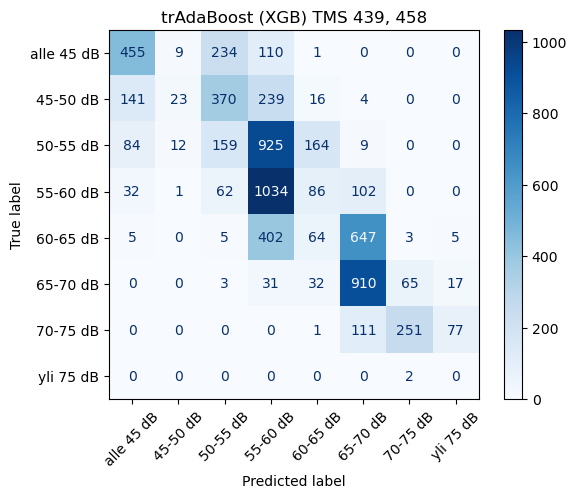

Balanced Accuracy: 0.3727
F1 Score: 0.3365


In [21]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import f1_score

preds_458 = tr_model_xgb.predict(X_458)

cm = confusion_matrix(y_458, preds_458, labels=np.arange(8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title("trAdaBoost (XGB) TMS 439, 458")
plt.show()

print(f"Balanced Accuracy: {balanced_accuracy_score(y_458, preds_458):.4f}")
print(f"F1 Score: {f1_score(y_458, preds_458, average='macro'):.4f}")

## TMS 458, 439

In [23]:
from adapt.instance_based import TrAdaBoost

model = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=100
)

tr_model_xgb = TrAdaBoost(model, n_estimators=50, Xt=X_458, yt=y_458, random_state=0)
tr_model_xgb.fit(X_rest_2, y_rest_2)

Iteration 0 - Error: 0.1345
Iteration 1 - Error: 0.1172
Iteration 2 - Error: 0.0945
Iteration 3 - Error: 0.0751
Iteration 4 - Error: 0.0556
Iteration 5 - Error: 0.0481
Iteration 6 - Error: 0.0374
Iteration 7 - Error: 0.0338
Iteration 8 - Error: 0.0302
Iteration 9 - Error: 0.0263
Iteration 10 - Error: 0.0243
Iteration 11 - Error: 0.0227
Iteration 12 - Error: 0.0207
Iteration 13 - Error: 0.0197
Iteration 14 - Error: 0.0179
Iteration 15 - Error: 0.0172
Iteration 16 - Error: 0.0170
Iteration 17 - Error: 0.0161
Iteration 18 - Error: 0.0165
Iteration 19 - Error: 0.0161
Iteration 20 - Error: 0.0149
Iteration 21 - Error: 0.0149
Iteration 22 - Error: 0.0163
Iteration 23 - Error: 0.0151
Iteration 24 - Error: 0.0143
Iteration 25 - Error: 0.0148
Iteration 26 - Error: 0.0147
Iteration 27 - Error: 0.0153
Iteration 28 - Error: 0.0141
Iteration 29 - Error: 0.0142
Iteration 30 - Error: 0.0135
Iteration 31 - Error: 0.0144
Iteration 32 - Error: 0.0143
Iteration 33 - Error: 0.0154
Iteration 34 - Error: 0.

TrAdaBoost(Xt=       log_dist_motorway  motorway_length_12_5m  motorway_length_25m  \
192             7.914229                    0.0                  0.0   
193             7.909889                    0.0                  0.0   
194             7.905533                    0.0                  0.0   
195             7.901170                    0.0                  0.0   
196             7.896799                    0.0                  0.0   
...                  ...                    ...                  ...   
35433           7.994805                    0.0                  0.0   
35434           7.991223                    0.0                  0.0   
35435           7.987641                    0.0                  0.0   
35436           7.984059                    0.0                  0.0   
35437           7.980462                    0.0                  0.0   

       motorway_length_50m  motorway_length_100m  motorway_length_200m  \
192                    0.0                   0.0                   0.0   
193                    0.0                   0.0                   0.0   
19...
                                   max_cat_threshold=None,
                                   max_cat_to_onehot=None, max_delta_step=None,
                                   max_depth=None, max_leaves=None,
                                   min_child_weight=None, missing=nan,
                                   monotone_constraints=None,
                                   multi_strategy=None, n_estimators=100,
                                   n_jobs=None, num_class=8,
                                   num_parallel_tree=None, ...),
           n_estimators=50, random_state=0,
           yt=192      0
193      0
194      0
195      0
196      0
        ..
35433    2
35434    2
35435    2
35436    2
35437    2
Name: d_noise_lvl, Length: 6903, dtype: int8)

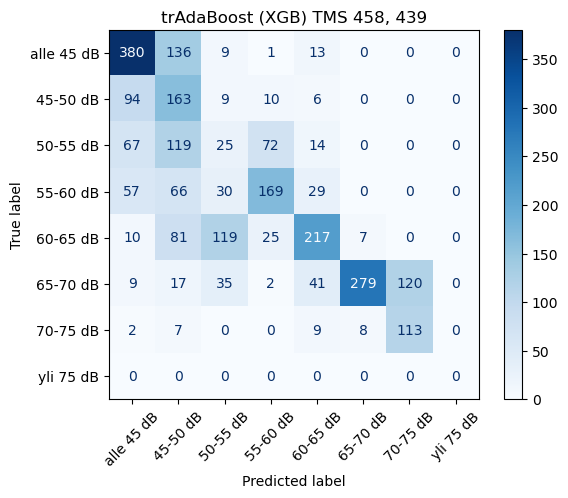

Balanced Accuracy: 0.5270
F1 Score: 0.5030


In [24]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import f1_score

preds_439 = tr_model_xgb.predict(X_439)

cm = confusion_matrix(y_439, preds_439, labels=np.arange(8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title("trAdaBoost (XGB) TMS 458, 439")
plt.show()

print(f"Balanced Accuracy: {balanced_accuracy_score(y_439, preds_439):.4f}")
print(f"F1 Score: {f1_score(y_439, preds_439, average='macro'):.4f}")

# Graphs

In [ ]:
order = ['below 45 dB', '45-50 dB', '50-55 dB', '55-60 dB', 
         '60-65 dB', '65-70 dB', '70-75 dB', 'above 75 dB']

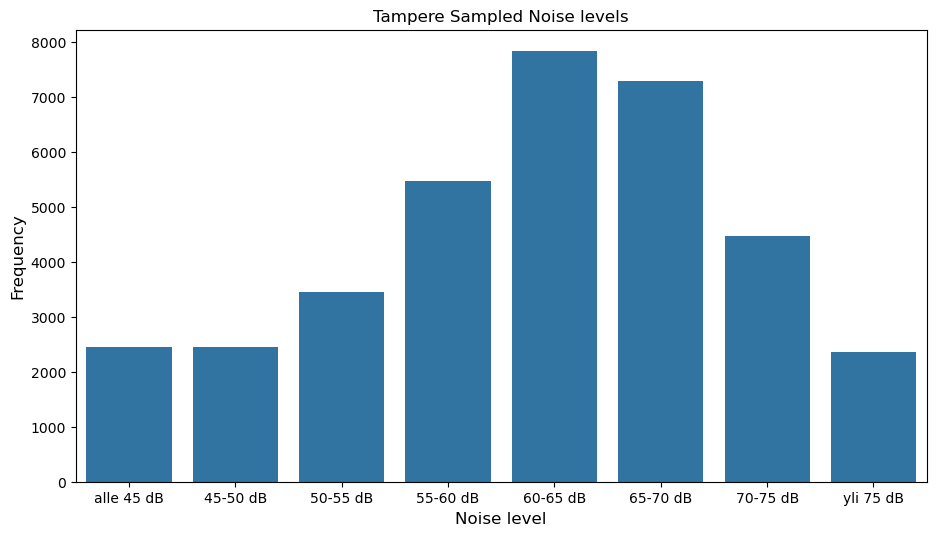

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.countplot(x=y, order=order_num)
plt.title("Tampere Sampled Noise levels", fontsize=12)
plt.xlabel("Noise level", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(ticks=order_num, labels=order)
plt.tight_layout(pad=3.0)
plt.show()

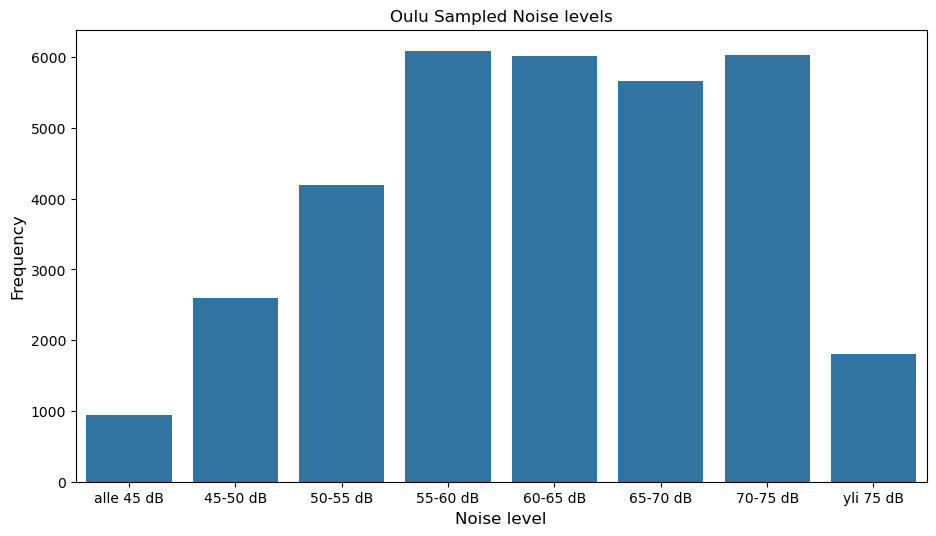

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.countplot(x=y_t, order=order_num)
plt.title("Oulu Sampled Noise levels", fontsize=12)
plt.xlabel("Noise level", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(ticks=order_num, labels=order)
plt.tight_layout(pad=3.0)
plt.show()

In [ ]:
tms_test = [455, 457]
mask_test = X['tmsnumber'].isin(tms_test)
X_cv0 = X[~mask_test].reset_index(drop=True)
y_cv0 = y[~mask_test].reset_index(drop=True)

# Evaluate on test set
X_test0 = X[mask_test].reset_index(drop=True)
y_test0 = y[mask_test].reset_index(drop=True)

rf_clf0 = RandomForestClassifier(
    n_estimators=1000,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf_clf0.fit(X_cv0, y_cv0)

pred_test0 = rf_clf0.predict(X_test0)

cm = confusion_matrix(y_test0, pred_test0, labels=np.arange(num_classes))
disp_oul = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=order_noise)
disp_oul.plot(cmap='Blues', xticks_rotation=45)
plt.title("RF n_est=1000, all features, TMS split")
plt.show()
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test0, pred_test0):.4f}")
print(f"F1 Score (Macro): {f1_score(y_test0, pred_test0, average='macro'):.4f}")
print(f"Features used: {len(X_cv0.columns)}")

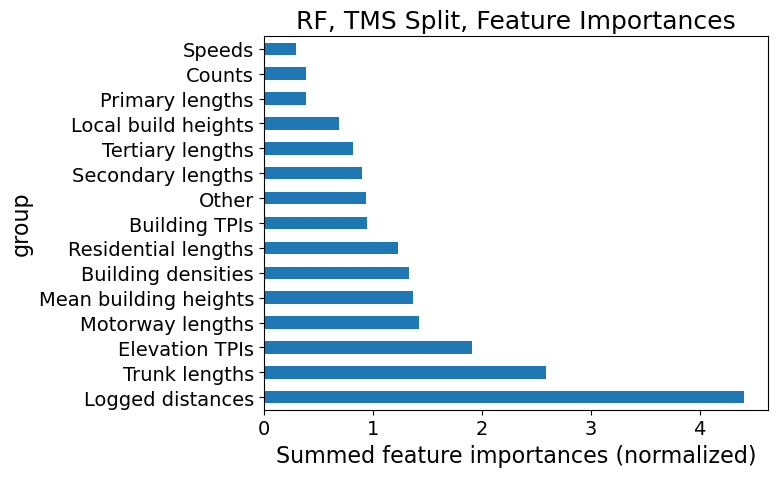

In [17]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Put your groups into a dict: feature → group name
group_defs = {
    "Motorway lengths": motorway_lengths,
    "Trunk lengths": trunk_lengths,
    "Primary lengths": primary_lengths,
    "Secondary lengths": secondary_lengths,
    "Tertiary lengths": tertiary_lengths,
    "Residential lengths": residential_lengths,
    "Building densities": building_densities,
    "Building TPIs": building_tpi,
    "Elevation TPIs": elevation_tpi,
    "Local build heights": local_build_height,
    "Mean building heights": avg_building_height,
    "Logged distances": log_dist,
    "Counts": count_d,
    "Speeds": speed_d,
    "Other": other
}

# 2. Normalize your importances 0–1
importances = rf_clf0.feature_importances_
df = pd.DataFrame({'importance': importances}, index=X_cv0.columns)
df_norm = (df - df.min()) / (df.max() - df.min())

# 3. Build a long DataFrame mapping each feature to its group
records = []
for group_name, feats in group_defs.items():
    for f in feats:
        if f in df_norm.index:
            records.append((group_name, df_norm.at[f, 'importance']))

grouped = pd.DataFrame(records, columns=['group','importance'])

# 4. Aggregate (sum or mean)
agg = grouped.groupby('group')['importance'].sum().sort_values(ascending=False)
# If you’d rather use the mean: 
# agg = grouped.groupby('group')['importance'].mean().sort_values(ascending=False)

# 5. Plot
plt.figure(figsize=(8,5))
agg.plot(kind='barh')
plt.xlabel("Summed feature importances (normalized)")
plt.title("RF, TMS Split, Feature Importances")
plt.tight_layout()
plt.show()


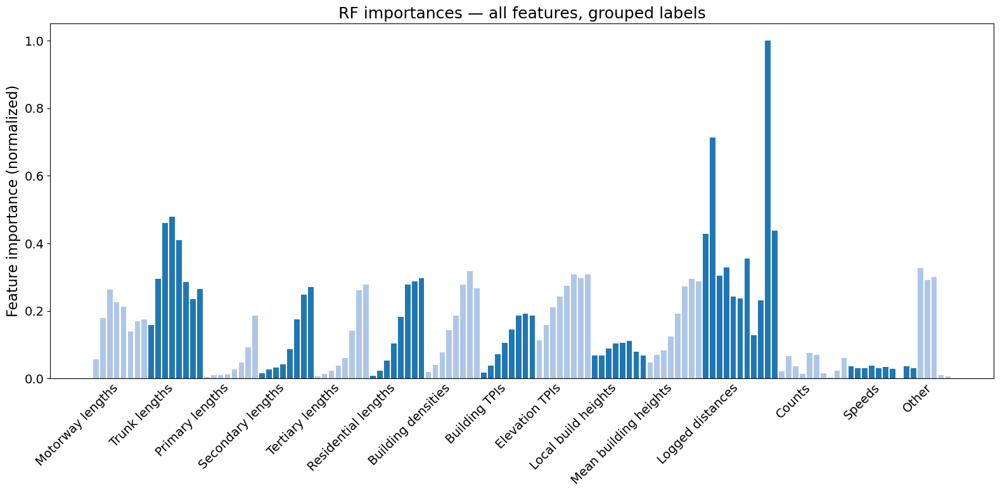

In [16]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# — Optional: set a larger base font size for everything —
plt.rcParams.update({
    'font.size': 14,          # base font size
    'axes.titlesize': 18,     # title font size
    'axes.labelsize': 16,     # axis‐label font size
    'xtick.labelsize': 14,    # x‐tick labels
    'ytick.labelsize': 14,    # y‐tick labels
})

# 1. your original groups → dict of group_name:[features]
group_defs = {
    "Motorway lengths": motorway_lengths,
    "Trunk lengths": trunk_lengths,
    "Primary lengths": primary_lengths,
    "Secondary lengths": secondary_lengths,
    "Tertiary lengths": tertiary_lengths,
    "Residential lengths": residential_lengths,
    "Building densities": building_densities,
    "Building TPIs": building_tpi,
    "Elevation TPIs": elevation_tpi,
    "Local build heights": local_build_height,
    "Mean building heights": avg_building_height,
    "Logged distances": log_dist,
    "Counts": count_d,
    "Speeds": speed_d,
    "Other": other
}

# 2. Normalize importances
importances = rf_clf0.feature_importances_
df = pd.DataFrame({'imp': importances}, index=X_cv0.columns)
dfn = (df - df.min()) / (df.max() - df.min())

# 3. Flatten in the desired order and grab importances
ordered_feats = [f for feats in group_defs.values()
                    for f in feats if f in dfn.index]
imps = dfn.loc[ordered_feats, 'imp'].values

# 4. Compute the x‐positions for each feature
x = np.arange(len(ordered_feats))

# 5. Build a list of group mid‐points for labeling & also build a color list
group_names = []
group_mids = []
bar_colors = []
start = 0

# pick two colors to alternate
palette = ['#aec7e8', '#1f77b4']

for gi, (name, feats) in enumerate(group_defs.items()):
    present = [f for f in feats if f in dfn.index]
    if not present:
        continue
    count = len(present)
    end = start + count
    mid = (start + end - 1) / 2.0

    group_names.append(name)
    group_mids.append(mid)

    color = palette[gi % len(palette)]
    bar_colors += [color] * count

    start = end

# 6. Plot vertical bars with alternating colors
plt.figure(figsize=(16, 8))   # slightly larger figure
plt.bar(x, imps, width=0.8, color=bar_colors)

# 7. Tweak axes
plt.xticks(group_mids, group_names, rotation=45, ha='right')
plt.tick_params(axis='x', length=0)    # hide tick marks
plt.ylabel("Feature importance (normalized)")
plt.title("RF importances — all features, grouped labels")
plt.ylim(0, imps.max() * 1.05)         # a little breathing room
plt.tight_layout()
plt.show()


In [12]:
X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

xgb_clf0 = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=num_classes,
    # eval_metric="mlogloss",
    n_estimators=1000,
    random_state=42
)
xgb_clf0.fit(X_cv0, y_cv0)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1000, n_jobs=None, num_class=8,
              num_parallel_tree=None, ...)

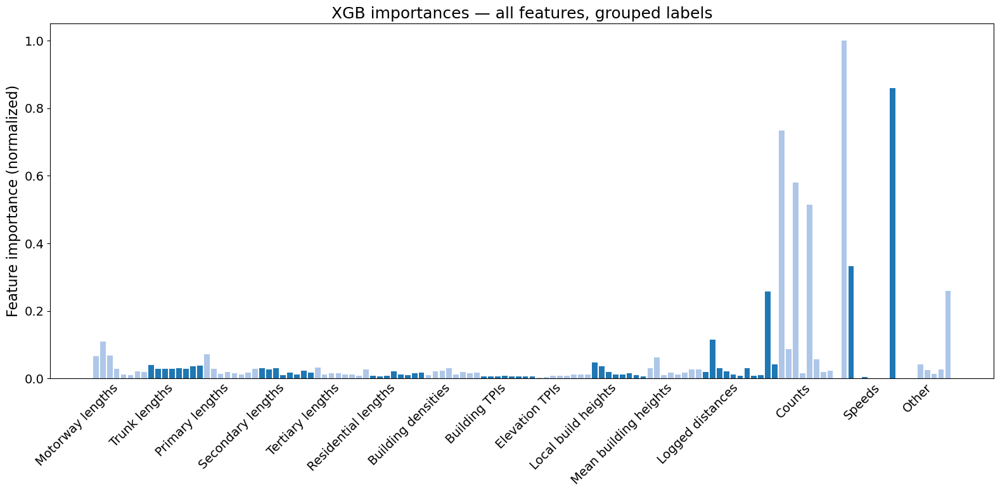

In [14]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# — Optional: set a larger base font size for everything —
plt.rcParams.update({
    'font.size': 14,          # base font size
    'axes.titlesize': 18,     # title font size
    'axes.labelsize': 16,     # axis‐label font size
    'xtick.labelsize': 14,    # x‐tick labels
    'ytick.labelsize': 14,    # y‐tick labels
})

# 1. your original groups → dict of group_name:[features]
group_defs = {
    "Motorway lengths": motorway_lengths,
    "Trunk lengths": trunk_lengths,
    "Primary lengths": primary_lengths,
    "Secondary lengths": secondary_lengths,
    "Tertiary lengths": tertiary_lengths,
    "Residential lengths": residential_lengths,
    "Building densities": building_densities,
    "Building TPIs": building_tpi,
    "Elevation TPIs": elevation_tpi,
    "Local build heights": local_build_height,
    "Mean building heights": avg_building_height,
    "Logged distances": log_dist,
    "Counts": count_d,
    "Speeds": speed_d,
    "Other": other
}

# 2. Normalize importances
importances = xgb_clf0.feature_importances_
df = pd.DataFrame({'imp': importances}, index=X_cv0.columns)
dfn = (df - df.min()) / (df.max() - df.min())

# 3. Flatten in the desired order and grab importances
ordered_feats = [f for feats in group_defs.values()
                    for f in feats if f in dfn.index]
imps = dfn.loc[ordered_feats, 'imp'].values

# 4. Compute the x‐positions for each feature
x = np.arange(len(ordered_feats))

# 5. Build a list of group mid‐points for labeling & also build a color list
group_names = []
group_mids = []
bar_colors = []
start = 0

# pick two colors to alternate
palette = ['#aec7e8', '#1f77b4']

for gi, (name, feats) in enumerate(group_defs.items()):
    present = [f for f in feats if f in dfn.index]
    if not present:
        continue
    count = len(present)
    end = start + count
    mid = (start + end - 1) / 2.0

    group_names.append(name)
    group_mids.append(mid)

    color = palette[gi % len(palette)]
    bar_colors += [color] * count

    start = end

# 6. Plot vertical bars with alternating colors
plt.figure(figsize=(16, 8))   # slightly larger figure
plt.bar(x, imps, width=0.8, color=bar_colors)

# 7. Tweak axes
plt.xticks(group_mids, group_names, rotation=45, ha='right')
plt.tick_params(axis='x', length=0)    # hide tick marks
plt.ylabel("Feature importance (normalized)")
plt.title("XGB importances — all features, grouped labels")
plt.ylim(0, imps.max() * 1.05)         # a little breathing room
plt.tight_layout()
plt.show()


In [13]:
X_cv0, X_test0, y_cv0, y_test0 = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

lgbm_clf0 = LGBMClassifier(
    objective='multiclass',
    num_class=num_classes,
    n_estimators=1000,
    random_state=42
)
lgbm_clf0.fit(X_cv0, y_cv0)

# Evaluate on test set
pred_test0 = lgbm_clf0.predict(X_test0)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24769
[LightGBM] [Info] Number of data points in the train set: 32187, number of used features: 124
[LightGBM] [Info] Start training from score -2.683105
[LightGBM] [Info] Start training from score -2.678570
[LightGBM] [Info] Start training from score -2.337262
[LightGBM] [Info] Start training from score -1.878051
[LightGBM] [Info] Start training from score -1.519670
[LightGBM] [Info] Start training from score -1.591182
[LightGBM] [Info] Start training from score -2.079286
[LightGBM] [Info] Start training from score -2.717791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

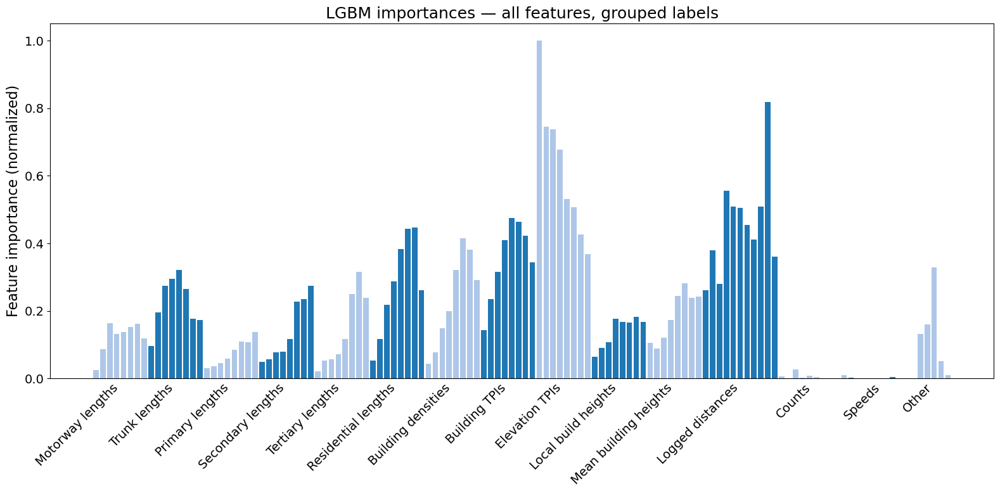

In [15]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# — Optional: set a larger base font size for everything —
plt.rcParams.update({
    'font.size': 14,          # base font size
    'axes.titlesize': 18,     # title font size
    'axes.labelsize': 16,     # axis‐label font size
    'xtick.labelsize': 14,    # x‐tick labels
    'ytick.labelsize': 14,    # y‐tick labels
})

# 1. your original groups → dict of group_name:[features]
group_defs = {
    "Motorway lengths": motorway_lengths,
    "Trunk lengths": trunk_lengths,
    "Primary lengths": primary_lengths,
    "Secondary lengths": secondary_lengths,
    "Tertiary lengths": tertiary_lengths,
    "Residential lengths": residential_lengths,
    "Building densities": building_densities,
    "Building TPIs": building_tpi,
    "Elevation TPIs": elevation_tpi,
    "Local build heights": local_build_height,
    "Mean building heights": avg_building_height,
    "Logged distances": log_dist,
    "Counts": count_d,
    "Speeds": speed_d,
    "Other": other
}

# 2. Normalize importances
importances = lgbm_clf0.feature_importances_
df = pd.DataFrame({'imp': importances}, index=X_cv0.columns)
dfn = (df - df.min()) / (df.max() - df.min())

# 3. Flatten in the desired order and grab importances
ordered_feats = [f for feats in group_defs.values()
                    for f in feats if f in dfn.index]
imps = dfn.loc[ordered_feats, 'imp'].values

# 4. Compute the x‐positions for each feature
x = np.arange(len(ordered_feats))

# 5. Build a list of group mid‐points for labeling & also build a color list
group_names = []
group_mids = []
bar_colors = []
start = 0

# pick two colors to alternate
palette = ['#aec7e8', '#1f77b4']

for gi, (name, feats) in enumerate(group_defs.items()):
    present = [f for f in feats if f in dfn.index]
    if not present:
        continue
    count = len(present)
    end = start + count
    mid = (start + end - 1) / 2.0

    group_names.append(name)
    group_mids.append(mid)

    color = palette[gi % len(palette)]
    bar_colors += [color] * count

    start = end

# 6. Plot vertical bars with alternating colors
plt.figure(figsize=(16, 8))   # slightly larger figure
plt.bar(x, imps, width=0.8, color=bar_colors)

# 7. Tweak axes
plt.xticks(group_mids, group_names, rotation=45, ha='right')
plt.tick_params(axis='x', length=0)    # hide tick marks
plt.ylabel("Feature importance (normalized)")
plt.title("LGBM importances — all features, grouped labels")
plt.ylim(0, imps.max() * 1.05)         # a little breathing room
plt.tight_layout()
plt.show()
